# Impact of Temperature and Humidity on Solar PV Energy Output in Queensland
IFN703 - Advanced Project

**Author:** *Wei Quek* - **Student Number:** *n10503196*

## ABSTRACT
Due to falling technology price and availability of government subsidy, the use of solar photovoltaic (PV) systems to generate electricity has become widespread among the households in Australia. However, its power output is often characterised by inconsistency and unreliability. Key environmental determinants that influence the power throughput of a solar photovoltaic system include geographic location, solar orientation, and weather condition, such as temperature and humidity, of the installation site. The aim of this proposed study is to understand the effect of weather conditions, specifically temperature and humidity conditions, on the energy output of 16 residential solar PV systems in Northern Queensland. The findings of this study can be used to assist in refining the solar energy planning process that determines the suitability of solar PV installation sites in Northern Queensland.

## MAIN LIBRARIES

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# specify the location and the filename of the dataset
path = '/content/drive/My Drive/Education/QUT - Masters of Data Analytics/IFN703/Project - Solar'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install pvlib

In [ ]:
!apt-get install libgeos-3.5.0
!apt-get install libgeos-dev
!pip install https://github.com/matplotlib/basemap/archive/master.zip

Reading package lists... Done
Building dependency tree       
Reading state information... Done
E: Unable to locate package libgeos-3.5.0
E: Couldn't find any package by glob 'libgeos-3.5.0'
E: Couldn't find any package by regex 'libgeos-3.5.0'
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgeos-dev is already the newest version (3.6.2-1build2).
0 upgraded, 0 newly installed, 0 to remove and 11 not upgraded.
  Using cached https://github.com/matplotlib/basemap/archive/master.zip
  Created wheel for basemap: filename=basemap-1.2.1-cp36-cp36m-linux_x86_64.whl size=121756173 sha256=afc221bdd580a072696182f7fe0eef7d2e9c6c70d4e27430ba2bb8248252b609
  Stored in directory: /tmp/pip-ephem-wheel-cache-jdxa0dex/wheels/98/4a/fc/ce719b75d97e646645c225f3332b1b217536100314922e9572
Successfully built basemap


In [ ]:
from __future__ import absolute_import, division, print_function, unicode_literals

import pandas as pd
import numpy as np
import math
from datetime import datetime as dt # used for date conversion

import warnings
#warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore')

from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.dates as mdates

import seaborn as sns
sns.set_theme(color_codes=True)

%matplotlib inline

from statsmodels import api as sm
from statsmodels.formula import api as smf
from statsmodels.nonparametric.smoothers_lowess import lowess
from scipy.stats import norm, kstest

from scipy import stats
from scipy.stats import norm, kstest, anderson
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.model_selection import cross_val_score, train_test_split

import os
import fnmatch

from mpl_toolkits.basemap import Basemap

from pvlib import location
from pvlib import irradiance

In [ ]:
############
# CONSTANTS
############
# The degree sign
degree_sign= u'\N{DEGREE SIGN}'

# Selected weather stations
selected_weather_stations = [33045, 33247, 31011, 32040, 33210]

## THE DATASET

The primary solar data will be supplied by Solar Analytics. The dataset contains residential solar power generation and voltage measurements from 1,000 residential Australian customer for a period ranging from Jan 2019 to Dec 2019. For this study, the data will be filtered to Queensland residents only. Energy generated metric is in 5-mins means, and voltage measurements are presented with both maximum and minimum values during a 5-mins interval.
As for the weather data, it will be sourced from Australian Government Bureau of Meteorology website (http://www.bom.gov.au/climate/data/), for the year of 2019. Specific weather station data will be downloaded to match with the Solar Analytics dataset based on the distance between the weather station and the postcode of the residential sites.


### Loading Solar Analytics Data

In [ ]:
# Flag to load all data
LOAD_ALL = True

# Load Site Details
data_site = pd.read_excel(path + '/site_details.xlsx')

# Filter data to Queensland sites only
data_qld_site = data_site[(data_site['state']=="QLD")]

# Load Solar Data
if (LOAD_ALL) :
    for x in range(1, 13):
        filename = path + '/solar' + '/2019-%02d.csv' % x
        print('Loading data... ', filename)

        # load the .csv dataset using the function read_csv, which is part of the pandas library
        %time data = pd.read_csv(filename, header=0)
        
        # Merge both site and solar data
        data = pd.merge(data, data_qld_site)

        if x > 1:
            data_solar_analytics = pd.concat([data_solar_analytics, data], ignore_index=True, sort=False)
        else:
            data_solar_analytics = data
else:
    filename = path + '/2019-01.csv'  # Duplicate: 04, 12
    print(filename)
    data_solar_analytics = pd.read_csv(filename, header=0)        
               
# number of rows and the number of columns
print('The dataset has ' + str( data_solar_analytics.shape[0] ) + ' rows and ' + str( data_solar_analytics.shape[1] ) + ' columns.' )

Loading data...  /content/drive/My Drive/Education/QUT - Masters of Data Analytics/IFN703/Project - Solar/solar/2019-01.csv
CPU times: user 5.59 s, sys: 903 ms, total: 6.49 s
Wall time: 10.1 s
Loading data...  /content/drive/My Drive/Education/QUT - Masters of Data Analytics/IFN703/Project - Solar/solar/2019-02.csv
CPU times: user 4.93 s, sys: 692 ms, total: 5.62 s
Wall time: 8.97 s
Loading data...  /content/drive/My Drive/Education/QUT - Masters of Data Analytics/IFN703/Project - Solar/solar/2019-03.csv
CPU times: user 5.53 s, sys: 870 ms, total: 6.4 s
Wall time: 10.3 s
Loading data...  /content/drive/My Drive/Education/QUT - Masters of Data Analytics/IFN703/Project - Solar/solar/2019-04.csv
CPU times: user 5.51 s, sys: 439 ms, total: 5.95 s
Wall time: 9.62 s
Loading data...  /content/drive/My Drive/Education/QUT - Masters of Data Analytics/IFN703/Project - Solar/solar/2019-05.csv
CPU times: user 5.66 s, sys: 885 ms, total: 6.55 s
Wall time: 10.3 s
Loading data...  /content/drive/My D

#### Looking at a sample of the data

In [ ]:
data_solar_analytics.tail(5)

,t_stamp_utc,site_id,energy_(Wh),voltage_max_(V),voltage_min_(V),postcode,state,timezone_id,Unnamed: 4,States,No. of Customers
21503223,2019-12-31 23:35:00+00:00,2147461500,407.1583,244.6,242.7,4055,QLD,Australia/Brisbane,NaN,NaN,NaN
21503224,2019-12-31 23:40:00+00:00,2147461500,408.7747,244.2,241.7,4055,QLD,Australia/Brisbane,NaN,NaN,NaN
21503225,2019-12-31 23:45:00+00:00,2147461500,196.9439,243.9,238.9,4055,QLD,Australia/Brisbane,NaN,NaN,NaN
21503226,2019-12-31 23:50:00+00:00,2147461500,225.6739,248.0,239.6,4055,QLD,Australia/Brisbane,NaN,NaN,NaN
21503227,2019-12-31 23:55:00+00:00,2147461500,396.7156,248.5,242.5,4055,QLD,Australia/Brisbane,NaN,NaN,NaN


#### Descriptive Statistics
Viewing some basic statistical details like percentile, mean, std etc. of a data frame or a series of numeric values.

In [ ]:
# Descriptive Statistics
pd.DataFrame(data_solar_analytics.describe())

,site_id,energy_(Wh),voltage_max_(V),voltage_min_(V),postcode,Unnamed: 4,No. of Customers
count,2.150323e+07,2.150323e+07,2.147761e+07,2.147761e+07,2.150323e+07,0.0,0.0
mean,1.087418e+09,8.089303e+01,2.431698e+02,2.404950e+02,4.320192e+03,NaN,NaN
std,6.173075e+08,1.213195e+02,4.549587e+00,4.711107e+00,2.341819e+02,NaN,NaN
min,6.103020e+06,-8.341564e+02,4.700000e+01,2.660000e+01,4.012000e+03,NaN,NaN
25%,5.865037e+08,-5.440000e-02,2.403000e+02,2.376000e+02,4.133000e+03,NaN,NaN
50%,1.052902e+09,1.953000e-01,2.435000e+02,2.409000e+02,4.220000e+03,NaN,NaN
75%,1.618214e+09,1.417742e+02,2.462000e+02,2.437000e+02,4.511000e+03,NaN,NaN
max,2.147462e+09,8.358344e+02,2.991000e+02,2.649000e+02,4.879000e+03,NaN,NaN


#### Getting dataframe information

In [ ]:
# Getting dataframe information
print(data_solar_analytics.info())
print(data_site.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21503228 entries, 0 to 21503227
Data columns (total 11 columns):
 #   Column            Dtype  
---  ------            -----  
 0   t_stamp_utc       object 
 1   site_id           int64  
 2   energy_(Wh)       float64
 3   voltage_max_(V)   float64
 4   voltage_min_(V)   float64
 5   postcode          int64  
 6   state             object 
 7   timezone_id       object 
 8   Unnamed: 4        float64
 9   States            object 
 10  No. of Customers  float64
dtypes: float64(5), int64(2), object(4)
memory usage: 1.8+ GB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   site_id           1000 non-null   int64  
 1   postcode          1000 non-null   int64  
 2   state             1000 non-null   object 
 3   timezone_id       1000 non-null   object 
 4   Unnamed: 4        0 non

In [ ]:
data_site = data_site.drop(["Unnamed: 4","States","No. of Customers"], axis=1)

#### Number of site by state

<function matplotlib.pyplot.show>

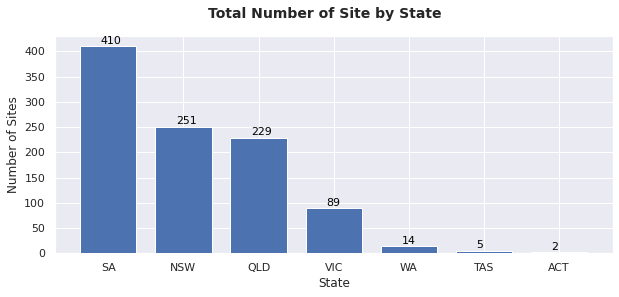

In [ ]:
d_total_site = data_site.groupby(["state"]).agg(['count'])['site_id']
d_total_site = d_total_site.sort_values('count', ascending=False)
d_total_site = d_total_site.reset_index()  

fig = plt.figure(figsize = (10,4))
ax = fig.add_subplot(1,1,1) 
ax.bar(d_total_site['state'], d_total_site['count'], 0.75, zorder=3)
ax.set_xlabel('State', fontsize = 12)
ax.set_ylabel('Number of Sites', fontsize = 12)
for j in d_total_site.index:
    ax.text(-0.1+j, d_total_site['count'][j]+5, d_total_site['count'][j] ,size=11, rotation=0, color='black')

#ax.hlines(y=50, xmin=2006, xmax=2020, ls=':', lw=4, color='black', zorder=4)
ax.grid(axis='y', zorder=0)
plt.suptitle("Total Number of Site by State",
                 fontsize=14, fontweight='bold')
plt.show

### Loading Weather Data

In [ ]:
# Load Site Details
data_postcode_station = pd.read_excel(path + '/weather/postcode_weather_station_mapping.xlsx')

# Load Weather station data
os.chdir(path + '/weather')

temp = os.listdir()
filenames = fnmatch.filter(temp, 'HD01D_Data_*_*.txt')
#filenames = fnmatch.filter(temp, 'HD01D_Data_031011_999999999856877.txt')

# Initialise DataFrame
data_weather = pd.DataFrame(columns=['timestamp','Station Number','Air Temperature in degrees Celsius', 'Quality of air temperature','Relative humidity in percentage %', 'Quality of relative humidity'])

for f in sorted(filenames):
    # load the .csv dataset using the function read_csv, which is part of the pandas library
    %time data = pd.read_csv(f, header=0, low_memory=False)
    print('Loading data... ', f)

    data = data[(data['MI format in Local standard time']%5==0)]
    data['timestamp']=pd.to_datetime(dict(year=data[' Year Month Day Hour Minutes in YYYY'], month=data['MM'], day=data['DD'], hour=data['HH24'], minute=data['MI format in Local standard time'])).dt.tz_localize("Australia/Brisbane")
    data=data[['timestamp','Station Number','Air Temperature in degrees Celsius', 'Quality of air temperature','Relative humidity in percentage %', 'Quality of relative humidity']]
    
    data_weather = pd.concat([data_weather, data], ignore_index=True, sort=False)

# Change weather metrics to numeric
data_weather['Air Temperature in degrees Celsius'] = pd.to_numeric(data_weather['Air Temperature in degrees Celsius'], errors='coerce')
data_weather['Relative humidity in percentage %'] = pd.to_numeric(data_weather['Relative humidity in percentage %'], errors='coerce')

CPU times: user 1.18 s, sys: 43.1 ms, total: 1.22 s
Wall time: 1.52 s
Loading data...  HD01D_Data_031011_999999999856877.txt
CPU times: user 1.15 s, sys: 114 ms, total: 1.27 s
Wall time: 1.54 s
Loading data...  HD01D_Data_032040_999999999856877.txt
CPU times: user 1.13 s, sys: 40.5 ms, total: 1.17 s
Wall time: 1.48 s
Loading data...  HD01D_Data_033045_999999999856877.txt
CPU times: user 1.14 s, sys: 32.9 ms, total: 1.18 s
Wall time: 1.49 s
Loading data...  HD01D_Data_033210_999999999856877.txt
CPU times: user 1.14 s, sys: 39.1 ms, total: 1.18 s
Wall time: 1.49 s
Loading data...  HD01D_Data_033247_999999999856877.txt
CPU times: user 1.15 s, sys: 30.1 ms, total: 1.18 s
Wall time: 1.5 s
Loading data...  HD01D_Data_035134_999999999856877.txt
CPU times: user 1.16 s, sys: 50.2 ms, total: 1.21 s
Wall time: 1.5 s
Loading data...  HD01D_Data_035264_999999999856877.txt
CPU times: user 1.19 s, sys: 40.2 ms, total: 1.23 s
Wall time: 1.54 s
Loading data...  HD01D_Data_039083_999999999856877.txt
CPU

#### Looking at a sample of the data

In [ ]:
data_weather.tail(5)

,timestamp,Station Number,Air Temperature in degrees Celsius,Quality of air temperature,Relative humidity in percentage %,Quality of relative humidity
3258745,2019-12-31 23:40:00+10:00,140009,21.4,Y,85.0,Y
3258746,2019-12-31 23:45:00+10:00,140009,21.6,Y,85.0,Y
3258747,2019-12-31 23:50:00+10:00,140009,21.8,Y,84.0,Y
3258748,2019-12-31 23:55:00+10:00,140009,21.9,Y,84.0,Y
3258749,2020-01-01 00:00:00+10:00,140009,22.0,Y,84.0,Y


#### Descriptive Statistics
Viewing some basic statistical details like percentile, mean, std etc. of a data frame or a series of numeric values.

In [ ]:
# Descriptive Statistics
pd.DataFrame(data_weather.describe())

,Air Temperature in degrees Celsius,Relative humidity in percentage %
count,3.240844e+06,3.239026e+06
mean,2.129109e+01,6.817536e+01
std,6.098183e+00,2.137174e+01
min,-5.000000e+00,0.000000e+00
25%,1.740000e+01,5.400000e+01
50%,2.190000e+01,7.100000e+01
75%,2.540000e+01,8.600000e+01
max,4.310000e+01,1.000000e+02


#### Getting dataframe information

In [ ]:
# Getting dataframe information
print(data_weather.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3258750 entries, 0 to 3258749
Data columns (total 6 columns):
 #   Column                              Dtype                             
---  ------                              -----                             
 0   timestamp                           datetime64[ns, Australia/Brisbane]
 1   Station Number                      object                            
 2   Air Temperature in degrees Celsius  float64                           
 3   Quality of air temperature          object                            
 4   Relative humidity in percentage %   float64                           
 5   Quality of relative humidity        object                            
dtypes: datetime64[ns, Australia/Brisbane](1), float64(2), object(3)
memory usage: 149.2+ MB
None


In [ ]:
# Do we have duplicate data?
%time data_weather.duplicated(keep=False).value_counts()

# List columns that contain null values
df = pd.DataFrame({'Null-Value Percentage': data_weather.isna().mean().round(4) * 100})
df[df['Null-Value Percentage'] > 0]

CPU times: user 1.43 s, sys: 21.2 ms, total: 1.45 s
Wall time: 1.46 s


,Null-Value Percentage
Air Temperature in degrees Celsius,0.55
Relative humidity in percentage %,0.61


#### Filter to weather stations in North Queensland only

In [ ]:
data_weather = data_weather[(data_weather['Station Number'].isin(selected_weather_stations))]

### Loading Solar Irradiance Data

In [ ]:
# Load Weather Stations Details
data_weather_station = pd.read_csv(path + '/weather/HD01D_StnDet_999999999856877.txt', header=None)
data_weather_station = data_weather_station.loc[:,[1,3,6,7]]
data_weather_station.columns = ['station_number', 'station_name', 'latitude', 'longitude']

# Filter to selected weather station only
data_weather_station = data_weather_station[(data_weather_station['station_number'].isin(data_weather['Station Number'].unique()))]
data_weather_station.reset_index(drop=True)

,station_number,station_name,latitude,longitude
0,33210,ST LAWRENCE,-22.3472,149.5242
1,33045,MACKAY AERO,-21.1706,149.1794
2,33247,PROSERPINE AIRPORT,-20.4925,148.5550
3,32040,TOWNSVILLE AERO,-19.2483,146.7661
4,31011,CAIRNS AERO,-16.8736,145.7458


In [ ]:
# Calculate clear-sky GHI and transpose to plane of array
# Define a function so that we can re-use the sequence of operations with
# different weather stations
def get_irradiance(site_location, start_date, end_date):
    # Creates one day's worth of 1 min intervals
    times = pd.date_range(start=start_date, end=end_date, freq='min', tz=site_location.tz)
    # Generate clearsky data using the Ineichen model, which is the default
    # The get_clearsky method returns a dataframe with values for GHI, DNI,
    # and DHI
    clearsky = site_location.get_clearsky(times)

    # Construct datafrmae
    df = pd.DataFrame({'station_number': site_location.name,
                         'ghi': clearsky['ghi'],
                         'dni': clearsky['dni'],
                         'dhi': clearsky['dhi']})   
    
    df.index.name='timestamp'
    
    # Resampling with average over 5 minutes    
    df = df.resample('5Min', label='right').mean()
    df = df.reset_index()
    return df    

In [ ]:
# Initialise DataFrame
data_solar_irradiance = pd.DataFrame(columns=['timestamp','station_number','ghi','dni','dhi'])

# Setting up for Queensland timezone and geo-coordinates
tz = 'Australia/Brisbane'

for station_number in data_weather_station['station_number'].unique():
    number, name, lat, lon = data_weather_station[(data_weather_station['station_number']==station_number)][['station_number', 'station_name', 'latitude', 'longitude']].iloc[0,:]
    site = location.Location(lat, lon, tz=tz, name=number)
    print('Getting Irradiance data... ', number, name)
    data = get_irradiance(site, '2019-01-01 00:00:00', '2019-12-31 23:59:55')
    data_solar_irradiance = pd.concat([data_solar_irradiance, data], ignore_index=True, sort=False)

Getting Irradiance data...  33210 ST LAWRENCE                             
Getting Irradiance data...  33045 MACKAY AERO                             
Getting Irradiance data...  33247 PROSERPINE AIRPORT                      
Getting Irradiance data...  32040 TOWNSVILLE AERO                         
Getting Irradiance data...  31011 CAIRNS AERO                             


#### Looking at a sample of the data

In [ ]:
data_solar_irradiance.tail(15)

,timestamp,station_number,ghi,dni,dhi
525585,2019-12-31 22:50:00+10:00,31011,0.0,0.0,0.0
525586,2019-12-31 22:55:00+10:00,31011,0.0,0.0,0.0
525587,2019-12-31 23:00:00+10:00,31011,0.0,0.0,0.0
525588,2019-12-31 23:05:00+10:00,31011,0.0,0.0,0.0
525589,2019-12-31 23:10:00+10:00,31011,0.0,0.0,0.0
525590,2019-12-31 23:15:00+10:00,31011,0.0,0.0,0.0
525591,2019-12-31 23:20:00+10:00,31011,0.0,0.0,0.0
525592,2019-12-31 23:25:00+10:00,31011,0.0,0.0,0.0
525593,2019-12-31 23:30:00+10:00,31011,0.0,0.0,0.0
525594,2019-12-31 23:35:00+10:00,31011,0.0,0.0,0.0


#### Descriptive Statistics
Viewing some basic statistical details like percentile, mean, std etc. of a data frame or a series of numeric values.

In [ ]:
# Descriptive Statistics
pd.DataFrame(data_solar_irradiance.describe())

,ghi,dni,dhi
count,525600.000000,525600.000000,525600.000000
mean,280.322513,358.332079,42.021727
std,361.811306,398.758877,49.549192
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.171082,1.808836,0.153850
75%,607.529841,827.150231,85.535681
max,1077.273756,972.228826,156.414572


#### Getting dataframe information

In [ ]:
# Getting dataframe information
print(data_solar_irradiance.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 5 columns):
 #   Column          Non-Null Count   Dtype                             
---  ------          --------------   -----                             
 0   timestamp       525600 non-null  datetime64[ns, Australia/Brisbane]
 1   station_number  525600 non-null  object                            
 2   ghi             525600 non-null  float64                           
 3   dni             525600 non-null  float64                           
 4   dhi             525600 non-null  float64                           
dtypes: datetime64[ns, Australia/Brisbane](1), float64(3), object(1)
memory usage: 20.1+ MB
None


### Data Preparation and Cleansing
Several steps are undertaken for cleaning and preparing the dataset 

 




#### Solar Analytics Data

In [ ]:
# Convert date 
data_solar_analytics['timestamp'] = pd.to_datetime(data_solar_analytics['t_stamp_utc']).dt.tz_convert("Australia/Brisbane")

# Number of unique sites
print("Number of Unique Site: ", data_solar_analytics["site_id"].unique().shape[0])

# Number of postcode
print("Number of Unique Postcode: ", data_solar_analytics["postcode"].unique().shape[0])

Number of Unique Site:  207
Number of Unique Postcode:  114


##### Examine Number of site by month
There are 3 extra sites in April and December compared to other month. This needs to be investigated.

<function matplotlib.pyplot.show>

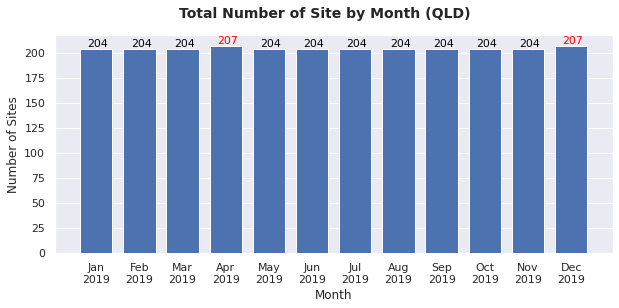

In [ ]:
month_label = ['Jan\n2019','Feb\n2019','Mar\n2019','Apr\n2019','May\n2019','Jun\n2019','Jul\n2019','Aug\n2019','Sep\n2019','Oct\n2019','Nov\n2019','Dec\n2019']

d_total_site = data_solar_analytics.groupby(pd.to_datetime(data_solar_analytics['t_stamp_utc']).dt.month).agg({"site_id": "nunique"})
d_total_site = d_total_site.reset_index()  
d_total_site.columns = ['month','site_count']

fig = plt.figure(figsize = (10,4))
ax = fig.add_subplot(1,1,1) 
ax.bar(d_total_site['month'], d_total_site['site_count'], 0.75, zorder=3)
ax.set_xlabel('Month', fontsize = 12)
ax.set_ylabel('Number of Sites', fontsize = 12)
for j in d_total_site.index:
    color = 'black' if d_total_site['site_count'][j] == 204 else 'red'
    ax.text(0.8+j, d_total_site['site_count'][j]+2, d_total_site['site_count'][j] ,size=11, rotation=0, color=color)

#add monthlabels to the xaxis
ax.set_xticks(np.arange(1,13))
ax.set_xticklabels(month_label) 
#ax.hlines(y=50, xmin=2006, xmax=2020, ls=':', lw=4, color='black', zorder=4)
ax.grid(axis='y', zorder=0)
plt.suptitle("Total Number of Site by Month (QLD)",
                 fontsize=14, fontweight='bold')
plt.show

##### Remove the extra 3 sites
In order to get a consistent number of site throughout the year, the data of the 3 additional sites in April and December are removed.

In [ ]:
# Get the 3 extra site and remove it
d_site_by_month = data_solar_analytics[["site_id","t_stamp_utc"]]
d_site_by_month['month'] = pd.to_datetime(data_solar_analytics['t_stamp_utc']).dt.month

d_site_by_month = d_site_by_month.drop(columns=['t_stamp_utc'])

d_site_by_month = d_site_by_month.groupby(['site_id']).nunique()
missing_site = (d_site_by_month[(d_site_by_month['month']<12)]).index.tolist()

# Delete rows 
data_solar_analytics = data_solar_analytics[~data_solar_analytics['site_id'].isin(missing_site)]

##### Check again after removing 3 sites

<function matplotlib.pyplot.show>

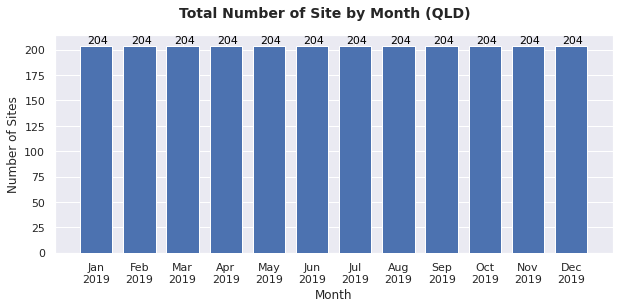

In [ ]:
d_total_site = data_solar_analytics.groupby(pd.to_datetime(data_solar_analytics['t_stamp_utc']).dt.month).agg({"site_id": "nunique"})
d_total_site = d_total_site.reset_index()  
d_total_site.columns = ['month','site_count']

fig = plt.figure(figsize = (10,4))
ax = fig.add_subplot(1,1,1) 
ax.bar(d_total_site['month'], d_total_site['site_count'], 0.75, zorder=3)
ax.set_xlabel('Month', fontsize = 12)
ax.set_ylabel('Number of Sites', fontsize = 12)
for j in d_total_site.index:
    ax.text(0.8+j, d_total_site['site_count'][j]+2, d_total_site['site_count'][j] ,size=11, rotation=0, color='black')

#add monthlabels to the xaxis
ax.set_xticks(np.arange(1,13))
ax.set_xticklabels(month_label) 
#ax.hlines(y=50, xmin=2006, xmax=2020, ls=':', lw=4, color='black', zorder=4)
ax.grid(axis='y', zorder=0)
plt.suptitle("Total Number of Site by Month (QLD)",
                 fontsize=14, fontweight='bold')
plt.show

##### Check for missing 5-min data
No further process is performed at the moment. For our study, the energy output is assumed to be a function of weather variables in 5 mins interval.

In [ ]:
# Check missing 5 mins data
d_site_row_count = data_solar_analytics[["site_id","t_stamp_utc"]]

d_site_row_count = d_site_row_count.groupby(['site_id']).nunique()
missing_data = (d_site_row_count[(d_site_row_count['t_stamp_utc']<(12*24*365))]).index.tolist()

# Pivot table so row as timestamp and missing site as column with energy(Wh)
pivot_table = data_solar_analytics[(data_solar_analytics['site_id'].isin(missing_data))].pivot_table(index = ["t_stamp_utc"],columns = ["site_id"], values = "energy_(Wh)", aggfunc=np.mean)
pivot_table[pivot_table.isnull().any(axis=1)].tail(10)

site_id,46273932,92071696,131097238,133852058,173994775,186331009,230589246,241271752,264445722,315622138,327993590,373739408,396552888,402468830,408450837,429924320,459991966,487359656,493288080,514248804,523047866,558829996,577341905,586503715,593507228,602393300,689045440,731480064,750212792,758907147,762981793,797841169,807568245,824423051,957928559,981959413,1035697819,1053641683,1061716286,1064203251,1112438379,1150449095,1201849983,1210720804,1254500003,1292510239,1308414311,1323929011,1437471778,1451036406,1491221868,1545540591,1559939172,1565220907,1584676388,1704118180,1739245808,1768115669,1874388346,1883623070,1889835205,1900158835,1953975853,1965574328,1999038196,2046587705,2073090346,2147461500
t_stamp_utc,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-12-31 23:10:00+00:00,NaN,322.1428,178.0150,159.4733,338.3992,210.9289,-0.2292,330.7553,268.4158,357.3733,338.6703,NaN,334.1364,316.0753,163.4925,70.4631,228.9900,293.0883,145.9714,316.0264,352.8667,349.0436,357.2475,390.3156,351.9678,289.9361,146.1211,240.3892,259.5019,303.2675,159.6208,293.2172,112.9267,357.6867,268.0128,381.4794,123.9294,187.9025,79.7508,160.7242,316.1864,210.8367,385.8258,410.8189,305.7372,393.0147,229.9947,NaN,158.8414,278.6392,202.1303,195.3264,162.7361,329.8094,318.1853,369.9656,232.5106,320.6433,339.2306,272.2664,253.0328,246.1814,114.4783,109.0264,234.2872,132.1636,239.9136,385.0242
2019-12-31 23:15:00+00:00,NaN,327.0872,252.1283,164.1964,341.8956,215.8147,-0.2272,332.1239,281.9211,237.1422,341.7394,NaN,341.1381,139.4656,200.6286,78.5519,223.1733,148.1689,302.7342,286.0244,359.3414,348.5047,363.1286,414.8583,355.2386,353.8714,103.4258,181.5322,268.3458,319.8792,229.7131,301.3469,110.7983,357.8778,272.4464,392.9683,84.5939,210.5214,135.7558,98.3806,340.4628,219.3056,399.5136,410.6694,316.9728,393.0344,236.5917,NaN,156.6278,281.3478,217.7069,369.6078,171.8964,152.7225,322.2928,374.2392,209.7519,409.1653,345.6831,391.5475,257.4975,173.5981,134.1681,177.5881,237.7261,96.4358,360.2567,188.1686
2019-12-31 23:20:00+00:00,NaN,334.7617,319.7208,168.3283,346.3425,221.8678,-0.2275,334.2981,287.1581,207.0600,346.7994,NaN,344.7614,257.1203,176.9436,100.9975,310.6908,151.5933,296.2108,281.4047,363.1197,348.3883,368.1375,420.0961,361.0522,282.8792,129.5656,205.2372,188.7789,325.8814,365.7828,307.7931,116.9586,363.7861,277.0792,399.6097,107.8403,143.7528,176.1803,176.5625,345.7953,225.4736,163.5122,410.6042,325.9092,397.7617,238.4297,NaN,160.1081,281.7286,221.8381,192.3139,148.4367,128.0583,327.7267,378.0628,147.5183,279.7094,353.3828,395.9058,256.0361,310.0100,131.7108,260.3792,242.1958,147.2433,359.8158,345.1872
2019-12-31 23:25:00+00:00,NaN,341.4083,341.9753,172.9736,350.4211,215.2486,-0.2278,335.3983,290.1258,335.4594,351.7992,NaN,360.9028,207.8758,196.3419,229.4853,299.1706,201.6678,315.2303,146.8217,364.5525,360.1039,376.7619,416.4336,363.2761,273.4028,135.5506,74.8450,302.1356,332.7719,324.9103,312.9414,99.3333,315.4831,279.9194,404.8547,200.8589,194.2650,158.0544,175.8147,326.8456,228.8958,356.6056,411.2178,311.4608,196.9161,248.1947,NaN,168.9767,283.0628,241.1783,161.3875,185.0978,167.9272,332.5261,382.2611,187.8097,275.1394,359.5942,152.4428,253.0928,361.5178,135.9106,217.0439,246.8936,51.0950,261.3336,404.2689
2019-12-31 23:30:00+00:00,NaN,350.5539,297.8247,176.9781,355.6050,215.7881,-0.2297,334.6883,289.4228,NaN,358.3636,NaN,370.5775,420.3894,346.0267,89.0144,304.9978,407.7586,373.6911,387.4025,369.8117,366.5903,386.1183,420.1786,365.9111,239.8136,137.4647,178.3064,300.3944,340.8028,360.3506,318.3464,180.6636,285.3500,284.0811,406.3150,194.9775,239.8817,101.6208,173.9633,366.9019,233.4942,382.5017,411.5494,319.8517,119.1711,243.9056,NaN,172.1461,285.4922,249.7800,135.5847,171.2419,144.0769,336.4678,388.5464,154.2200,182.4475,363.2531,266.0639,260.2158,357.5664,144.3550,320.4181,251.7778,77.4486,239.1689,408.8806
2019-12-31 23:35:00+00:00,NaN,356.2956,213.0467,181.3072,359.4936,216.1925,-0.2303,336.5850,264.9439,346.943

In [ ]:
# List columns(site) that contain null values
df = pd.DataFrame({'Null-Value Percentage': pivot_table.isna().mean().round(4) * 100})
df[df['Null-Value Percentage'] > 0]

,Null-Value Percentage
site_id,
46273932,0.39
315622138,0.01
327993590,0.01
373739408,0.39
558829996,0.01
577341905,0.01
689045440,0.02
758907147,0.02
1150449095,0.02


##### Check and remove for duplication

In [ ]:
# Do we have duplicate data?
%time data_solar_analytics.duplicated(keep=False).value_counts()

CPU times: user 19.5 s, sys: 2.74 s, total: 22.2 s
Wall time: 22.3 s


False    21385349
True       115788
dtype: int64

Duplicate data mainly occur on 17 Apr, 30 Dec and 31 Dec.

In [ ]:
duplicateDFRow = data_solar_analytics[data_solar_analytics.duplicated(keep=False)]
print(duplicateDFRow["t_stamp_utc"].sort_values().unique())

['2019-04-07 14:00:00+00:00' '2019-12-30 14:00:00+00:00'
 '2019-12-30 14:05:00+00:00' '2019-12-30 14:10:00+00:00'
 '2019-12-30 14:15:00+00:00' '2019-12-30 14:20:00+00:00'
 '2019-12-30 14:25:00+00:00' '2019-12-30 14:30:00+00:00'
 '2019-12-30 14:35:00+00:00' '2019-12-30 14:40:00+00:00'
 '2019-12-30 14:45:00+00:00' '2019-12-30 14:50:00+00:00'
 '2019-12-30 14:55:00+00:00' '2019-12-30 15:00:00+00:00'
 '2019-12-30 15:05:00+00:00' '2019-12-30 15:10:00+00:00'
 '2019-12-30 15:15:00+00:00' '2019-12-30 15:20:00+00:00'
 '2019-12-30 15:25:00+00:00' '2019-12-30 15:30:00+00:00'
 '2019-12-30 15:35:00+00:00' '2019-12-30 15:40:00+00:00'
 '2019-12-30 15:45:00+00:00' '2019-12-30 15:50:00+00:00'
 '2019-12-30 15:55:00+00:00' '2019-12-30 16:00:00+00:00'
 '2019-12-30 16:05:00+00:00' '2019-12-30 16:10:00+00:00'
 '2019-12-30 16:15:00+00:00' '2019-12-30 16:20:00+00:00'
 '2019-12-30 16:25:00+00:00' '2019-12-30 16:30:00+00:00'
 '2019-12-30 16:35:00+00:00' '2019-12-30 16:40:00+00:00'
 '2019-12-30 16:45:00+00:00' '2

In [ ]:
# Drop duplicates
data_solar_analytics = data_solar_analytics.drop_duplicates()

In [ ]:
# Check for duplicate again
%time data_solar_analytics.duplicated(keep=False).value_counts()

CPU times: user 20.4 s, sys: 235 ms, total: 20.7 s
Wall time: 20.7 s


False    21443243
dtype: int64

In [ ]:
# List columns that contain null values - should be no more
df = pd.DataFrame({'Null-Value Percentage': data_solar_analytics.isna().mean().round(4) * 100})
df[df['Null-Value Percentage'] > 0]

,Null-Value Percentage
voltage_max_(V),0.12
voltage_min_(V),0.12
Unnamed: 4,100.00
States,100.00
No. of Customers,100.00


##### Drop columns that are not required

In [ ]:
# Drop columns - there are not required in the study
data_solar_analytics = data_solar_analytics.drop(columns=['voltage_max_(V)','voltage_min_(V)','t_stamp_utc','timezone_id','state','Unnamed: 4','States','No. of Customers'])

##### Check for Negative Values

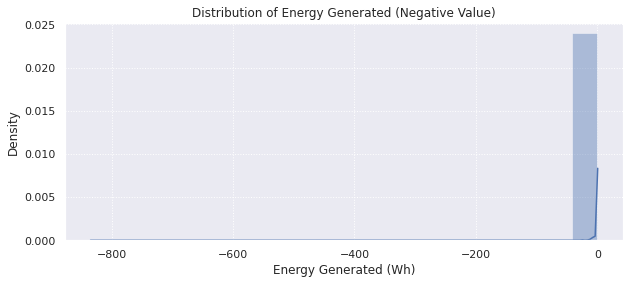

In [ ]:
fig = plt.figure(figsize=[10, 4])
ax = fig.add_subplot(1,1,1) 
sns.distplot(data_solar_analytics[(data_solar_analytics['energy_(Wh)']<0)]['energy_(Wh)'], bins=20, ax=ax)
ax.set(xlabel='Energy Generated (Wh)', ylabel='Density', title='Distribution of Energy Generated (Negative Value)')
ax.grid(linestyle='dotted')

plt.show()

In [ ]:
data_solar_analytics[(data_solar_analytics['energy_(Wh)']<-100)].head(10)

,site_id,energy_(Wh),postcode,timestamp
58270,51254079,-134.443300,4717,2019-01-17 17:50:00+10:00
2730485,1150449095,-155.331389,4012,2019-02-22 10:55:00+10:00
3526763,51254079,-109.440600,4717,2019-03-25 08:00:00+10:00
3526764,51254079,-112.930800,4717,2019-03-25 08:05:00+10:00
3526765,51254079,-107.811700,4717,2019-03-25 08:10:00+10:00
3526770,51254079,-139.468100,4717,2019-03-25 08:35:00+10:00
5341186,51254079,-239.202500,4717,2019-04-07 10:00:00+10:00
5341187,51254079,-246.948611,4717,2019-04-07 10:05:00+10:00
5341188,51254079,-271.548889,4717,2019-04-07 10:10:00+10:00
5341189,51254079,-252.360556,4717,2019-04-07 10:15:00+10:00


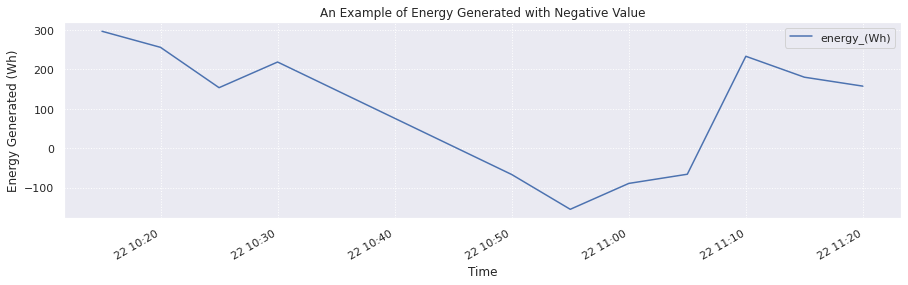

In [ ]:
# Plot one site to see the trend (negative, early morning)
df = data_solar_analytics.loc[2730480:2730490]

fig = plt.figure(figsize=[15, 4])
ax = fig.add_subplot(1,1,1) 
df.plot(y='energy_(Wh)',x='timestamp', ax=ax)
ax.set(xlabel='Time', ylabel='Energy Generated (Wh)', title='An Example of Energy Generated with Negative Value')
ax.grid(linestyle='dotted')

plt.show()

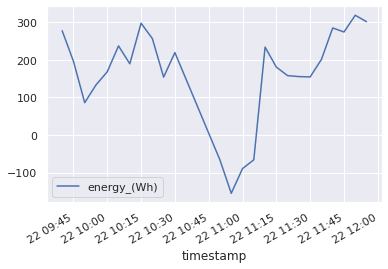

In [ ]:
# Plot another site to see the trend (negative, daytime)
data_solar_analytics.loc[2730473:2730497].plot(y='energy_(Wh)',x='timestamp')

##### Remove record with negative energy generated 
Records with negative energy generated values as this study is related to energy generated.

In [ ]:
# Delete rows 
# 21443243 - Total
# 11989455 - Greater than or equal to 0
#  9453788 - Less than 0
data_solar_analytics = data_solar_analytics[(data_solar_analytics['energy_(Wh)']>=0)]

##### Check Minimum and Maximum Timestamps

In [ ]:
# Minimum and Maximum timestamp
print(min(data_solar_analytics['timestamp']))
print(max(data_solar_analytics['timestamp']))

2019-01-01 10:00:00+10:00
2020-01-01 09:55:00+10:00


#### Weather Data

##### Check quality of temperature and relative humidity data

In [ ]:
# Do we have good quality temperature data?
# =========================================
# Y: quality controlled and acceptable
# N: not quality controlled
# S: quality controlled and considered suspect
# W: quality controlled and considered wrong
# I: quality controlled and inconsistent with other known information
# U: element not observed
# R: element removed
# F: no quality control performed
data_weather['Quality of air temperature'].value_counts()

Y    521808
       3152
F       637
I         6
S         2
Name: Quality of air temperature, dtype: int64

##### Examine temperature that has no quality control performed


In [ ]:
data_weather[(data_weather['Quality of air temperature']=='F')]

,timestamp,Station Number,Air Temperature in degrees Celsius,Quality of air temperature,Relative humidity in percentage %,Quality of relative humidity
12769,2019-02-14 08:05:00+10:00,31011,NaN,F,NaN,F
12792,2019-02-14 10:00:00+10:00,31011,NaN,F,NaN,F
12804,2019-02-14 11:00:00+10:00,31011,NaN,F,NaN,F
14266,2019-02-19 12:50:00+10:00,31011,NaN,F,NaN,F
14273,2019-02-19 13:25:00+10:00,31011,NaN,F,NaN,F
...,...,...,...,...,...,...
428982,2019-01-30 12:10:00+10:00,33247,NaN,F,NaN,F
429588,2019-02-01 14:40:00+10:00,33247,NaN,F,NaN,F
484238,2019-08-10 08:50:00+10:00,33247,NaN,F,NaN,F
504168,2019-10-18 13:40:00+10:00,33247,NaN,F,NaN,F


##### Examine temperature with quality controlled and inconsistent with other known information

In [ ]:
data_weather[(data_weather['Quality of air temperature']=='I')]

,timestamp,Station Number,Air Temperature in degrees Celsius,Quality of air temperature,Relative humidity in percentage %,Quality of relative humidity
114717,2019-02-03 07:40:00+10:00,32040,24.1,I,100.0,Y
114722,2019-02-03 08:05:00+10:00,32040,24.1,I,100.0,Y
114725,2019-02-03 08:20:00+10:00,32040,24.0,I,100.0,Y
114863,2019-02-03 19:50:00+10:00,32040,23.9,I,100.0,Y
114914,2019-02-04 00:05:00+10:00,32040,23.0,I,100.0,Y
165925,2019-07-31 03:00:00+10:00,32040,13.8,I,100.0,Y


##### Examine temperature with quality controlled and considered suspect

In [ ]:
data_weather[(data_weather['Quality of air temperature']=='S')]

,timestamp,Station Number,Air Temperature in degrees Celsius,Quality of air temperature,Relative humidity in percentage %,Quality of relative humidity
26369,2019-04-02 13:25:00+10:00,31011,2.4,S,90.0,Y
26370,2019-04-02 13:30:00+10:00,31011,19.9,S,89.0,Y


This looks like there are outliers of temperature reading for Cairns on April 02. It is unlikely for Cainrs to experience 2 degree Celsius in the month of April.

In [ ]:
data_weather[(pd.to_datetime(data_weather['timestamp']).dt.month==4)&(pd.to_datetime(data_weather['timestamp']).dt.day==2)&
             (data_weather['Quality of air temperature']!='Y')&(data_weather['Station Number']==31011)]

,timestamp,Station Number,Air Temperature in degrees Celsius,Quality of air temperature,Relative humidity in percentage %,Quality of relative humidity
26353,2019-04-02 12:05:00+10:00,31011,NaN,F,88.0,Y
26354,2019-04-02 12:10:00+10:00,31011,NaN,F,89.0,Y
26355,2019-04-02 12:15:00+10:00,31011,NaN,F,86.0,Y
26356,2019-04-02 12:20:00+10:00,31011,NaN,F,88.0,Y
26357,2019-04-02 12:25:00+10:00,31011,NaN,F,90.0,Y
26358,2019-04-02 12:30:00+10:00,31011,NaN,F,88.0,Y
26359,2019-04-02 12:35:00+10:00,31011,NaN,F,87.0,Y
26360,2019-04-02 12:40:00+10:00,31011,NaN,F,90.0,Y
26361,2019-04-02 12:45:00+10:00,31011,NaN,,NaN,
26362,2019-04-02 12:50:00+10:00,31011,NaN,,NaN,


##### Examine temperature that has quality flag blank

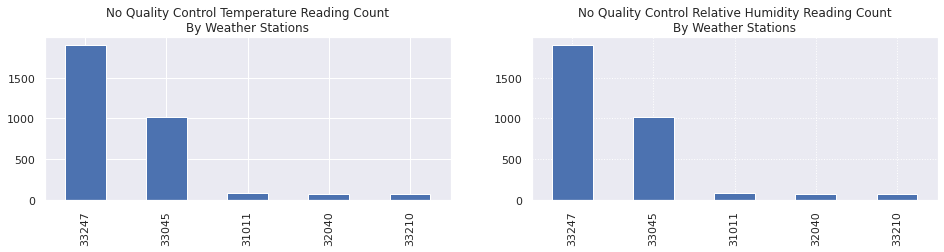

In [ ]:
# Looking into data with quality blank
fig = plt.figure(figsize=[16, 3])
ax = fig.add_subplot(1,2,1) 
data_weather[(data_weather['Quality of air temperature']==' ')]['Station Number'].value_counts().plot.bar(x='Quality of air temperature', y='count', title='No Quality Control Temperature Reading Count\nBy Weather Stations' , rot=90, ax=ax)
ax = fig.add_subplot(1,2,2) 
data_weather[(data_weather['Quality of relative humidity']==' ')]['Station Number'].value_counts().plot.bar(x='Quality of relative humidity', y='count', title='No Quality Control Relative Humidity Reading Count\nBy Weather Stations' , rot=90, ax=ax)
ax.grid(linestyle='dotted')
plt.show()

In [ ]:
# Reload and examine
filename = path + '/weather/HD01D_Data_031011_999999999856877.txt'
%time data = pd.read_csv(filename, header=0)
data[(data['MM']==4)&(data['DD']==2)&(data['HH24']==16)]  

CPU times: user 970 ms, sys: 33.9 ms, total: 1 s
Wall time: 1.09 s


,hd,Station Number,Year Month Day Hour Minutes in YYYY,MM,DD,HH24,MI format in Local standard time,Air Temperature in degrees Celsius,Quality of air temperature,Air temperature (1-minute maximum) in degrees Celsius,Quality of air temperature (1-minute maximum),Air temperature (1-minute minimum) in degrees Celsius,Quality of air temperature (1-minute minimum),Relative humidity in percentage %,Quality of relative humidity,Relative humidity (1 minute maximum) in percentage %,Quality of relative humidity (1 minute maximum),Relative humidity (1 minute minimum) in percentage %,Quality of Relative humidity (1 minute minimum),#
132001,hd,31011,2019,4,2,16,0,25.8,Y,26.1,Y,25.8,Y,82,Y,82,Y,81,Y,#
132002,hd,31011,2019,4,2,16,1,25.6,Y,25.8,Y,25.6,Y,84,Y,84,Y,82,Y,#
132003,hd,31011,2019,4,2,16,2,25.5,Y,25.6,Y,25.5,Y,83,Y,84,Y,83,Y,#
132004,hd,31011,2019,4,2,16,3,25.5,Y,25.5,Y,25.5,Y,84,Y,84,Y,83,Y,#
132005,hd,31011,2019,4,2,16,4,,,,,,,,,,,,,#
132006,hd,31011,2019,4,2,16,5,25.4,Y,25.5,Y,25.4,Y,85,Y,85,Y,84,Y,#
132007,hd,31011,2019,4,2,16,6,25.4,Y,25.5,Y,25.4,Y,85,Y,85,Y,84,Y,#
132008,hd,31011,2019,4,2,16,7,25.6,Y,25.6,Y,25.4,Y,84,Y,85,Y,84,Y,#
132009,hd,31011,2019,4,2,16,8,25.6,Y,25.6,Y,25.5,Y,82,I,84,Y,82,Y,#
132010,hd,31011,2019,4,2,16,9,,F,,F,,F,83,Y,83,Y,82,Y,#


##### Interpolate missing values
Before interpolate, temperature reading with quality status of "S" are removed, as they deemed to be inaccurate. These shall be filled by interpolation as well.

Missing values are filled using interpolate linear method. This is deemed to be appropriate as the interval between records are considered small (1 minutes interval).

It is found that the interpolation has performed good. For example for 12:02 and 12:03, the interpolated values are closed to the minimum temperature, which has a quality of 'Y'.

In [ ]:
# Convert to numeric before interpolate
data['Air Temperature in degrees Celsius'] = pd.to_numeric(data['Air Temperature in degrees Celsius'], errors='coerce')
data['Relative humidity in percentage %'] = pd.to_numeric(data['Relative humidity in percentage %'], errors='coerce')
data.loc[(data['Quality of air temperature']=='S'),'Air Temperature in degrees Celsius'] = np.nan

# Interpolate missing data using linear
data = data.interpolate(method='linear', limit_direction='forward', axis=0)

# Examine the filled data
data[(data['MM']==4)&(data['DD']==2)&(data['HH24']==16)]  

,hd,Station Number,Year Month Day Hour Minutes in YYYY,MM,DD,HH24,MI format in Local standard time,Air Temperature in degrees Celsius,Quality of air temperature,Air temperature (1-minute maximum) in degrees Celsius,Quality of air temperature (1-minute maximum),Air temperature (1-minute minimum) in degrees Celsius,Quality of air temperature (1-minute minimum),Relative humidity in percentage %,Quality of relative humidity,Relative humidity (1 minute maximum) in percentage %,Quality of relative humidity (1 minute maximum),Relative humidity (1 minute minimum) in percentage %,Quality of Relative humidity (1 minute minimum),#
132001,hd,31011,2019,4,2,16,0,25.800000,Y,26.1,Y,25.8,Y,82.0,Y,82,Y,81,Y,#
132002,hd,31011,2019,4,2,16,1,25.600000,Y,25.8,Y,25.6,Y,84.0,Y,84,Y,82,Y,#
132003,hd,31011,2019,4,2,16,2,25.500000,Y,25.6,Y,25.5,Y,83.0,Y,84,Y,83,Y,#
132004,hd,31011,2019,4,2,16,3,25.500000,Y,25.5,Y,25.5,Y,84.0,Y,84,Y,83,Y,#
132005,hd,31011,2019,4,2,16,4,25.450000,,,,,,84.5,,,,,,#
132006,hd,31011,2019,4,2,16,5,25.400000,Y,25.5,Y,25.4,Y,85.0,Y,85,Y,84,Y,#
132007,hd,31011,2019,4,2,16,6,25.400000,Y,25.5,Y,25.4,Y,85.0,Y,85,Y,84,Y,#
132008,hd,31011,2019,4,2,16,7,25.600000,Y,25.6,Y,25.4,Y,84.0,Y,85,Y,84,Y,#
132009,hd,31011,2019,4,2,16,8,25.600000,Y,25.6,Y,25.5,Y,82.0,I,84,Y,82,Y,#
132010,hd,31011,2019,4,2,16,9,25.630000,F,,F,,F,83.0,Y,83,Y,82,Y,#


##### Averaging every 5 mins data 


In [ ]:
data.index=pd.to_datetime(dict(year=data[' Year Month Day Hour Minutes in YYYY'], month=data['MM'], day=data['DD'], hour=data['HH24'], minute=data['MI format in Local standard time'])).dt.tz_localize("Australia/Brisbane")
data.index.name='timestamp'
data=data[['Station Number','Air Temperature in degrees Celsius','Relative humidity in percentage %']]

data.tail(20)

,Station Number,Air Temperature in degrees Celsius,Relative humidity in percentage %
timestamp,,,
2019-12-31 23:41:00+10:00,31011,24.9,88.0
2019-12-31 23:42:00+10:00,31011,24.9,88.0
2019-12-31 23:43:00+10:00,31011,24.8,88.0
2019-12-31 23:44:00+10:00,31011,24.8,88.0
2019-12-31 23:45:00+10:00,31011,24.8,88.0
2019-12-31 23:46:00+10:00,31011,24.7,88.0
2019-12-31 23:47:00+10:00,31011,24.7,88.0
2019-12-31 23:48:00+10:00,31011,24.8,89.0
2019-12-31 23:49:00+10:00,31011,25.0,89.0


In [ ]:
data = data.resample('5Min').mean()
data = data.reset_index()
data.tail(10)

,timestamp,Station Number,Air Temperature in degrees Celsius,Relative humidity in percentage %
105112,2019-12-31 23:15:00+10:00,31011,25.42,87.4
105113,2019-12-31 23:20:00+10:00,31011,25.40,87.0
105114,2019-12-31 23:25:00+10:00,31011,25.18,87.0
105115,2019-12-31 23:30:00+10:00,31011,24.94,87.6
105116,2019-12-31 23:35:00+10:00,31011,24.86,88.0
105117,2019-12-31 23:40:00+10:00,31011,24.88,88.0
105118,2019-12-31 23:45:00+10:00,31011,24.80,88.4
105119,2019-12-31 23:50:00+10:00,31011,24.96,89.0
105120,2019-12-31 23:55:00+10:00,31011,24.78,89.0
105121,2020-01-01 00:00:00+10:00,31011,24.70,89.0


##### Reload Weather Data and Interpolate Missing Values

In [ ]:
data_weather = data_weather[['timestamp','Station Number','Air Temperature in degrees Celsius','Relative humidity in percentage %',]].head(0)

# Reload the data with interpolation
for f in sorted(filenames):
    # load the .csv dataset using the function read_csv, which is part of the pandas library
    %time data = pd.read_csv(f, header=0, low_memory=False)
    print(f)

    # Convert to numeric before interpolate
    data['Air Temperature in degrees Celsius'] = pd.to_numeric(data['Air Temperature in degrees Celsius'], errors='coerce')
    data['Relative humidity in percentage %'] = pd.to_numeric(data['Relative humidity in percentage %'], errors='coerce')

    # Remove suspect
    data.loc[(data['Quality of air temperature']=='S'),'Air Temperature in degrees Celsius'] = np.nan

    # Interpolate missing data using linear
    data = data.interpolate(method='linear', limit_direction='forward', axis=0)

    # New index: timestamp
    data.index=pd.to_datetime(dict(year=data[' Year Month Day Hour Minutes in YYYY'], month=data['MM'], day=data['DD'], hour=data['HH24'], minute=data['MI format in Local standard time'])).dt.tz_localize("Australia/Brisbane")
    data.index.name='timestamp'
    
    # Select columns needed
    data=data[['Station Number','Air Temperature in degrees Celsius','Relative humidity in percentage %']]

    # Filter to 5 minutes frequency by averaging data
    data = data.resample('5Min').mean()
    data = data.reset_index()
    
    # Concatenate the datasets
    data_weather = pd.concat([data_weather, data], ignore_index=True, sort=False)

CPU times: user 1.18 s, sys: 35.7 ms, total: 1.21 s
Wall time: 1.25 s
HD01D_Data_031011_999999999856877.txt
CPU times: user 1.18 s, sys: 34 ms, total: 1.22 s
Wall time: 1.5 s
HD01D_Data_032040_999999999856877.txt
CPU times: user 1.13 s, sys: 51.2 ms, total: 1.18 s
Wall time: 1.49 s
HD01D_Data_033045_999999999856877.txt
CPU times: user 1.14 s, sys: 50.1 ms, total: 1.19 s
Wall time: 1.49 s
HD01D_Data_033210_999999999856877.txt
CPU times: user 1.15 s, sys: 38.6 ms, total: 1.19 s
Wall time: 1.49 s
HD01D_Data_033247_999999999856877.txt
CPU times: user 1.17 s, sys: 37.7 ms, total: 1.21 s
Wall time: 1.51 s
HD01D_Data_035134_999999999856877.txt
CPU times: user 1.17 s, sys: 37.7 ms, total: 1.2 s
Wall time: 1.51 s
HD01D_Data_035264_999999999856877.txt
CPU times: user 1.18 s, sys: 37.2 ms, total: 1.21 s
Wall time: 1.52 s
HD01D_Data_039083_999999999856877.txt
CPU times: user 1.16 s, sys: 38.5 ms, total: 1.2 s
Wall time: 1.45 s
HD01D_Data_039089_999999999856877.txt
CPU times: user 1.15 s, sys: 46.1

In [ ]:
# List columns that contain null values - should be no more
df = pd.DataFrame({'Null-Value Percentage': data_weather.isna().mean().round(4) * 100})
df[df['Null-Value Percentage'] > 0]

,Null-Value Percentage


##### Rename columns 

In [ ]:
# Rename columns for ease of use
data_weather.columns = ['timestamp','station_number','temperature','relative_humidity']

##### Check Minimum and Maximum Timestamps

In [ ]:
# Minimum and Maximum timestamp
print(min(data_weather['timestamp']))
print(max(data_weather['timestamp']))

2018-12-31 23:55:00+10:00
2020-01-01 00:00:00+10:00


#### Solar Data

##### Check for Duplicate Data

In [ ]:
# Do we have duplicate data?
%time data_solar_irradiance.duplicated(keep=False).value_counts()

CPU times: user 225 ms, sys: 8.03 ms, total: 233 ms
Wall time: 234 ms


False    525600
dtype: int64

##### Check for Null Value

In [ ]:
# List columns that contain null values 
df = pd.DataFrame({'Null-Value Percentage': data_solar_irradiance.isna().mean().round(4) * 100})
df[df['Null-Value Percentage'] > 0]

,Null-Value Percentage


##### Check Minimum and Maximum Timestamps

In [ ]:
# Minimum and Maximum timestamp
print(min(data_solar_irradiance['timestamp']))
print(max(data_solar_irradiance['timestamp']))

2019-01-01 00:05:00+10:00
2020-01-01 00:00:00+10:00


##### Filter to weather stations in Northern Queensland only



In [ ]:
data_weather = data_weather[(data_weather['station_number'].isin(selected_weather_stations))]

#### Merge Solar Analytics Data and Weather Data

In [ ]:
# Remove rows in solar dataframe that have a timestamp in 2020
data_solar_analytics = data_solar_analytics[(data_solar_analytics['timestamp'] < '2020-01-01 00:00:00+10:00')]

# Merge solar and postcode weather station mapping
data_solar_analytics = pd.merge(data_solar_analytics, data_postcode_station.drop(columns=['suburb','station name']),  how='left', left_on=['postcode'], right_on = ['postcode'])
data_solar_analytics = data_solar_analytics.drop(columns=['postcode'])

# Merge with weather data
data_solar_analytics = pd.merge(data_solar_analytics, data_weather,  how='inner', left_on=['timestamp','station number'], right_on = ['timestamp','station_number'])
data_solar_analytics = data_solar_analytics.drop(columns=['station number'])

# Rename columns for ease of use
data_solar_analytics.columns = ['site_id','energy_generated','timestamp','station_number','temperature','relative_humidity']

# Look at some sample
data_solar_analytics.tail(5)

,site_id,energy_generated,timestamp,station_number,temperature,relative_humidity
831364,2046587705,9.7408,2019-12-30 18:45:00+10:00,33247,25.08,85.0
831365,2046587705,5.8300,2019-12-30 18:50:00+10:00,33247,25.10,85.2
831366,2046587705,1.5169,2019-12-30 18:55:00+10:00,33247,25.02,85.0
831367,2046587705,0.4050,2019-12-31 05:35:00+10:00,33247,21.20,95.0
831368,2046587705,0.3467,2019-12-31 18:45:00+10:00,33247,26.70,73.8


##### Check for null values in Merged Dataframe

In [ ]:
# List columns that contain null values - should be no more
df = pd.DataFrame({'Null-Value Percentage': data_solar_analytics.isna().mean().round(4) * 100})
df[df['Null-Value Percentage'] > 0]

#data_solar_analytics_weather[data_solar_analytics_weather.isnull().any(axis=1)].tail(10)

,Null-Value Percentage


In [ ]:
data_solar_analytics[data_solar_analytics.isnull().any(axis=1)].head(20)

,site_id,energy_generated,timestamp,station_number,temperature,relative_humidity


##### Examine the shape of the merged dataframe

In [ ]:
print('The dataset has ' + str( data_solar_analytics.shape[0] ) + ' rows and ' + str( data_solar_analytics.shape[1] ) + ' columns.' )

The dataset has 831369 rows and 6 columns.


In [ ]:
# Convert site_id to object
data_solar_analytics['site_id'] = data_solar_analytics['site_id'].astype('category')
data_solar_analytics['station_number'] = data_solar_analytics['station_number'].astype('category')
data_solar_analytics.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 831369 entries, 0 to 831368
Data columns (total 6 columns):
 #   Column             Non-Null Count   Dtype                             
---  ------             --------------   -----                             
 0   site_id            831369 non-null  category                          
 1   energy_generated   831369 non-null  float64                           
 2   timestamp          831369 non-null  datetime64[ns, Australia/Brisbane]
 3   station_number     831369 non-null  category                          
 4   temperature        831369 non-null  float64                           
 5   relative_humidity  831369 non-null  float64                           
dtypes: category(2), datetime64[ns, Australia/Brisbane](1), float64(3)
memory usage: 33.3 MB


#### Merge Solar Analytics Data, Weather Data and Solar Irradiance Data


In [ ]:
# Merge solar analytics and postcode weather station mapping
data_solar_analytics_combine = pd.merge(data_solar_analytics, data_solar_irradiance,  how='inner', left_on=['timestamp','station_number'], right_on = ['timestamp','station_number'])

# Look at some sample
data_solar_analytics_combine.tail(5)

,site_id,energy_generated,timestamp,station_number,temperature,relative_humidity,ghi,dni,dhi
831364,2046587705,9.7408,2019-12-30 18:45:00+10:00,33247,25.08,85.0,0.607850,2.568010,0.556090
831365,2046587705,5.8300,2019-12-30 18:50:00+10:00,33247,25.10,85.2,0.034688,0.230592,0.033304
831366,2046587705,1.5169,2019-12-30 18:55:00+10:00,33247,25.02,85.0,0.000000,0.000000,0.000000
831367,2046587705,0.4050,2019-12-31 05:35:00+10:00,33247,21.20,95.0,0.200429,0.943612,0.188475
831368,2046587705,0.3467,2019-12-31 18:45:00+10:00,33247,26.70,73.8,0.696213,2.910390,0.634218


##### Check for null values in the Merged Dataframe

In [ ]:
# List columns that contain null values - should be no more
df = pd.DataFrame({'Null-Value Percentage': data_solar_analytics_combine.isna().mean().round(4) * 100})
df[df['Null-Value Percentage'] > 0]

,Null-Value Percentage


##### Examine the shape of the merged dataframe

In [ ]:
print('The dataset has ' + str( data_solar_analytics_combine.shape[0] ) + ' rows and ' + str( data_solar_analytics_combine.shape[1] ) + ' columns.' )

The dataset has 831369 rows and 9 columns.


In [ ]:
# Convert site_id to object
data_solar_analytics_combine['station_number'] = data_solar_analytics_combine['station_number'].astype('category')
data_solar_analytics_combine.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 831369 entries, 0 to 831368
Data columns (total 9 columns):
 #   Column             Non-Null Count   Dtype                             
---  ------             --------------   -----                             
 0   site_id            831369 non-null  category                          
 1   energy_generated   831369 non-null  float64                           
 2   timestamp          831369 non-null  datetime64[ns, Australia/Brisbane]
 3   station_number     831369 non-null  category                          
 4   temperature        831369 non-null  float64                           
 5   relative_humidity  831369 non-null  float64                           
 6   ghi                831369 non-null  float64                           
 7   dni                831369 non-null  float64                           
 8   dhi                831369 non-null  float64                           
dtypes: category(2), datetime64[ns, Australia/Brisbane

## DATA EXPLORATION AND VISUALISATION


### Geographical Location of Weather Stations
Here is the geographical location of the weather stations in Northern Queensland

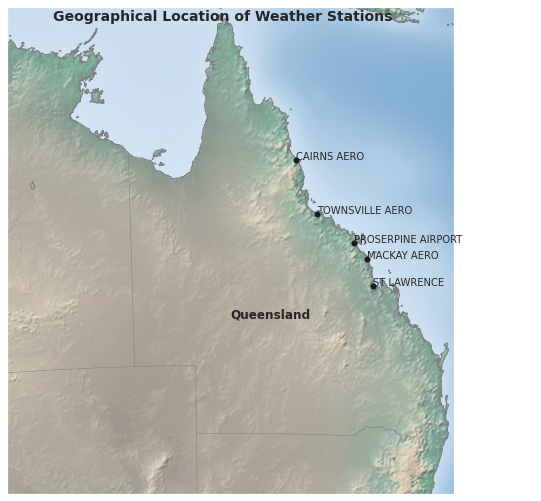

In [ ]:
# Plot location of weather station selected
fig = plt.figure(figsize=(8, 8))
m = Basemap(projection='lcc', resolution='h',
            width=2.2E6, height=2.4E6, 
            lat_0=-20.9176, lon_0=142.7028)
m.etopo(scale=0.5, alpha=0.5)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

df = data_weather_station[(data_weather_station['station_number'].isin(selected_weather_stations))]

x, y = m( 142.7028, -23.9176)
plt.text(x, y, 'Queensland', fontsize=12, fontweight='bold');

for index, row in df.iterrows():    
    # Map (long, lat) to (x, y) for plotting
    x, y = m(row['longitude'], row['latitude'])
    plt.plot(x, y, 'ok', markersize=5)
    plt.text(x, y, row['station_name'], fontsize=10);

plt.suptitle('Geographical Location of Weather Stations', fontsize=14, fontweight='bold')   
plt.subplots_adjust(top=1.0)
plt.show()

### Examine the number of site per weather station

<function matplotlib.pyplot.show>

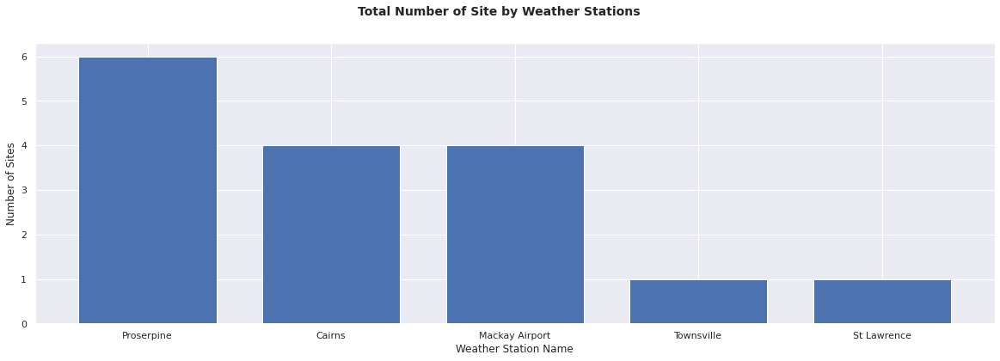

In [ ]:
d_total_site = data_solar_analytics_combine.groupby(["station_number"]).agg({"site_id": "nunique"})
d_total_site = d_total_site.sort_values('site_id', ascending=False)
d_total_site = d_total_site.reset_index()  
d_total_site = pd.merge(d_total_site, data_postcode_station,  how='left', left_on=['station_number'], right_on = ['station number'])

fig = plt.figure(figsize = (20,6))
ax = fig.add_subplot(1,1,1) 
ax.bar(d_total_site['station name'], d_total_site['site_id'], 0.75, zorder=3)
ax.set(xlabel = 'Weather Station Name', ylabel='Number of Sites')
ax.grid(axis='y', zorder=0)
plt.suptitle("Total Number of Site by Weather Stations",
                 fontsize=14, fontweight='bold')
#plt.xticks(rotation=60)
plt.show

### Distribution of Temperature and Relative Humidity

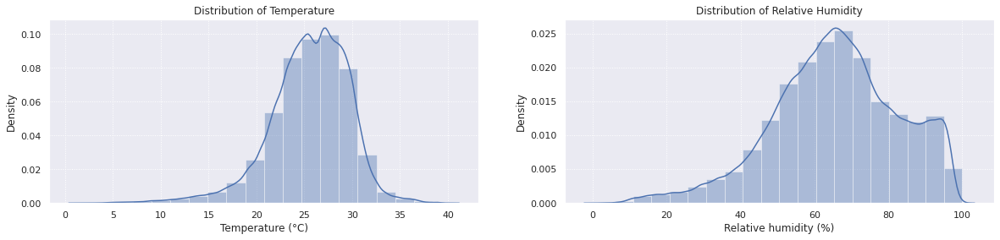

In [ ]:
fig = plt.figure(figsize=[20, 4])
ax = fig.add_subplot(1,2,1) 
sns.distplot(data_solar_analytics_combine['temperature'], bins=20, ax=ax)
ax.set(xlabel='Temperature (' + degree_sign + 'C)', ylabel='Density', title='Distribution of Temperature')
ax.grid(linestyle='dotted')

ax = fig.add_subplot(1,2,2) 
sns.distplot(data_solar_analytics_combine['relative_humidity'], bins=20, ax=ax)
ax.set(xlabel='Relative humidity (%)', ylabel='Density', title='Distribution of Relative Humidity')
ax.grid(linestyle='dotted')

plt.show()

### Distribution of temperature and relative humidity by months

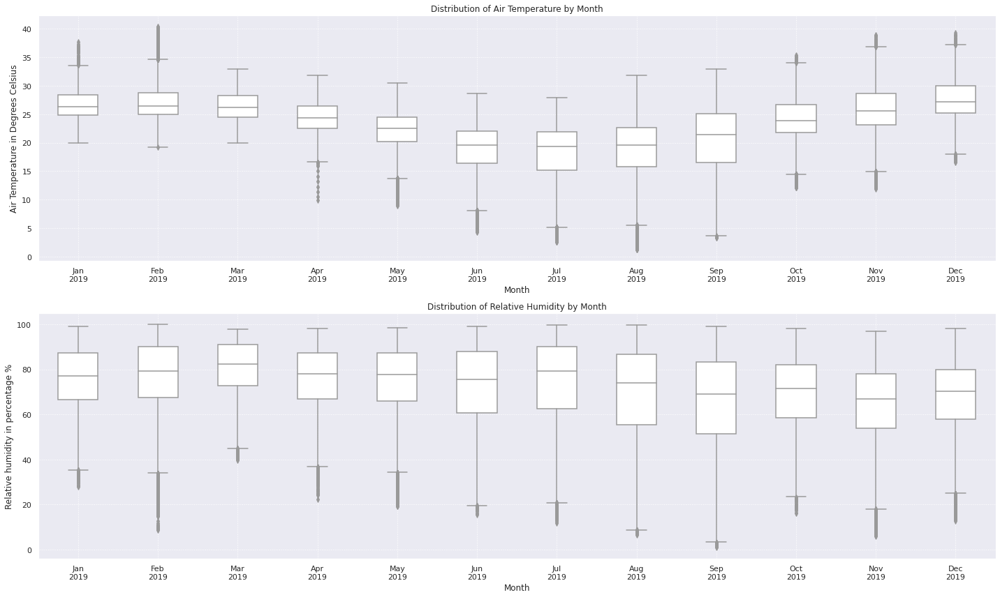

In [ ]:
x_month = pd.to_datetime(data_weather['timestamp']).dt.month

# Plot for distribution of temperature and relative humidity across the months
fig = plt.figure(figsize=[20, 12])
ax = fig.add_subplot(2,1,1) 
ax = sns.boxplot(x=x_month, y=data_weather['temperature'], data=data_weather, color='white', width=.5)
ax.set_xlabel('Month')
ax.set_ylabel('Air Temperature in Degrees Celsius')
ax.set_xticks(np.arange(0,12))
ax.set_xticklabels(month_label) 
ax.grid(linestyle='dotted')
ax.set_title('Distribution of Air Temperature by Month')

ax = fig.add_subplot(2,1,2) 
ax = sns.boxplot(x=x_month, y=data_weather['relative_humidity'], data=data_weather, color='white', width=.5)
ax.set_xlabel('Month')
ax.set_ylabel('Relative humidity in percentage %')
ax.set_xticks(np.arange(0,12))
ax.set_xticklabels(month_label) 
ax.grid(linestyle='dotted')
ax.set_title('Distribution of Relative Humidity by Month')

plt.tight_layout()

### Distribution of temperature and relative humidity by weather stations

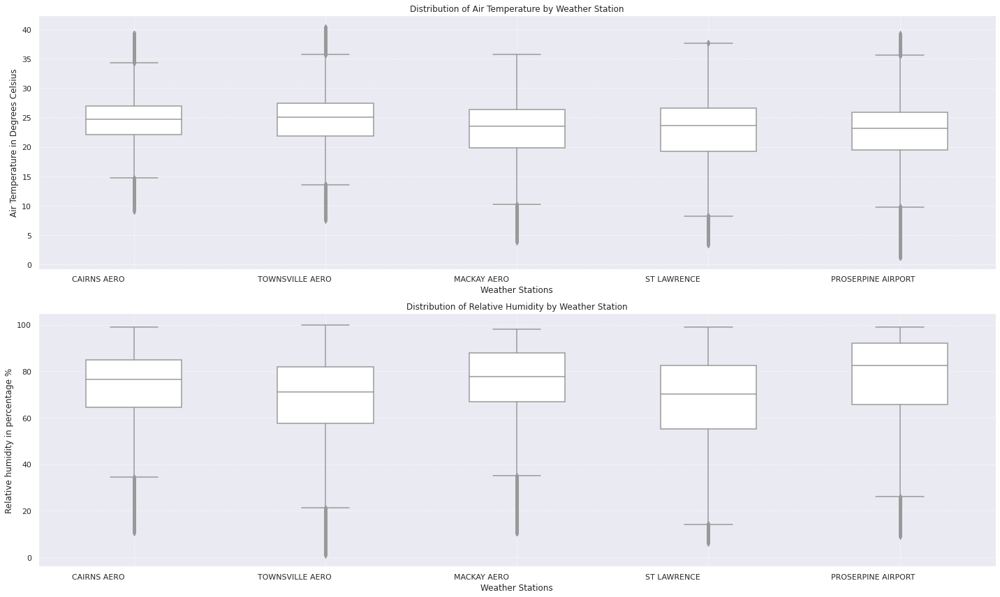

In [ ]:
x_weather_stations = data_weather_station.sort_values('station_number')['station_name']

# Plot for distribution of temperature and relative humidity across the months
fig = plt.figure(figsize=[20, 12])
ax = fig.add_subplot(2,1,1) 
ax = sns.boxplot(x=data_weather['station_number'], y=data_weather['temperature'], data=data_weather, color='white', width=.5)
ax.set_xlabel('Weather Stations')
ax.set_ylabel('Air Temperature in Degrees Celsius')
ax.set_xticklabels(x_weather_stations)
ax.grid(linestyle='dotted')
ax.set_title('Distribution of Air Temperature by Weather Station')

ax = fig.add_subplot(2,1,2) 
ax = sns.boxplot(x=data_weather['station_number'], y=data_weather['relative_humidity'], data=data_weather, color='white', width=.5)
ax.set_xlabel('Weather Stations')
ax.set_ylabel('Relative humidity in percentage %')
ax.set_xticklabels(x_weather_stations)
ax.grid(linestyle='dotted')
ax.set_title('Distribution of Relative Humidity by Weather Station')

plt.tight_layout()
plt.show()

### Maximum, Minimum and Average Temperature per weather station
With a new dataframe build, it is worth to explore further of the data from weather station perspective.


<function matplotlib.pyplot.show>

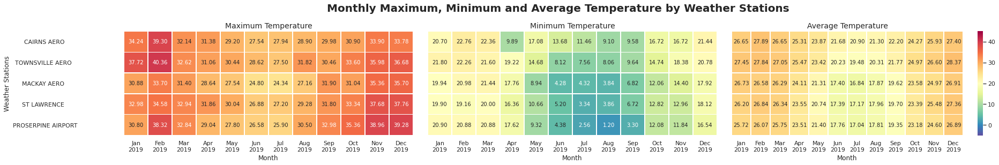

In [ ]:
# Dataframe for maximum temperature
d_temperature_max = data_weather.groupby(["station_number",pd.to_datetime(data_weather['timestamp']).dt.month]).agg(['max'])['temperature']
d_temperature_max = d_temperature_max.reset_index()
d_temperature_max.columns = ['station number','month','max temp']
d_temperature_max = d_temperature_max.pivot_table(index = ["station number"],columns = ["month"], values = "max temp", aggfunc=np.mean)

# Dataframe for minimum temperature
d_temperature_min = data_weather.groupby(["station_number",pd.to_datetime(data_weather['timestamp']).dt.month]).agg(['min'])['temperature']
d_temperature_min = d_temperature_min.reset_index()
d_temperature_min.columns = ['station number','month','min temp']
d_temperature_min = d_temperature_min.pivot_table(index = ["station number"],columns = ["month"], values = "min temp", aggfunc=np.mean)

# Dataframe for minimum temperature
d_temperature_mean = data_weather.groupby(["station_number",pd.to_datetime(data_weather['timestamp']).dt.month]).agg(['mean'])['temperature']
d_temperature_mean = d_temperature_mean.reset_index()
d_temperature_mean.columns = ['station number','month','mean temp']
d_temperature_mean = d_temperature_mean.pivot_table(index = ["station number"],columns = ["month"], values = "mean temp", aggfunc=np.mean)

# Plot Heatmap
fig = plt.figure(figsize = (30,4))
ax = fig.add_subplot(1,3,1) 
ax = sns.heatmap(d_temperature_max, annot=True, fmt=".2f", linewidths=.2, cmap="Spectral_r", vmin=-5, vmax=45, cbar=False)
plt.title("Maximum Temperature", fontsize=14)
ax.set_xlabel('Month', fontsize = 12)
ax.set_ylabel('Weather Stations', fontsize = 12)
ax.set_xticklabels(month_label)
ax.set_yticklabels(x_weather_stations, rotation=0)
ax.set_ylabel('Weather Stations', fontsize = 12)

ax = fig.add_subplot(1,3,2) 
ax = sns.heatmap(d_temperature_min, annot=True, fmt=".2f", linewidths=.2, cmap="Spectral_r", vmin=-5, vmax=45, cbar=False)
plt.title("Minimum Temperature", fontsize=14)
ax.set_xlabel('Month', fontsize = 12)
ax.yaxis.label.set_visible(False)
ax.set_yticks([])
ax.set_xticklabels(month_label)

ax = fig.add_subplot(1,3,3) 
ax = sns.heatmap(d_temperature_mean, annot=True, fmt=".2f", linewidths=.2, cmap="Spectral_r", vmin=-5, vmax=45)
plt.title("Average Temperature", fontsize=14)
ax.set_xlabel('Month', fontsize = 12)
ax.yaxis.label.set_visible(False)
ax.set_yticks([])
ax.set_xticklabels(month_label)

plt.suptitle("Monthly Maximum, Minimum and Average Temperature by Weather Stations", fontsize = 20, fontweight='bold')
plt.subplots_adjust(top=0.8, hspace=0.2, wspace=0.05)
plt.show

### Maximum, Minimum and Average Relative Humidity per weather station
With a new dataframe build, it is worth to explore relative humidity from weather station perspective.

<function matplotlib.pyplot.show>

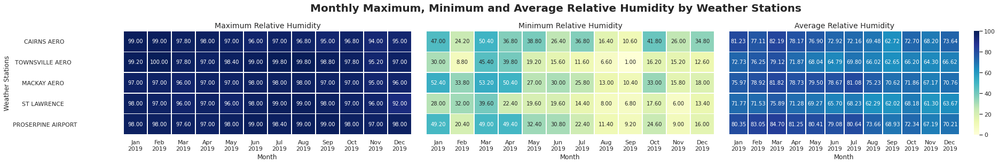

In [ ]:
# Dataframe for maximum temperature
d_humidity_max = data_weather.groupby(["station_number",pd.to_datetime(data_weather['timestamp']).dt.month]).agg(['max'])['relative_humidity']
d_humidity_max = d_humidity_max.reset_index()
d_humidity_max.columns = ['station number','month','max humidity']
d_humidity_max = d_humidity_max.pivot_table(index = ["station number"],columns = ["month"], values = "max humidity", aggfunc=np.mean)

# Dataframe for minimum temperature
d_humidity_min = data_weather.groupby(["station_number",pd.to_datetime(data_weather['timestamp']).dt.month]).agg(['min'])['relative_humidity']
d_humidity_min = d_humidity_min.reset_index()
d_humidity_min.columns = ['station number','month','min humidity']
d_humidity_min = d_humidity_min.pivot_table(index = ["station number"],columns = ["month"], values = "min humidity", aggfunc=np.mean)

# Dataframe for minimum temperature
d_humidity_mean = data_weather.groupby(["station_number",pd.to_datetime(data_weather['timestamp']).dt.month]).agg(['mean'])['relative_humidity']
d_humidity_mean = d_humidity_mean.reset_index()
d_humidity_mean.columns = ['station number','month','mean temp']
d_humidity_mean = d_humidity_mean.pivot_table(index = ["station number"],columns = ["month"], values = "mean temp", aggfunc=np.mean)

# Plot Heatmap
fig = plt.figure(figsize = (30,4))
ax = fig.add_subplot(1,3,1) 
ax = sns.heatmap(d_humidity_max, annot=True, fmt=".2f", linewidths=.2, cmap="YlGnBu", vmin=0, vmax=100, cbar=False)
plt.title("Maximum Relative Humidity", fontsize=14)
ax.set_xlabel('Month', fontsize = 12)
ax.set_ylabel('Weather Stations', fontsize = 12)
ax.set_xticklabels(month_label)
ax.set_yticklabels(x_weather_stations, rotation=0)

ax = fig.add_subplot(1,3,2) 
ax = sns.heatmap(d_humidity_min, annot=True, fmt=".2f", linewidths=.2, cmap="YlGnBu", vmin=0, vmax=100, cbar=False)
plt.title("Minimum Relative Humidity", fontsize=14)
ax.set_xlabel('Month', fontsize = 12)
ax.yaxis.label.set_visible(False)
ax.set_yticks([])
ax.set_ylabel('Weather Stations', fontsize = 12)
ax.set_xticklabels(month_label)

ax = fig.add_subplot(1,3,3) 
ax = sns.heatmap(d_humidity_mean, annot=True, fmt=".2f", linewidths=.2, cmap="YlGnBu", vmin=0, vmax=100)
plt.title("Average Relative Humidity", fontsize=14)
ax.set_xlabel('Month', fontsize = 12)
ax.yaxis.label.set_visible(False)
ax.set_yticks([])
ax.set_xticklabels(month_label)

plt.suptitle("Monthly Maximum, Minimum and Average Relative Humidity by Weather Stations", fontsize = 20, fontweight='bold')
plt.subplots_adjust(top=0.8, hspace=0.2, wspace=0.05)
plt.show

### Examine Temperature yearly trend across all weather stations

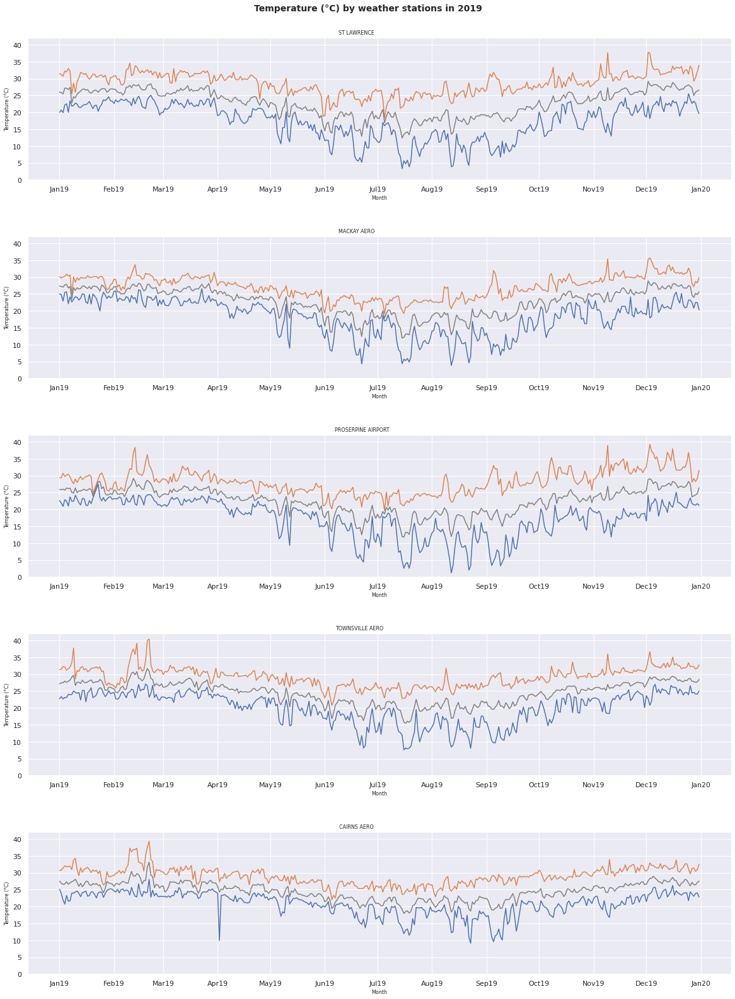

In [ ]:
df_max = data_weather.groupby(["station_number",pd.to_datetime(data_weather['timestamp']).dt.date]).agg(['max'])['temperature']
df_min = data_weather.groupby(["station_number",pd.to_datetime(data_weather['timestamp']).dt.date]).agg(['min'])['temperature']
df_mean = data_weather.groupby(["station_number",pd.to_datetime(data_weather['timestamp']).dt.date]).agg(['mean'])['temperature']

start_date = np.datetime64('2019-01-01')
end_date = np.datetime64('2019-12-31')
months = mdates.MonthLocator()  # every month
months_fmt = mdates.DateFormatter('%b%y')

fig = plt.figure(figsize=[20, 25])
i=1
for station_number in data_solar_irradiance['station_number'].unique():
    df_plot_max = df_max.query('station_number == ' + str(station_number))
    df_plot_max = df_plot_max.reset_index()
    df_plot_max = df_plot_max[(df_plot_max['timestamp']>= start_date) & (df_plot_max['timestamp']<= end_date)]
    df_plot_max = df_plot_max.set_index(['timestamp'])

    df_plot_min = df_min.query('station_number == ' + str(station_number))
    df_plot_min = df_plot_min.reset_index()
    df_plot_min = df_plot_min[(df_plot_min['timestamp']>=start_date) & (df_plot_min['timestamp']<=end_date)]
    df_plot_min = df_plot_min.set_index(['timestamp'])

    df_plot_mean = df_mean.query('station_number == ' + str(station_number))
    df_plot_mean = df_plot_mean.reset_index()
    df_plot_mean = df_plot_mean[(df_plot_mean['timestamp']>=start_date) & (df_plot_mean['timestamp']<=end_date)]
    df_plot_mean = df_plot_mean.set_index(['timestamp'])

    station_name = data_weather_station[(data_weather_station['station_number']==station_number)][['station_name']].iloc[0][0]

    ax = fig.add_subplot(5,1,i)         
    df_plot_min['min'].plot(ax=ax, label='min', grid=True)
    df_plot_max['max'].plot(ax=ax, label='max', grid=True)
    df_plot_mean['mean'].plot(ax=ax, label='mean', grid=True, color='grey')
    ax.set_title(station_name,fontsize=8)    
    ax.set_xlabel('Month',fontsize=8)    
    ax.set_ylim([0,42])
    #ax.xaxis.c(dates.MonthLocator(interval=1))
    #ax.set_xticklabels(labels=['J','F','M','A','M','J','J','A','S','O','N','D'], fontsize=8) 
    ax.set_ylabel('Temperature (' + degree_sign + 'C)', fontsize=8)
    ax.xaxis.set_major_locator(months)
    ax.xaxis.set_major_formatter(months_fmt)
    
    i=i+1

plt.suptitle('Temperature (' + degree_sign + 'C) by weather stations in 2019', fontsize=14, fontweight='bold')
plt.subplots_adjust(top=0.95, hspace=0.4, wspace=0.15)
plt.show()

### Examine Relative Humidity yearly trend across all weather stations

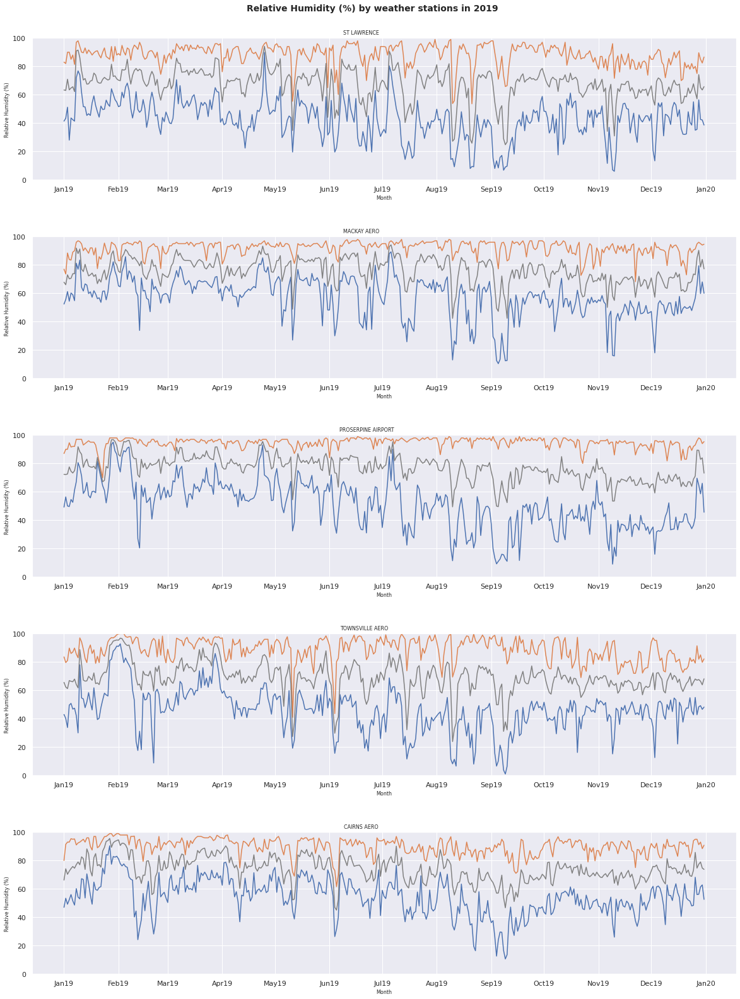

In [ ]:
df_max = data_weather.groupby(["station_number",pd.to_datetime(data_weather['timestamp']).dt.date]).agg(['max'])['relative_humidity']
df_min = data_weather.groupby(["station_number",pd.to_datetime(data_weather['timestamp']).dt.date]).agg(['min'])['relative_humidity']
df_mean = data_weather.groupby(["station_number",pd.to_datetime(data_weather['timestamp']).dt.date]).agg(['mean'])['relative_humidity']

start_date = np.datetime64('2019-01-01')
end_date = np.datetime64('2019-12-31')
months = mdates.MonthLocator()  # every month
months_fmt = mdates.DateFormatter('%b%y')

fig = plt.figure(figsize=[20, 25])
i=1
for station_number in data_solar_irradiance['station_number'].unique():
    df_plot_max = df_max.query('station_number == ' + str(station_number))
    df_plot_max = df_plot_max.reset_index()
    df_plot_max = df_plot_max[(df_plot_max['timestamp']>= start_date) & (df_plot_max['timestamp']<= end_date)]
    df_plot_max = df_plot_max.set_index(['timestamp'])

    df_plot_min = df_min.query('station_number == ' + str(station_number))
    df_plot_min = df_plot_min.reset_index()
    df_plot_min = df_plot_min[(df_plot_min['timestamp']>=start_date) & (df_plot_min['timestamp']<=end_date)]
    df_plot_min = df_plot_min.set_index(['timestamp'])

    df_plot_mean = df_mean.query('station_number == ' + str(station_number))
    df_plot_mean = df_plot_mean.reset_index()
    df_plot_mean = df_plot_mean[(df_plot_mean['timestamp']>=start_date) & (df_plot_mean['timestamp']<=end_date)]
    df_plot_mean = df_plot_mean.set_index(['timestamp'])

    station_name = data_weather_station[(data_weather_station['station_number']==station_number)][['station_name']].iloc[0][0]

    ax = fig.add_subplot(5,1,i)         
    df_plot_min['min'].plot(ax=ax, label='min', grid=True)
    df_plot_max['max'].plot(ax=ax, label='max', grid=True)
    df_plot_mean['mean'].plot(ax=ax, label='mean', grid=True, color='grey')
    ax.set_title(station_name,fontsize=8)    
    ax.set_xlabel('Month',fontsize=8)    
    ax.set_ylim([0,100])
    ax.set_ylabel('Relative Humidity (%)', fontsize=8)
    ax.xaxis.set_major_locator(months)
    ax.xaxis.set_major_formatter(months_fmt)
    
    i=i+1

plt.suptitle('Relative Humidity (%) by weather stations in 2019', fontsize=14, fontweight='bold')
plt.subplots_adjust(top=0.95, hspace=0.4, wspace=0.15)
plt.show()

### Examine Global Horizontal Irradiance (GHI) irradiance yearly trend across all weather stations

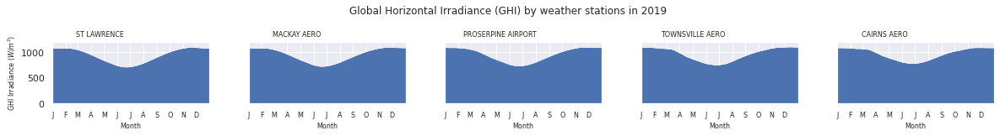

In [ ]:
fig = plt.figure(figsize=[20, 10])
i=1
for station_number in data_solar_irradiance['station_number'].unique():
    df_plot = data_solar_irradiance[(data_solar_irradiance['station_number']==station_number)]
    df_plot = df_plot.set_index(['timestamp'])
    station_name = data_weather_station[(data_weather_station['station_number']==station_number)][['station_name']].iloc[0][0]

    ax = fig.add_subplot(5,5,i)         
    df_plot['ghi'].plot(ax=ax, label='ghi', grid=True)
    ax.set_title(station_name,fontsize=8)    
    ax.set_xlabel('Month',fontsize=8)    
    ax.set_ylim([0,1200])
    ax.set_xticklabels(labels=['J','F','M','A','M','J','J','A','S','O','N','D'], fontsize=8) 

    if (i%8==1):
        ax.set_ylabel('GHI Irradiance ($W/m^2$)', fontsize=8)
    else:
        ax.set_ylabel('')
        ax.set_yticklabels([])                
    i=i+1

plt.suptitle('Global Horizontal Irradiance (GHI) by weather stations in 2019')
plt.subplots_adjust(top=0.92, hspace=0.7, wspace=0.25)
plt.show()

### Examine Direct Normal Irradiance (DNI) irradiance yearly trend across all weather stations

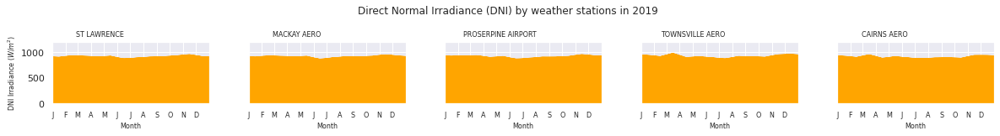

In [ ]:
fig = plt.figure(figsize=[20, 10])
i=1
for station_number in data_solar_irradiance['station_number'].unique():
    df_plot = data_solar_irradiance[(data_solar_irradiance['station_number']==station_number)]
    df_plot = df_plot.set_index(['timestamp'])
    station_name = data_weather_station[(data_weather_station['station_number']==station_number)][['station_name']].iloc[0][0]

    ax = fig.add_subplot(5,5,i)         
    df_plot['dni'].plot(ax=ax, label='dni', grid=True, color='orange')
    ax.set_title(station_name,fontsize=8)    
    ax.set_xlabel('Month',fontsize=8)    
    ax.set_ylim([0,1200])
    ax.set_xticklabels(labels=['J','F','M','A','M','J','J','A','S','O','N','D'], fontsize=8) 

    if (i%8==1):
        ax.set_ylabel('DNI Irradiance ($W/m^2$)', fontsize=8)
    else:
        ax.set_ylabel('')
        ax.set_yticklabels([])                
    i=i+1

plt.suptitle('Direct Normal Irradiance (DNI) by weather stations in 2019')
plt.subplots_adjust(top=0.92, hspace=0.7, wspace=0.25)
plt.show()

### Examine Diffuse Horizontal Irradiance (DHI) irradiance yearly trend across all weather stations

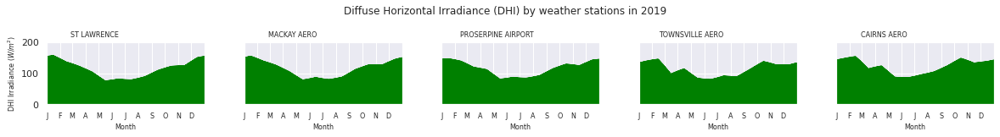

In [ ]:
fig = plt.figure(figsize=[20, 10])
i=1
for station_number in data_solar_irradiance['station_number'].unique():
    df_plot = data_solar_irradiance[(data_solar_irradiance['station_number']==station_number)]
    df_plot = df_plot.set_index(['timestamp'])
    station_name = data_weather_station[(data_weather_station['station_number']==station_number)][['station_name']].iloc[0][0]

    ax = fig.add_subplot(5,5,i)         
    df_plot['dhi'].plot(ax=ax, label='dhi', grid=True, color='green')
    ax.set_title(station_name,fontsize=8)    
    ax.set_xlabel('Month',fontsize=8)    
    ax.set_ylim([0,200])
    ax.set_xticklabels(labels=['J','F','M','A','M','J','J','A','S','O','N','D'], fontsize=8) 

    if (i%8==1):
        ax.set_ylabel('DHI Irradiance ($W/m^2$)', fontsize=8)
    else:
        ax.set_ylabel('')
        ax.set_yticklabels([])                
    i=i+1

plt.suptitle('Diffuse Horizontal Irradiance (DHI) by weather stations in 2019')
plt.subplots_adjust(top=0.92, hspace=0.7, wspace=0.25)
plt.show()

### Average Daily Energy output per Site
There is a notable difference between site in term of average daily energy output. This might be due to different in Solar PV system capacity. This needs to be observed when fitting a model.

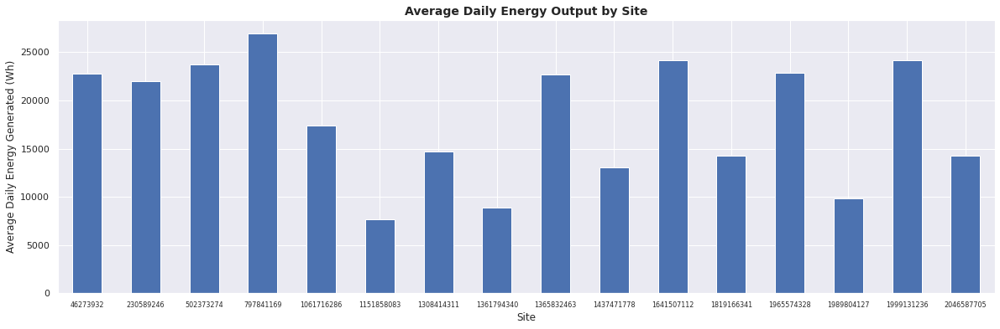

In [ ]:
# Dataframe for average energy per site
d_total_daily_energy_site = data_solar_analytics_combine[((data_solar_analytics_combine['timestamp'])>='2019-01-02')].groupby(["site_id", pd.to_datetime(data_solar_analytics_combine['timestamp']).dt.month, pd.to_datetime(data_solar_analytics_combine['timestamp']).dt.day]).agg(['sum'])['energy_generated']
d_total_daily_energy_site.index.names = ['site_id','month','day']
d_total_daily_energy_site = d_total_daily_energy_site.reset_index()
d_total_daily_energy_site.columns = ['site','month','day','daily energy']
d_avg_energy_site = d_total_daily_energy_site.groupby(["site"]).agg(['mean'])['daily energy']
d_avg_energy_site = d_avg_energy_site.reset_index()
d_avg_energy_site['site'] = d_avg_energy_site['site'].astype('category')

fig = plt.figure(figsize=[20, 6])
ax = fig.add_subplot(1,1,1) 
d_avg_energy_site.plot(x='site', y='mean', kind='bar', ax=ax)
ax.set_xticklabels(d_avg_energy_site['site'], rotation=0, fontsize=8)
ax.set_xlabel('Site', fontsize = 12)
ax.set_ylabel('Average Daily Energy Generated (Wh)', fontsize = 12)
ax.get_legend().remove()
#ax.grid(axis='y', zorder=0)
ax.set_title("Average Daily Energy Output by Site", fontsize=14, fontweight='bold')
plt.show()

### Distribution of Daily Energy output per Site


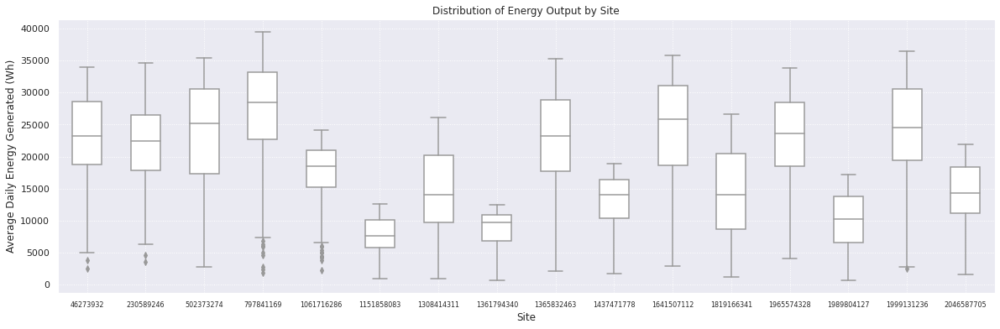

In [ ]:
fig = plt.figure(figsize=[20, 6])
ax = fig.add_subplot(1,1,1) 
ax = sns.boxplot(x=d_total_daily_energy_site['site'], y=d_total_daily_energy_site['daily energy'], data=d_total_daily_energy_site, color='white', width=.5)
ax.set_xlabel('Site')
ax.set_ylabel('Energy (Wh)')
ax.grid(linestyle='dotted')
ax.set_xticklabels(d_avg_energy_site['site'], rotation=0, fontsize=8)
ax.set_ylabel('Average Daily Energy Generated (Wh)', fontsize = 12)

ax.set_title('Distribution of Energy Output by Site')
plt.show()

From the following plots, there seems to be positive skewed distribution in energy generated. This will need to be addressed when fitting a linear model.
https://www.sciencedirect.com/topics/mathematics/skewed-distribution

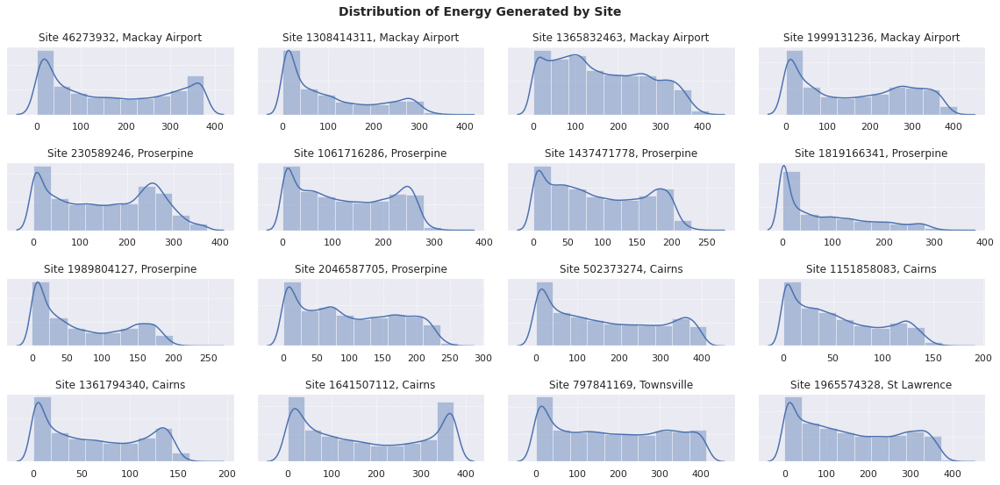

In [ ]:
fig = plt.figure(figsize=[20, 32])
i=1
for site_id in data_solar_analytics_combine['site_id'].unique():
    df_plot = data_solar_analytics_combine[(data_solar_analytics_combine['site_id']==site_id)]
    ax = fig.add_subplot(15,4,i) 
    sns.distplot(df_plot['energy_generated'], bins=10, ax=ax)
    station_name = data_postcode_station[(data_postcode_station['station number']==df_plot['station_number'].iloc[0])]['station name'].iloc[0]
    ax.set(xlabel='', ylabel='', title="Site " + str(site_id) + ", " + str(station_name))
    ax.grid(linestyle='dotted')
    ax.set_ylabel('')
    ax.set_yticklabels([])            
    i=i+1

plt.suptitle("Distribution of Energy Generated by Site", fontsize=14, fontweight='bold')
plt.subplots_adjust(top=0.96, hspace=0.7, wspace=0.1)
#plt.tight_layout()
plt.show()

### Temperature, Relative Humidity and GHI by Season

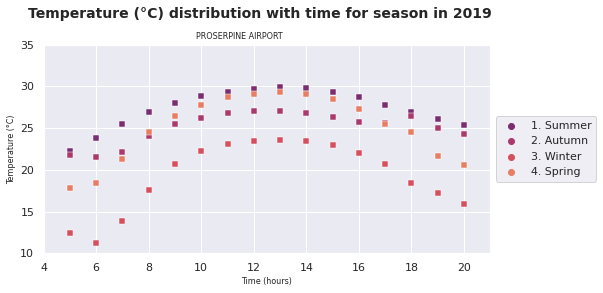

In [ ]:
df = data_solar_analytics_combine
df['season'] = ''
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([12,1,2])), ['season']] = "1. Summer"
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([3,4,5])), ['season']] = "2. Autumn"
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([6,7,8])), ['season']] = "3. Winter"
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([9,10,11])), ['season']] = "4. Spring"

df_mean_temp = df.groupby(["station_number","season",pd.to_datetime(df['timestamp']).dt.hour]).agg(['mean'])['temperature']
df_mean_temp = df_mean_temp.reset_index()
df_mean_temp.columns = ['station_number','season','hour','temperature']

station_number = 33247

fig = plt.figure(figsize=[8, 4])

df_plot_mean = df_mean_temp.query('station_number == ' + str(station_number))
df_plot_mean = df_plot_mean.reset_index()
df_plot_mean = df_plot_mean[(df_plot_mean['hour']>=5) & (df_plot_mean['hour']<=20)]

station_name = data_weather_station[(data_weather_station['station_number']==station_number)][['station_name']].iloc[0][0]

ax = fig.add_subplot(1,1,1)         
ax = sns.scatterplot(data=df_plot_mean, y="temperature", x="hour", hue="season", sizes=0.5, marker="s", palette='flare_r')

ax.set_title(station_name,fontsize=8)    
ax.set_xlabel('Time (hours)',fontsize=8)    
ax.set_ylabel('Temperature (' + degree_sign + 'C)', fontsize=8)
ax.set_xlim([4,21])
ax.set_ylim([10,35])

# Put a legend below current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.suptitle('Temperature (' + degree_sign + 'C) distribution with time for season in 2019', fontsize=14, fontweight='bold')
plt.subplots_adjust(top=0.85, hspace=0.4, wspace=0.15)
plt.show()

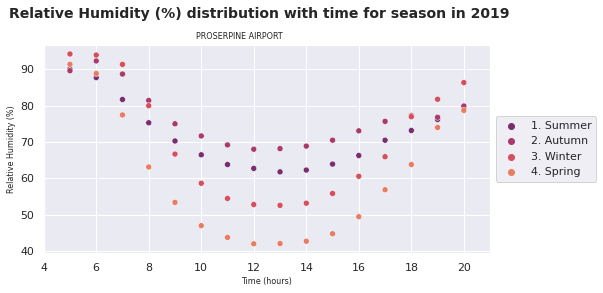

In [ ]:
df = data_solar_analytics_combine
df['season'] = ''
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([12,1,2])), ['season']] = "1. Summer"
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([3,4,5])), ['season']] = "2. Autumn"
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([6,7,8])), ['season']] = "3. Winter"
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([9,10,11])), ['season']] = "4. Spring"

df_mean_rh = df.groupby(["station_number","season",pd.to_datetime(df['timestamp']).dt.hour]).agg(['mean'])['relative_humidity']
df_mean_rh = df_mean_rh.reset_index()
df_mean_rh.columns = ['station_number','season','hour','relative_humidity']

station_number = 33247

fig = plt.figure(figsize=[8, 4])

df_plot_mean = df_mean_rh.query('station_number == ' + str(station_number))
df_plot_mean = df_plot_mean.reset_index()
df_plot_mean = df_plot_mean[(df_plot_mean['hour']>=5) & (df_plot_mean['hour']<=20)]

station_name = data_weather_station[(data_weather_station['station_number']==station_number)][['station_name']].iloc[0][0]

ax = fig.add_subplot(1,1,1)         
ax = sns.scatterplot(data=df_plot_mean, y="relative_humidity", x="hour", hue="season", sizes=0.5, palette='flare_r')

ax.set_title(station_name,fontsize=8)    
ax.set_xlabel('Time (hours)',fontsize=8)    
ax.set_ylabel('Relative Humidity (%)', fontsize=8)
ax.set_xlim([4,21])
#ax.set_ylim([10,35])

# Put a legend below current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.suptitle('Relative Humidity (%) distribution with time for season in 2019', fontsize=14, fontweight='bold')
plt.subplots_adjust(top=0.85, hspace=0.4, wspace=0.15)
plt.show()

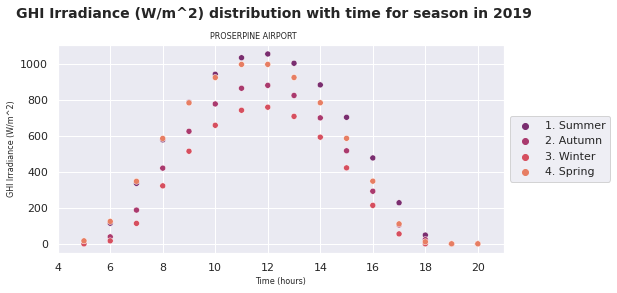

In [ ]:
df = data_solar_analytics_combine
df['season'] = ''
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([12,1,2])), ['season']] = "1. Summer"
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([3,4,5])), ['season']] = "2. Autumn"
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([6,7,8])), ['season']] = "3. Winter"
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([9,10,11])), ['season']] = "4. Spring"

df_mean_ghi = df.groupby(["station_number","season",pd.to_datetime(df['timestamp']).dt.hour]).agg(['mean'])['ghi']
df_mean_ghi = df_mean_ghi.reset_index()
df_mean_ghi.columns = ['station_number','season','hour','ghi']

station_number = 33247
seasons = ['winter','autumn','spring','summer']

fig = plt.figure(figsize=[8, 4])

df_plot_mean = df_mean_ghi.query('station_number == ' + str(station_number))
df_plot_mean = df_plot_mean.reset_index()
df_plot_mean = df_plot_mean[(df_plot_mean['hour']>=5) & (df_plot_mean['hour']<=20)]

station_name = data_weather_station[(data_weather_station['station_number']==station_number)][['station_name']].iloc[0][0]

ax = fig.add_subplot(1,1,1)         
ax = sns.scatterplot(data=df_plot_mean, y="ghi", x="hour", hue="season", sizes=0.5, palette='flare_r')

ax.set_title(station_name,fontsize=8)    
ax.set_xlabel('Time (hours)',fontsize=8)    
ax.set_ylabel('GHI Irradiance (W/m^2)', fontsize=8)
ax.set_xlim([4,21])
#ax.set_ylim([10,35])

# Put a legend below current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.suptitle('GHI Irradiance (W/m^2) distribution with time for season in 2019', fontsize=14, fontweight='bold')
plt.subplots_adjust(top=0.85, hspace=0.4, wspace=0.15)
plt.show()

### Examine relationships between Temperature, Relative Humidity, GHI and Energy Generated by Season

In [ ]:
# Energy Generated
df = data_solar_analytics_combine
df['season'] = ''
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([12,1,2])), ['season']] = "1. Summer"
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([3,4,5])), ['season']] = "2. Autumn"
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([6,7,8])), ['season']] = "3. Winter"
df.loc[(pd.to_datetime(df['timestamp']).dt.month.isin([9,10,11])), ['season']] = "4. Spring"

df_mean_energy = df.groupby(["station_number","site_id","season",pd.to_datetime(df['timestamp']).dt.hour]).agg(['mean'])['energy_generated']
df_mean_energy = df_mean_energy.reset_index()
df_mean_energy.columns = ['station_number','site_id','season','hour','energy_generated']

# Preparing the dataframes
df_plot_mean_temp = df_mean_temp.query('station_number == ' + str(station_number))
df_plot_mean_temp = df_plot_mean_temp.reset_index()
df_plot_mean_temp = df_plot_mean_temp[(df_plot_mean_temp['hour']>=5) & (df_plot_mean_temp['hour']<=20)]

df_plot_mean_rh = df_mean_rh.query('station_number == ' + str(station_number))
df_plot_mean_rh = df_plot_mean_rh.reset_index()
df_plot_mean_rh = df_plot_mean_rh[(df_plot_mean_rh['hour']>=5) & (df_plot_mean_rh['hour']<=20)]

df_plot_mean_ghi = df_mean_ghi.query('station_number == ' + str(station_number))
df_plot_mean_ghi = df_plot_mean_ghi.reset_index()
df_plot_mean_ghi = df_plot_mean_ghi[(df_plot_mean_ghi['hour']>=5) & (df_plot_mean_ghi['hour']<=20)]

df_plot_mean_energy = df_mean_energy.query('station_number == ' + str(station_number))
df_plot_mean_energy = df_plot_mean_energy.reset_index()
df_plot_mean_energy = df_plot_mean_energy[(df_plot_mean_energy['hour']>=5) & (df_plot_mean_energy['hour']<=20)]


In [ ]:
def plot_seasonal(season):
    # EDA: Energy Generated vs Temperature, Humidity and GHI over time (hours) 
    fig = plt.figure(figsize = (16,4))

    df_plot_mean_x1 = df_plot_mean_temp[(df_plot_mean_temp['season']==season)]
    df_plot_mean_x2 = df_plot_mean_rh[(df_plot_mean_rh['season']==season)]
    df_plot_mean_x3 = df_plot_mean_ghi[(df_plot_mean_ghi['season']==season)]
    df_plot_mean_y = df_plot_mean_energy[(df_plot_mean_energy['season']==season)]

    ax = fig.add_subplot(1,3,1) 
    ax2 = ax.twinx()
    ax.plot(df_plot_mean_y.hour,df_plot_mean_y["energy_generated"],color="orange")
    ax2.plot(df_plot_mean_x1.hour,df_plot_mean_x1["temperature"], color='blue')
    ax.set_xlabel('Time (hours)', fontsize = 12)
    ax2.set_ylim([10,35])

    ax.set_ylim([0,280])
    ax2.set_ylabel('Temperature ('+degree_sign+')', color='blue')
    ax.grid(linestyle='dotted')
    ax.set_ylabel('Energy Generated', color='orange')

    ax = fig.add_subplot(1,3,2) 
    ax2 = ax.twinx()
    ax.plot(df_plot_mean_y.hour,df_plot_mean_y["energy_generated"], color="orange")
    ax2.plot(df_plot_mean_x2.hour,df_plot_mean_x2["relative_humidity"], color="green")
    ax.set_xlabel('Time (hours)', fontsize = 12)
    ax2.set_ylim([40,95])

    ax.set_ylim([0,280])
    ax2.set_ylabel('Humidity (%)', color='green')
    ax.grid(linestyle='dotted')
    ax.set_ylabel('Energy Generated', color='orange')

    ax = fig.add_subplot(1,3,3) 
    ax2 = ax.twinx()
    ax.plot(df_plot_mean_y.hour,df_plot_mean_y["energy_generated"], color="orange")
    ax2.plot(df_plot_mean_x3.hour,df_plot_mean_x3["ghi"], color="red")
    ax.set_xlabel('Time (hours)', fontsize = 12)
    ax2.set_ylim([0,1100])

    ax.set_ylim([0,280])
    ax2.set_ylabel('GHI (W/m^2)', color='red')
    ax.grid(linestyle='dotted')
    ax.set_ylabel('Energy Generated (Wh)', color='orange')

    plt.suptitle("Energy Generated vs Temperature, Humidity and GHI ("+season+")", fontweight='bold')
    plt.subplots_adjust(top=0.85, hspace=0.4, wspace=0.75)

    fig.show()

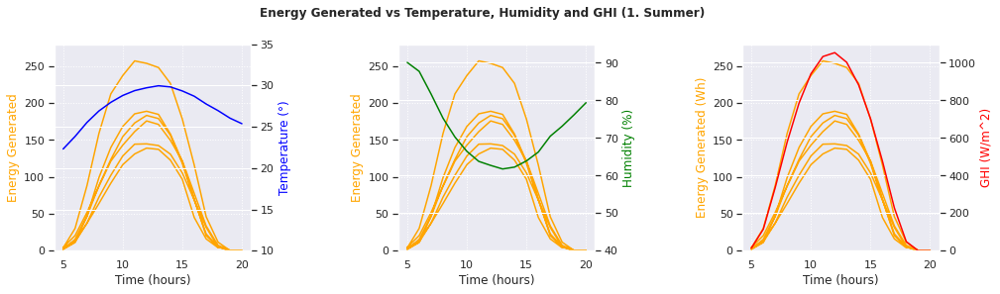

In [ ]:
plot_seasonal("1. Summer")

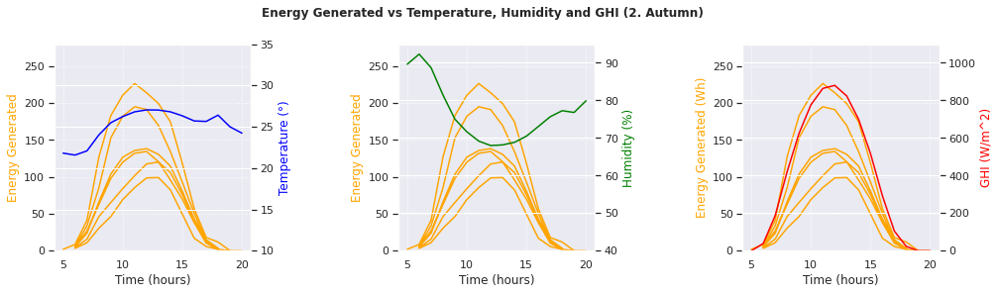

In [ ]:
plot_seasonal("2. Autumn")

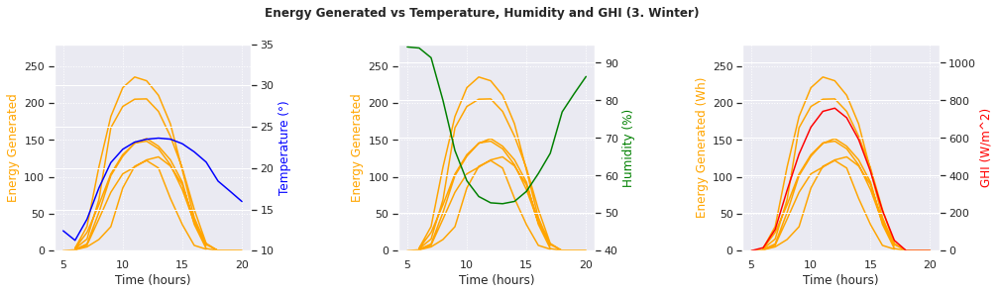

In [ ]:
plot_seasonal("3. Winter")

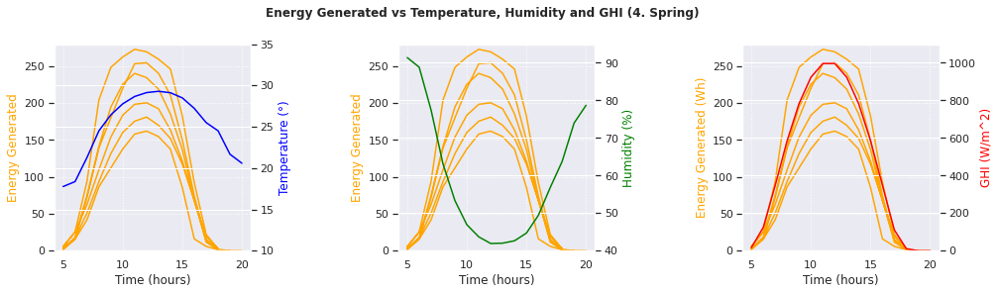

In [ ]:
plot_seasonal("4. Spring")

### Examine the distribution of all variables to be used in the model

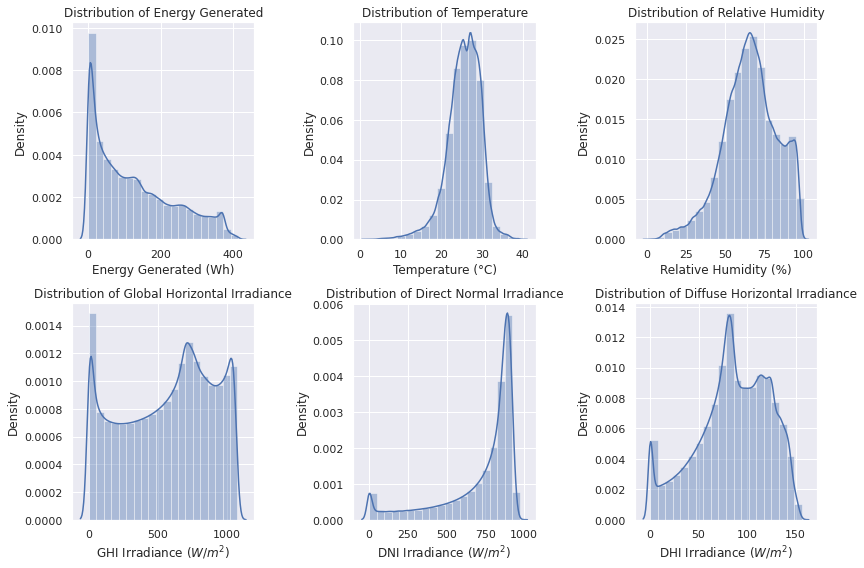

In [ ]:
fig = plt.figure(figsize=[12, 8])

ax = fig.add_subplot(2,3,1) 
sns.distplot(data_solar_analytics_combine['energy_generated'], bins=20, ax=ax)
ax.set(xlabel='Energy Generated (Wh)', ylabel='Density', title='Distribution of Energy Generated')

ax = fig.add_subplot(2,3,2) 
sns.distplot(data_solar_analytics_combine['temperature'], bins=20, ax=ax)
ax.set(xlabel='Temperature (' + degree_sign + 'C)', ylabel='Density', title='Distribution of Temperature')

ax = fig.add_subplot(2,3,3) 
sns.distplot(data_solar_analytics_combine['relative_humidity'], bins=20, ax=ax)
ax.set(xlabel='Relative Humidity (%)', ylabel='Density', title='Distribution of Relative Humidity')

ax = fig.add_subplot(2,3,4) 
sns.distplot(data_solar_analytics_combine['ghi'], bins=20, ax=ax)
ax.set(xlabel='GHI Irradiance ($W/m^2$)', ylabel='Density', title='Distribution of Global Horizontal Irradiance')

ax = fig.add_subplot(2,3,5) 
sns.distplot(data_solar_analytics_combine['dni'], bins=20, ax=ax)
ax.set(xlabel='DNI Irradiance ($W/m^2$)', ylabel='Density', title='Distribution of Direct Normal Irradiance')

ax = fig.add_subplot(2,3,6) 
sns.distplot(data_solar_analytics_combine['dhi'], bins=20, ax=ax)
ax.set(xlabel='DHI Irradiance ($W/m^2$)', ylabel='Density', title='Distribution of Diffuse Horizontal Irradiance')

#plt.subplots_adjust(top=0.95, hspace=0.6, wspace=0.3)
plt.tight_layout()
plt.show()

In [ ]:
####################################################################################
# Run the following section to save/load results due to computational constraints.
####################################################################################
# Save the result for future use
# data_solar_analytics_combine.to_csv(path + '/data_solar_analytics_combine.csv', index=False)  

# Load the result 
data_solar_analytics_combine = pd.read_csv(path + '/data_solar_analytics_combine.csv')
data_solar_analytics_combine['site_id'] = data_solar_analytics_combine['site_id'].astype('category')
data_solar_analytics_combine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 831369 entries, 0 to 831368
Data columns (total 9 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   site_id            831369 non-null  category
 1   energy_generated   831369 non-null  float64 
 2   timestamp          831369 non-null  object  
 3   station_number     831369 non-null  int64   
 4   temperature        831369 non-null  float64 
 5   relative_humidity  831369 non-null  float64 
 6   ghi                831369 non-null  float64 
 7   dni                831369 non-null  float64 
 8   dhi                831369 non-null  float64 
dtypes: category(1), float64(6), int64(1), object(1)
memory usage: 51.5+ MB


## ANALYSIS

### Checking Variables Correlations
Checking whether there are any correlations between the variables
GHI, DNI and DHI are closely correlated to each other. GHI is selected as it has a higher correlation to Energy Generated.

In [ ]:
# Drop column: station number
data_solar_analytics_combine = data_solar_analytics_combine.drop(columns=['station_number'])

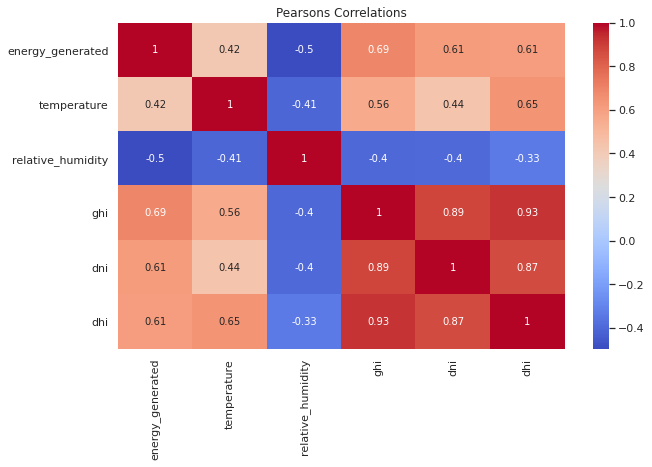

In [ ]:
# Correlations Heatmap
plt.figure(figsize = (10, 6))
sns.heatmap(data_solar_analytics_combine.corr(), cmap='coolwarm', annot=True)
plt.title('Pearson''s Correlations');

### Linear Relationship between Temperature, Humidity and GHI and Energy Generated
Estimating different intercepts, one for each site. 

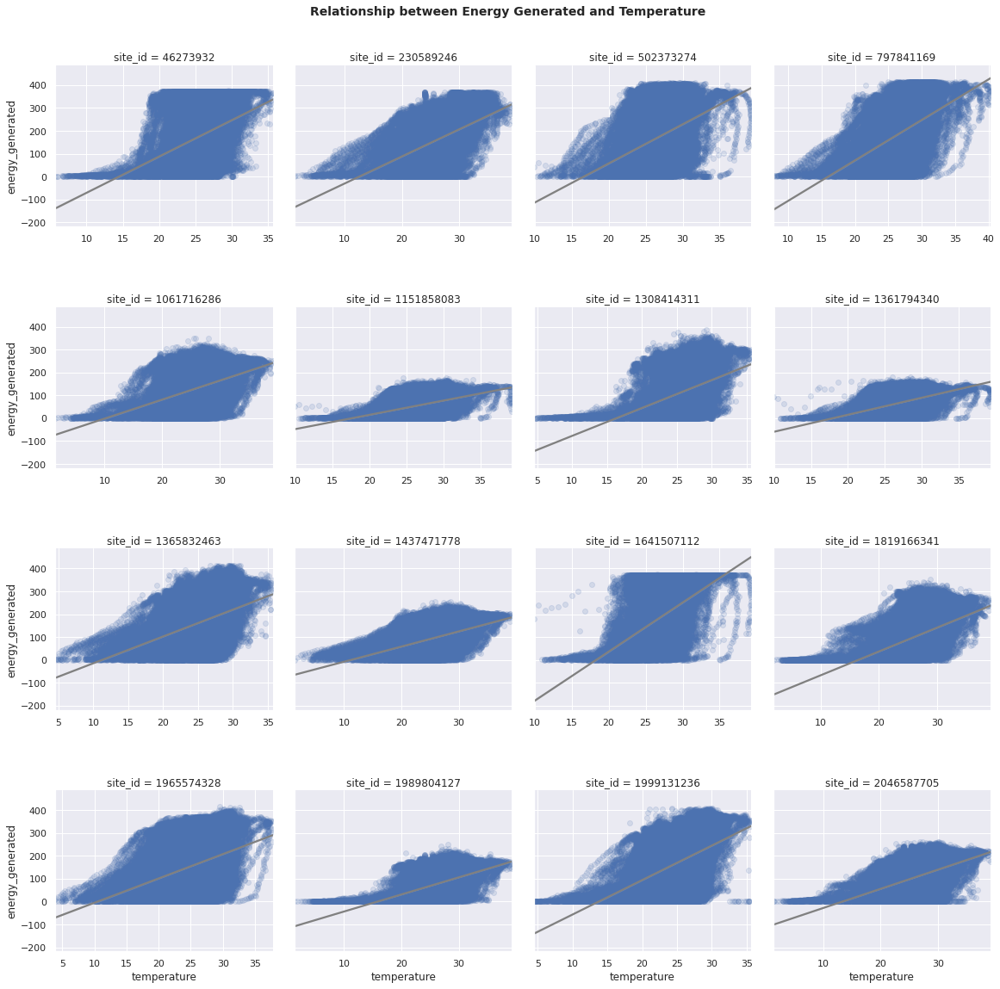

In [ ]:
grid = sns.lmplot(x = "temperature", y = "energy_generated", col = "site_id", sharex=False, col_wrap = 4, data = data_solar_analytics_combine, height=4, scatter_kws={'alpha':0.15}, line_kws={'color': 'grey'})
plt.suptitle("Relationship between Energy Generated and Temperature", fontsize=14, fontweight='bold')
plt.subplots_adjust(top=0.92, hspace=0.5, wspace=0.1)
plt.show()

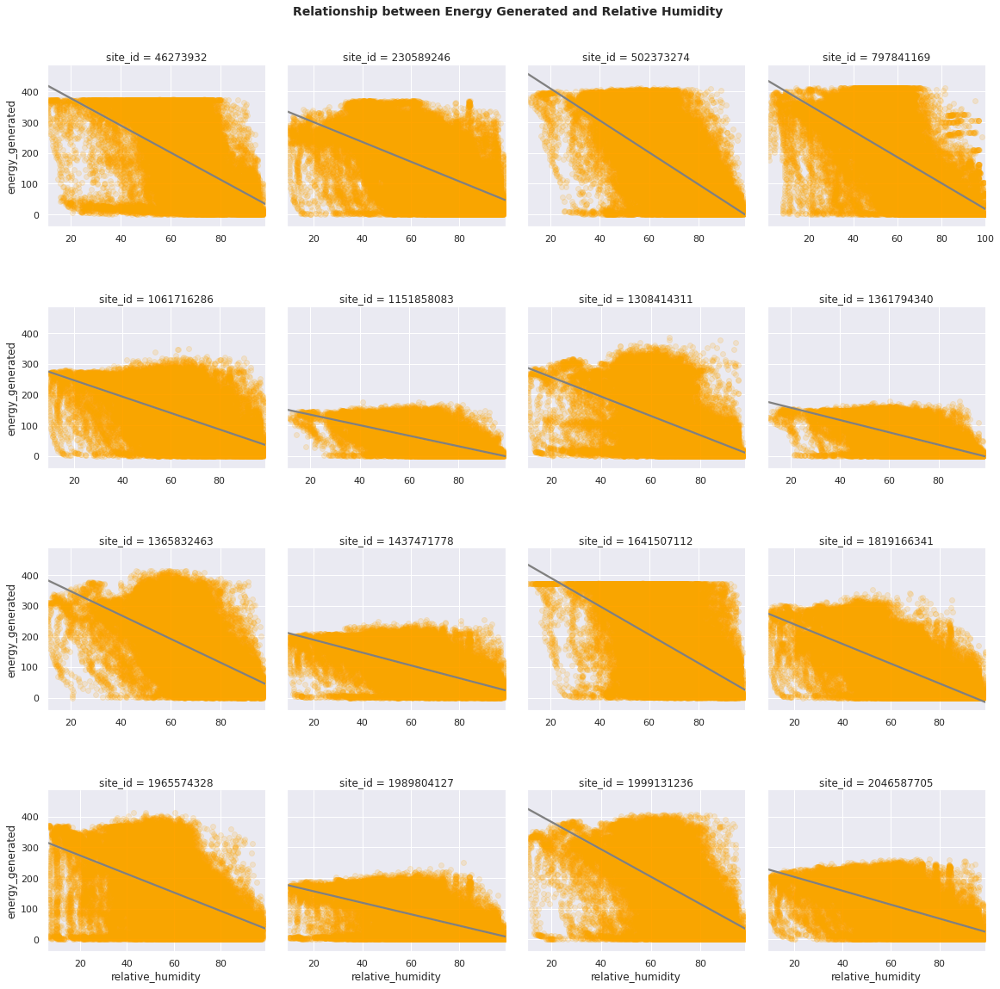

In [ ]:
grid = sns.lmplot(x = "relative_humidity", y = "energy_generated", col = "site_id", sharex=False, col_wrap = 4, data = data_solar_analytics_combine, height=4, scatter_kws={'alpha':0.15, 'color':'orange'}, line_kws={'color': 'grey'})
plt.suptitle("Relationship between Energy Generated and Relative Humidity", fontsize=14, fontweight='bold')
plt.subplots_adjust(top=0.92, hspace=0.5, wspace=0.1)
plt.show()

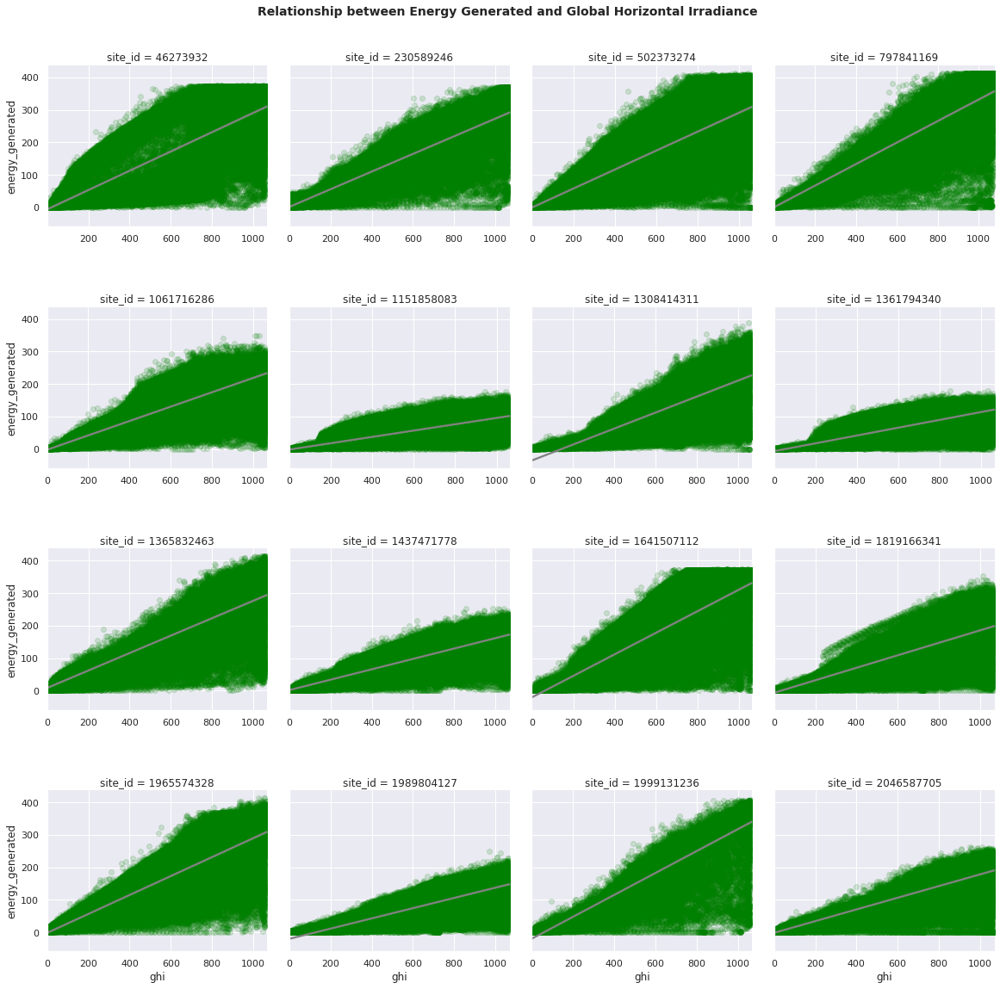

In [ ]:
grid = sns.lmplot(x = "ghi", y = "energy_generated", col = "site_id", sharex=False, col_wrap = 4, data = data_solar_analytics_combine, height=4, scatter_kws={'alpha':0.15, 'color':'green'}, line_kws={'color': 'grey'})
plt.suptitle("Relationship between Energy Generated and Global Horizontal Irradiance", fontsize=14, fontweight='bold')
plt.subplots_adjust(top=0.92, hspace=0.5, wspace=0.1)
plt.show()

### Linear Regression Model


#### Defining Model Evaluation

Using the linear model of one site, 4 plots are use to examine the different assumptions about linear model.

1.   Residuals vs Fitted
2.   Normal Q-Q Plot
3.   Scale-Location
4.   Residuals vs Levarage



In [ ]:
def plot_diagnosis(mod):
    list_of_tuples = list(zip(mod.resid, mod.fittedvalues, mod.resid_pearson, mod.get_influence().hat_matrix_diag))      
    
    df = pd.DataFrame(list_of_tuples, columns = ['resid', 'fittedvalues', 'resid_std', 'leverage'])  

    fig, axes = plt.subplots(nrows=2, ncols=2)
    plt.style.use('seaborn')

    # Residual against fitted values.
    df.plot.scatter(
        x='fittedvalues', y='resid', alpha=0.5, ax=axes[0, 0]
    )
    axes[0, 0].axhline(y=0, color='grey', linestyle='dashed')
    axes[0, 0].set_xlabel('Fitted Values')
    axes[0, 0].set_ylabel('Residuals')
    axes[0, 0].set_title('Residuals vs Fitted')

    # qqplot
    sm.qqplot(
        df['resid'], dist=stats.t, fit=True, line='45',
        ax=axes[0, 1], c='#4C72B0'
    )
    axes[0, 1].set_title('Normal Q-Q')

    # The scale-location plot.
    df.plot.scatter(
        x='fittedvalues', y='resid_std', alpha=0.5, ax=axes[1, 0]
    )
    axes[1, 0].axhline(y=0, color='grey', linestyle='dashed')
    axes[1, 0].set_xlabel('Fitted values')
    axes[1, 0].set_ylabel('Sqrt(|standardized residuals|)')
    axes[1, 0].set_title('Scale-Location')

    # Standardized residuals vs. leverage
    df.plot.scatter(
        x='leverage', y='resid_std', alpha=0.5, ax=axes[1, 1]
    )
    axes[1, 1].axhline(y=0, color='grey', linestyle='dashed')
    axes[1, 1].set_xlabel('Leverage')
    axes[1, 1].set_ylabel('Sqrt(|standardized residuals|)')
    axes[1, 1].set_title('Residuals vs Leverage')

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_resid_feature(model_fit, df):
    # Number of terms to plot with residuals
    number_of_terms = df.shape[1]

    # Drop response variable from dataframe
    #df = df.drop(df.columns[0], axis = 1)

    # Add residuals as column
    df['resid'] = model_fit.resid

    # Residuals vs variables
    fig = plt.figure(figsize=[4 * number_of_terms, 4])
    for i in range(1, number_of_terms):
        col_name = df.columns[i]
        ax = fig.add_subplot(1, number_of_terms, i+1)
        df.plot.scatter(x=col_name, y='resid', alpha=0.5, ax=ax)
        ax.set(xlabel=col_name, ylabel='Residuals', title='Residuals vs ' + col_name)

    plt.tight_layout()
    plt.show()

**NORMALITY** One can check for normality of the residuals graphically, a formal statistical test, or a combination of the two. If the overal sample is large one should use both since as the sample size increases so does the power of the tests, meaning that the larger the sample size the smaller of a difference the formal statistical test will detect and a significant p-value will be provided.

First let's visualize the residuals with a kernal density estimate plot and Q-Q plot.

In [ ]:
#### Anderson-Darling tests
# To compare standardised residuals to a standard Normal distribution.
# H_0: Standardised Residual follows a standard Normal distribution. 
# H_1: Standardised Residual does not follow a standard Normal distribution. 
####
def test_resid_normal(resid):
    result = anderson(resid, dist='norm')
    print('p-value',result.critical_values[2])
    if (result.critical_values[2]>.05):
        print('There is insufficient evidence to reject Hypothesis 0: Residue is normally distributed')
    else:
        print('There is sufficient evidence to reject Hypothesis 0: Residue is normally distributed')

In [ ]:
def get_rmse(mod, df):
    return math.sqrt(((df.iloc[:, 0]-mod.fittedvalues)**2).values.mean())

In [ ]:
def get_aic(mod):
    return mod.aic

In [ ]:
def get_resid_mean(mod):
    return mod.resid.mean()

In [ ]:
def eval_lm_model(model_fit, df):
    print(model_fit.summary())

    plot_diagnosis(model_fit)
    plot_resid_feature(model_fit, df)

    #test_resid_normal(model_fit.resid)

    print("RMSE", get_rmse(model_fit, df))
    print("AIC", model_fit.aic)

In [ ]:
# For storing models
models = {}

#### Model Formula: energy_generated ~ temperature + relative_humidity + ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.688
Model:                            OLS   Adj. R-squared:                  0.688
Method:                 Least Squares   F-statistic:                 1.018e+05
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:09:31   Log-Likelihood:            -4.5997e+06
No. Observations:              831369   AIC:                         9.199e+06
Df Residuals:                  831350   BIC:                         9.200e+06
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
C(site_id)[46273932]     165

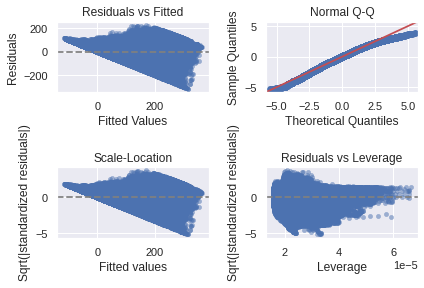

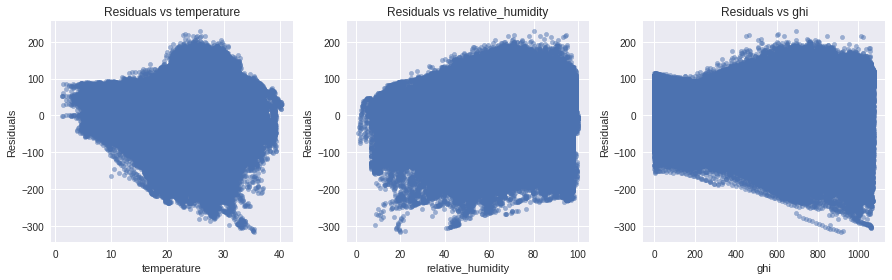

RMSE 61.17595546611372
AIC 9199456.496011311


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature + relative_humidity + ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_1'] = linear_model
eval_lm_model(models['LM_1'], data_solar_analytics_combine[['energy_generated','temperature','relative_humidity','ghi']])

#### Model Formula: energy_generated ~ temperature * relative_humidity * ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.713
Model:                            OLS   Adj. R-squared:                  0.713
Method:                 Least Squares   F-statistic:                 9.393e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:10:01   Log-Likelihood:            -4.5648e+06
No. Observations:              831369   AIC:                         9.130e+06
Df Residuals:                  831346   BIC:                         9.130e+06
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
C(site

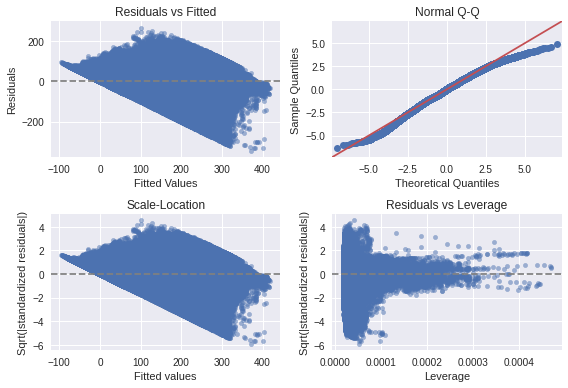

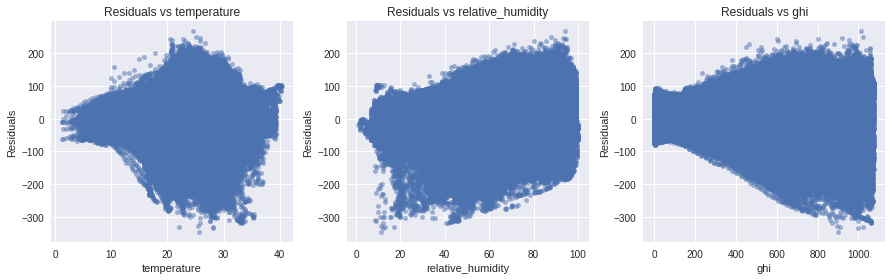

RMSE 58.66030354146842
AIC 9129644.481859222


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature * relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_2'] = linear_model
eval_lm_model(models['LM_2'], data_solar_analytics_combine[['energy_generated','temperature','relative_humidity','ghi']])

#### Model Formula: energy_generated ~ temperature * ghi + relative_humidity * ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.708
Model:                            OLS   Adj. R-squared:                  0.708
Method:                 Least Squares   F-statistic:                 1.006e+05
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:10:32   Log-Likelihood:            -4.5727e+06
No. Observations:              831369   AIC:                         9.145e+06
Df Residuals:                  831348   BIC:                         9.146e+06
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
C(site_id)[46273932]      29

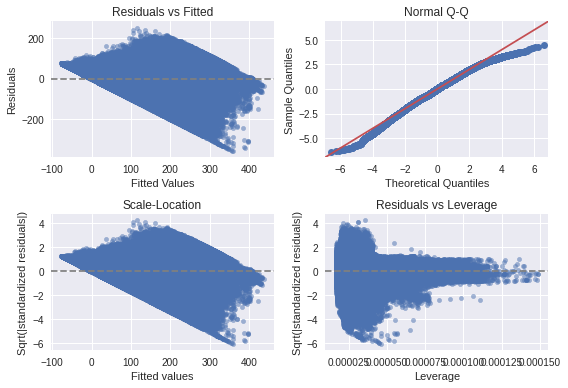

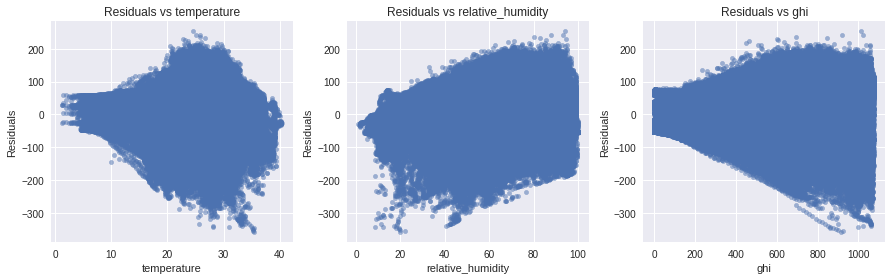

RMSE 59.21830564738065
AIC 9145382.40895129


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature * ghi + relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_3'] = linear_model
eval_lm_model(models['LM_3'], data_solar_analytics_combine[['energy_generated','temperature','relative_humidity','ghi']])

#### Model Formula: energy_generated ~ temperature * C(site_id)-1 + relative_humidity * C(site_id)-1 + ghi * C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.748
Model:                            OLS   Adj. R-squared:                  0.748
Method:                 Least Squares   F-statistic:                 3.917e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:11:27   Log-Likelihood:            -4.5109e+06
No. Observations:              831369   AIC:                         9.022e+06
Df Residuals:                  831305   BIC:                         9.023e+06
Df Model:                          63                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

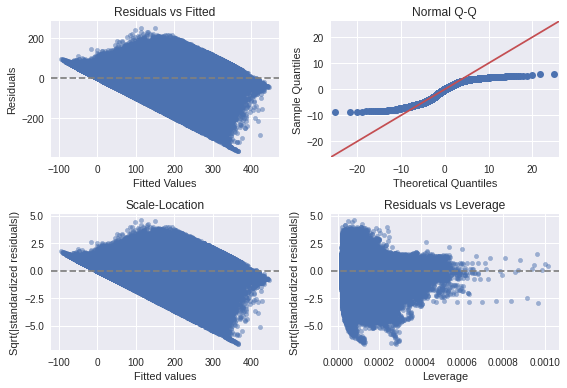

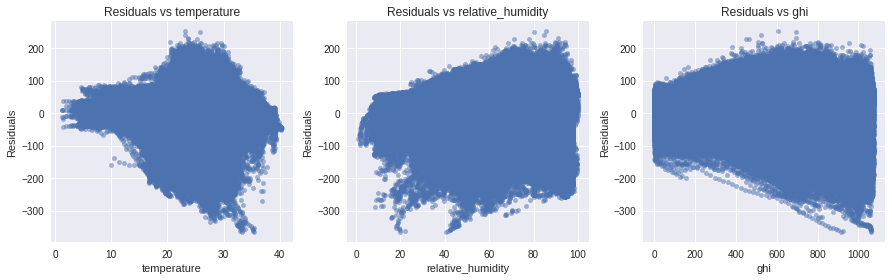

RMSE 54.97939029835969
AIC 9021973.003547564


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature * C(site_id) + relative_humidity * C(site_id) + ghi * C(site_id)', data = data_solar_analytics_combine).fit()
models['LM_4'] = linear_model
eval_lm_model(models['LM_4'], data_solar_analytics_combine[['energy_generated','temperature','relative_humidity','ghi']])

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.769
Model:                            OLS   Adj. R-squared:                  0.769
Method:                 Least Squares   F-statistic:                 2.912e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:12:35   Log-Likelihood:            -4.4749e+06
No. Observations:              831369   AIC:                         8.950e+06
Df Residuals:                  831273   BIC:                         8.951e+06
Df Model:                          95                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

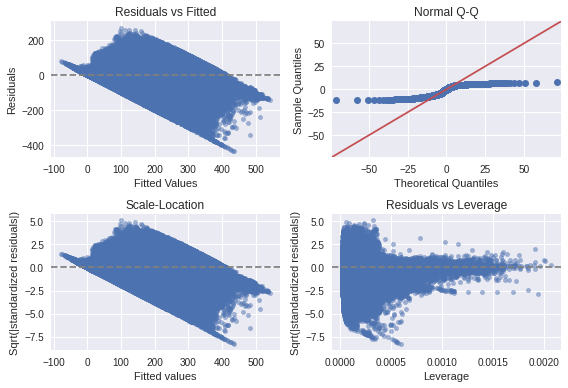

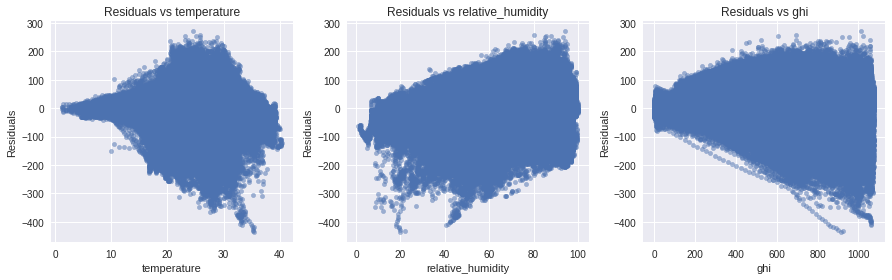

RMSE 52.645584577669986
AIC 8949914.043866009


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature * ghi * C(site_id)-1 + relative_humidity * ghi * C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_5'] = linear_model
eval_lm_model(models['LM_5'], data_solar_analytics_combine[['energy_generated','temperature','relative_humidity','ghi']])

#### Model Evaluations

In [ ]:
for model in models:
    print("R-Squared", model, ":", models[model].rsquared)

for model in models:
    print("RMSE", model, ":", get_rmse(models[model], data_solar_analytics_combine[['energy_generated']]))

for model in models:
    print("AIC", model, ":", get_aic(models[model]))    

R-Squared LM_1 : 0.6879828822164147
R-Squared LM_2 : 0.7131165396800496
R-Squared LM_3 : 0.7076326622437039
R-Squared LM_4 : 0.7479906016750604
R-Squared LM_5 : 0.7689314688377886
RMSE LM_1 : 61.17595546611372
RMSE LM_2 : 58.66030354146842
RMSE LM_3 : 59.21830564738065
RMSE LM_4 : 54.97939029835969
RMSE LM_5 : 52.645584577669986
AIC LM_1 : 9199456.496011311
AIC LM_2 : 9129644.481859222
AIC LM_3 : 9145382.40895129
AIC LM_4 : 9021973.003547564
AIC LM_5 : 8949914.043866009


#### Fitting a model with Polynomials

In [ ]:
# create the linear model - with polynomials
data_solar_analytics_combine['temperature_squared'] = data_solar_analytics_combine['temperature']**2
data_solar_analytics_combine['temperature_cube'] = data_solar_analytics_combine['temperature']**3

data_solar_analytics_combine['rh_squared'] = data_solar_analytics_combine['relative_humidity']**2
data_solar_analytics_combine['rh_cube'] = data_solar_analytics_combine['relative_humidity']**3

data_solar_analytics_combine['ghi_squared'] = data_solar_analytics_combine['ghi']**2
data_solar_analytics_combine['ghi_cube'] = data_solar_analytics_combine['ghi']**3

##### Model Formula: energy_generated ~ temperature + temperature_squared + relative_humidity + ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.689
Model:                            OLS   Adj. R-squared:                  0.689
Method:                 Least Squares   F-statistic:                 9.689e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:16:03   Log-Likelihood:            -4.5985e+06
No. Observations:              831369   AIC:                         9.197e+06
Df Residuals:                  831349   BIC:                         9.197e+06
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
C(site_id)[46273932]     223

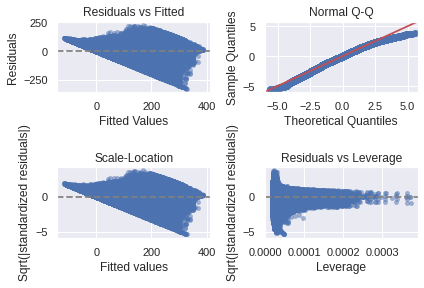

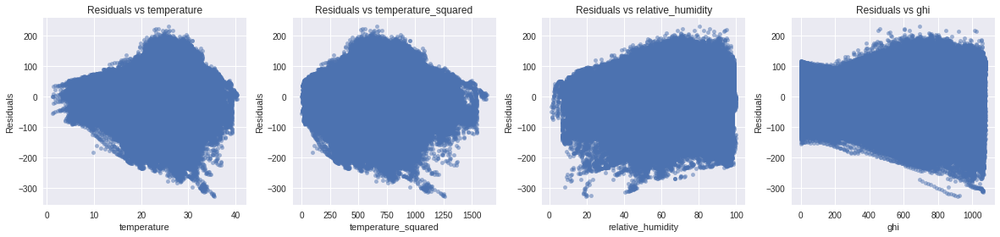

RMSE 61.087312524474164
AIC 9197047.469122477


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature + temperature_squared + relative_humidity + ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P1'] = linear_model
eval_lm_model(models['LM_P1'], data_solar_analytics_combine[['energy_generated','temperature','temperature_squared','relative_humidity','ghi']])

##### Model Formula: energy_generated ~ temperature + rh_squared + relative_humidity + ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.689
Model:                            OLS   Adj. R-squared:                  0.689
Method:                 Least Squares   F-statistic:                 9.713e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:16:35   Log-Likelihood:            -4.5978e+06
No. Observations:              831369   AIC:                         9.196e+06
Df Residuals:                  831349   BIC:                         9.196e+06
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
C(site_id)[46273932]     135

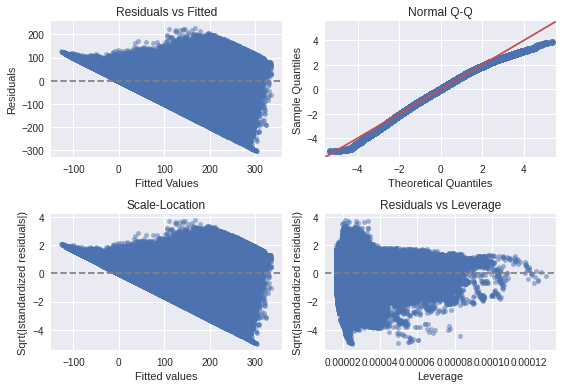

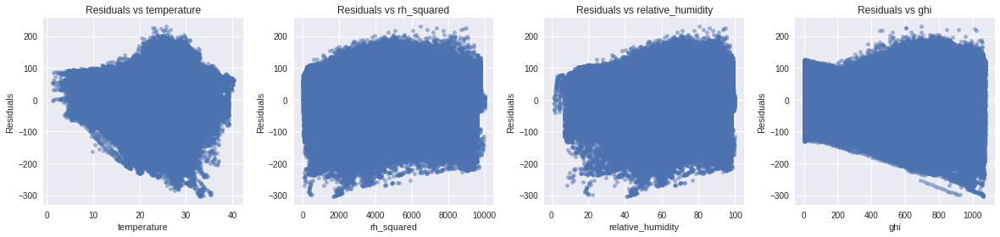

RMSE 61.03469893055217
AIC 9195614.76053373


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature + rh_squared + relative_humidity + ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P2'] = linear_model
eval_lm_model(models['LM_P2'], data_solar_analytics_combine[['energy_generated','temperature','rh_squared','relative_humidity','ghi']])

##### Model Formula: energy_generated ~ temperature + relative_humidity + ghi_squared + ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.688
Model:                            OLS   Adj. R-squared:                  0.688
Method:                 Least Squares   F-statistic:                 9.659e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:17:06   Log-Likelihood:            -4.5994e+06
No. Observations:              831369   AIC:                         9.199e+06
Df Residuals:                  831349   BIC:                         9.199e+06
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
C(site_id)[46273932]     172

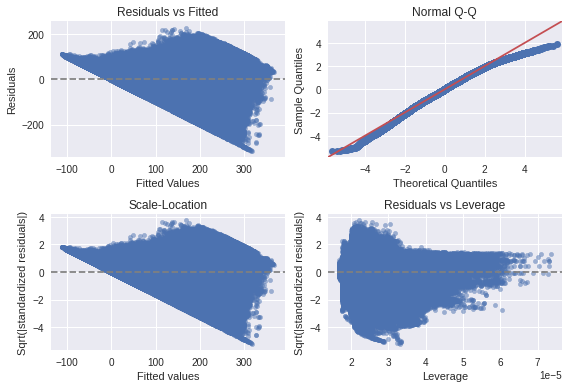

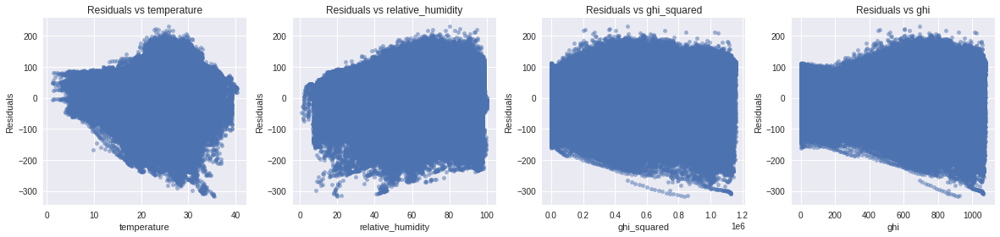

RMSE 61.15057401007627
AIC 9198768.495040383


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature + relative_humidity + ghi_squared + ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P3'] = linear_model
eval_lm_model(models['LM_P3'], data_solar_analytics_combine[['energy_generated','temperature','relative_humidity','ghi_squared','ghi']])

##### Model Formula: energy_generated ~ temperature_squared + relative_humidity + ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.688
Model:                            OLS   Adj. R-squared:                  0.688
Method:                 Least Squares   F-statistic:                 1.018e+05
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:17:36   Log-Likelihood:            -4.5998e+06
No. Observations:              831369   AIC:                         9.200e+06
Df Residuals:                  831350   BIC:                         9.200e+06
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
C(site_id)[46273932]     159

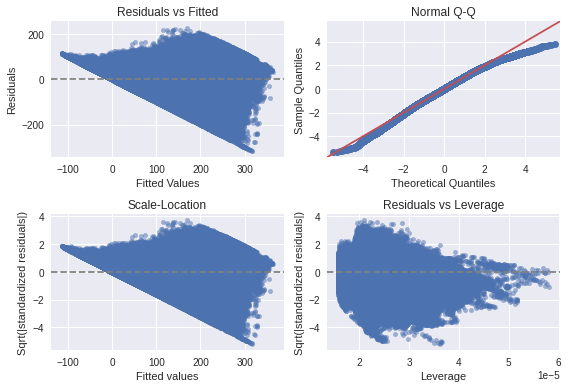

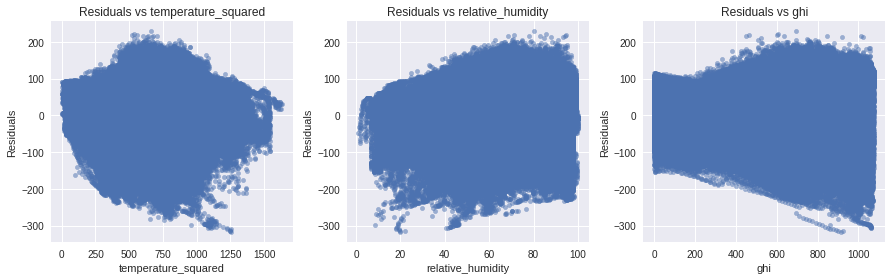

RMSE 61.18494884729203
AIC 9199700.914549153


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature_squared + relative_humidity + ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P4'] = linear_model
eval_lm_model(models['LM_P4'], data_solar_analytics_combine[['energy_generated','temperature_squared','relative_humidity','ghi']])

##### Model Formula: energy_generated ~ temperature_squared * temperature * relative_humidity * ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.717
Model:                            OLS   Adj. R-squared:                  0.717
Method:                 Least Squares   F-statistic:                 7.025e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:18:08   Log-Likelihood:            -4.5589e+06
No. Observations:              831369   AIC:                         9.118e+06
Df Residuals:                  831338   BIC:                         9.118e+06
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------

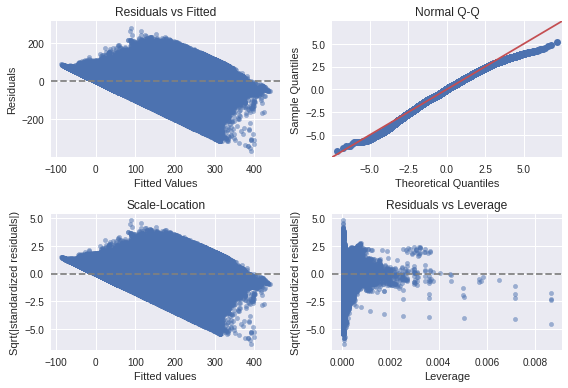

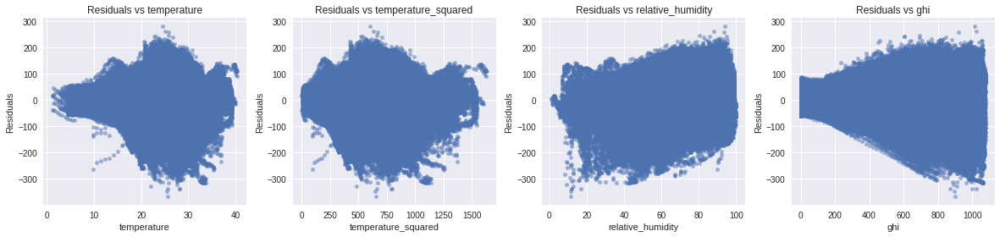

RMSE 58.24896313873966
AIC 9117959.884287588


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature_squared * temperature * relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P5'] = linear_model
eval_lm_model(models['LM_P5'], data_solar_analytics_combine[['energy_generated','temperature','temperature_squared','relative_humidity','ghi']])

##### Model Formula: energy_generated ~ temperature * rh_squared * relative_humidity * ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.722
Model:                            OLS   Adj. R-squared:                  0.722
Method:                 Least Squares   F-statistic:                 7.198e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:18:44   Log-Likelihood:            -4.5517e+06
No. Observations:              831369   AIC:                         9.103e+06
Df Residuals:                  831338   BIC:                         9.104e+06
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                                   coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------

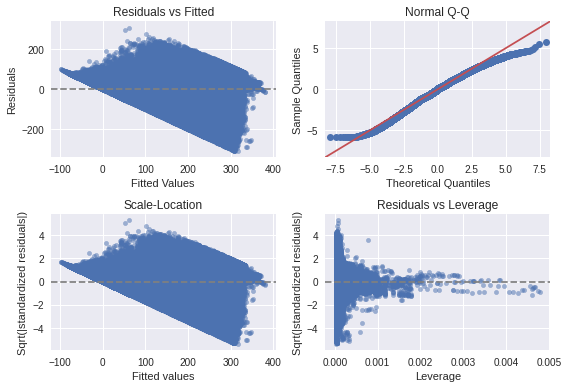

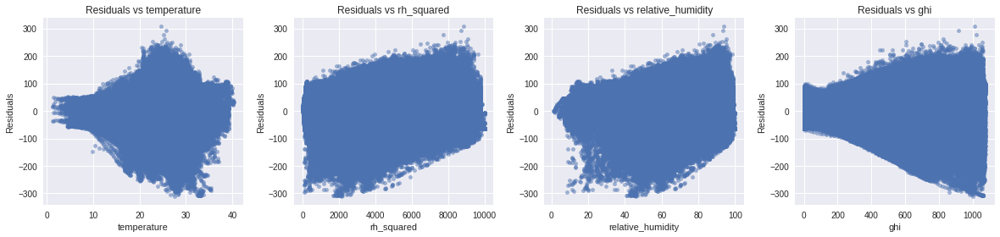

RMSE 57.7426742116936
AIC 9103444.507085215


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature * rh_squared * relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P6'] = linear_model
eval_lm_model(models['LM_P6'], data_solar_analytics_combine[['energy_generated','temperature','rh_squared','relative_humidity','ghi']])

##### Model Formula: energy_generated ~ temperature * relative_humidity * ghi_squared * ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.718
Model:                            OLS   Adj. R-squared:                  0.718
Method:                 Least Squares   F-statistic:                 7.286e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:19:22   Log-Likelihood:            -4.5582e+06
No. Observations:              831369   AIC:                         9.116e+06
Df Residuals:                  831339   BIC:                         9.117e+06
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

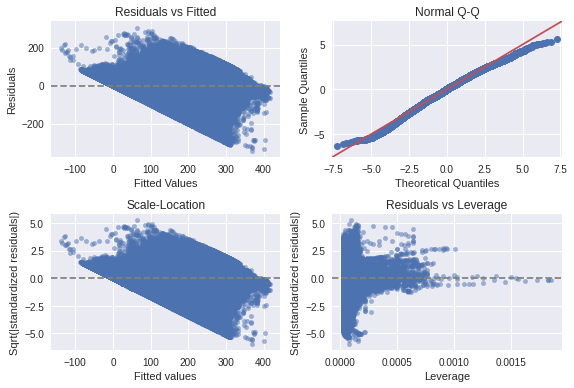

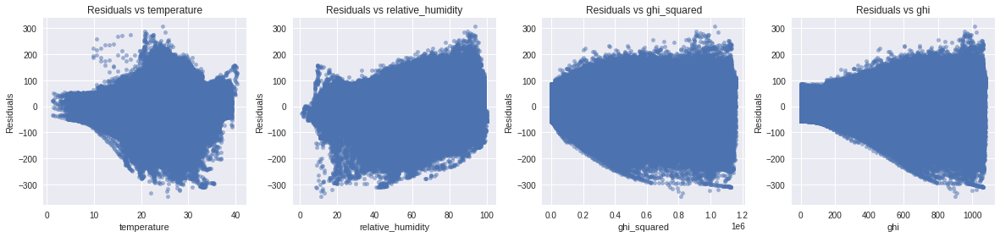

RMSE 58.19666859269378
AIC 9116464.446818858


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature * relative_humidity * ghi_squared * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P7'] = linear_model
eval_lm_model(models['LM_P7'], data_solar_analytics_combine[['energy_generated','temperature','relative_humidity','ghi_squared','ghi']])

##### Model Formula: energy_generated ~ temperature_squared * relative_humidity * ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.714
Model:                            OLS   Adj. R-squared:                  0.714
Method:                 Least Squares   F-statistic:                 9.421e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:19:56   Log-Likelihood:            -4.5639e+06
No. Observations:              831369   AIC:                         9.128e+06
Df Residuals:                  831346   BIC:                         9.128e+06
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

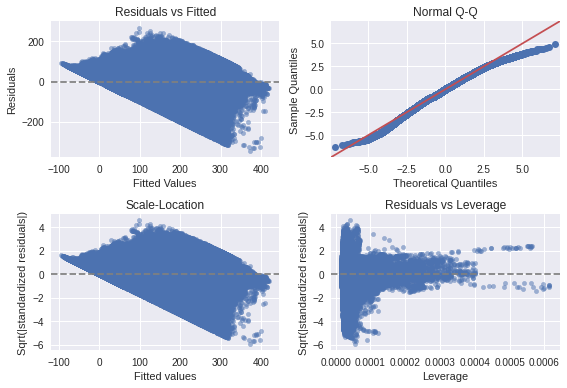

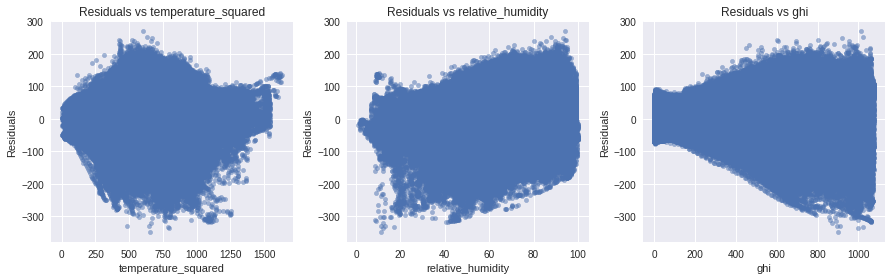

RMSE 58.599228676830265
AIC 9127912.400798675


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature_squared * relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P8'] = linear_model
eval_lm_model(models['LM_P8'], data_solar_analytics_combine[['energy_generated','temperature_squared','relative_humidity','ghi']])

##### Model Formula: energy_generated ~ temperature * rh_squared * ghi + C(site_id)-1

                                 OLS Regression Results                                
Dep. Variable:       energy_generated   R-squared (uncentered):                   0.880
Model:                            OLS   Adj. R-squared (uncentered):              0.880
Method:                 Least Squares   F-statistic:                          2.659e+05
Date:                Sat, 24 Oct 2020   Prob (F-statistic):                        0.00
Time:                        06:20:29   Log-Likelihood:                     -4.5561e+06
No. Observations:              831369   AIC:                                  9.112e+06
Df Residuals:                  831346   BIC:                                  9.112e+06
Df Model:                          23                                                  
Covariance Type:            nonrobust                                                  
                                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------

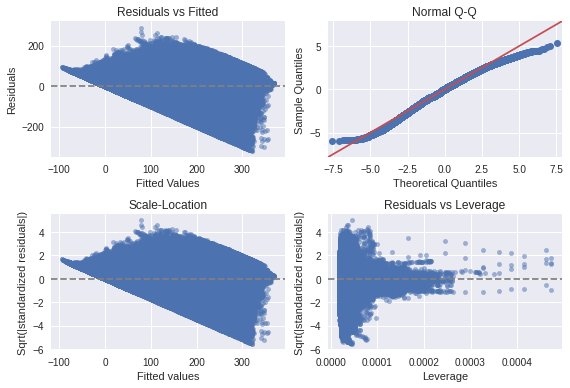

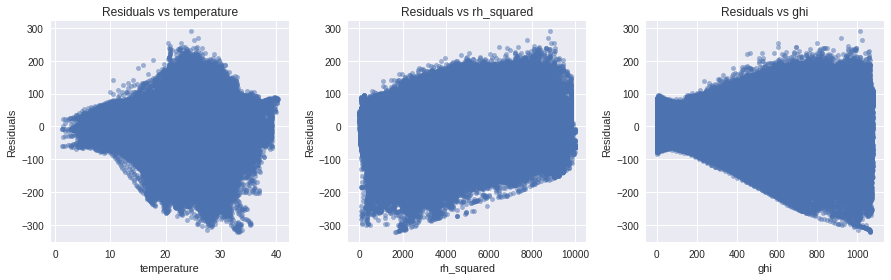

RMSE 58.04780814036431
AIC 9112191.903565172


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature * rh_squared * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P9'] = linear_model
eval_lm_model(models['LM_P9'], data_solar_analytics_combine[['energy_generated','temperature','rh_squared','ghi']])

##### Model Formula: energy_generated ~ temperature * relative_humidity * ghi_squared + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.688
Model:                            OLS   Adj. R-squared:                  0.688
Method:                 Least Squares   F-statistic:                 8.343e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:21:03   Log-Likelihood:            -4.5993e+06
No. Observations:              831369   AIC:                         9.199e+06
Df Residuals:                  831346   BIC:                         9.199e+06
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

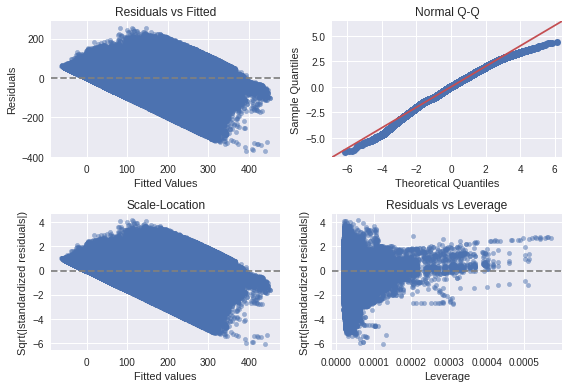

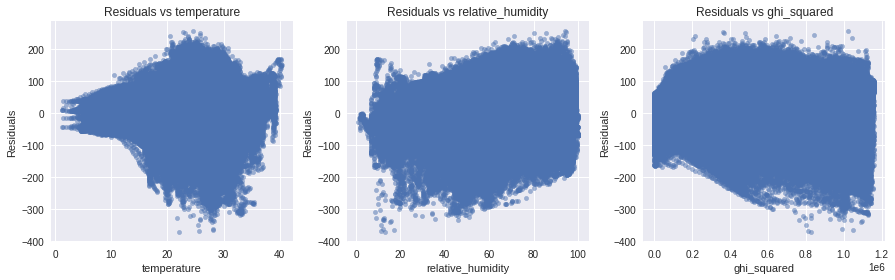

RMSE 61.148306286333714
AIC 9198712.83248989


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature * relative_humidity * ghi_squared + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P10'] = linear_model
eval_lm_model(models['LM_P10'], data_solar_analytics_combine[['energy_generated','temperature','relative_humidity','ghi_squared']])

##### Model Formula: energy_generated ~ temperature_squared * temperature * rh_squared * relative_humidity * ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.724
Model:                            OLS   Adj. R-squared:                  0.724
Method:                 Least Squares   F-statistic:                 5.074e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:21:49   Log-Likelihood:            -4.5486e+06
No. Observations:              831369   AIC:                         9.097e+06
Df Residuals:                  831325   BIC:                         9.098e+06
Df Model:                          43                                         
Covariance Type:            nonrobust                                         
                                                                       coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

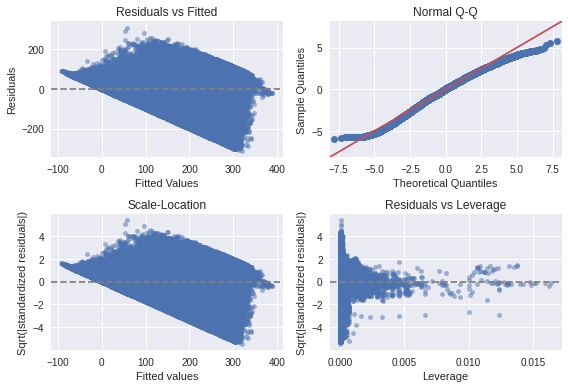

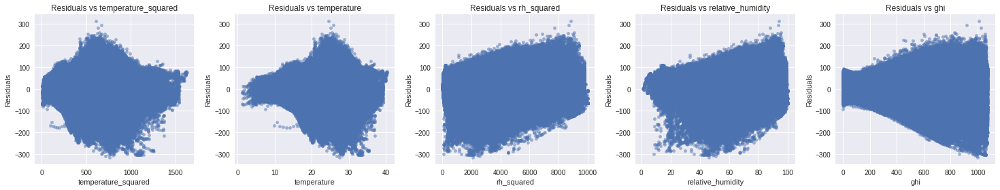

RMSE 57.526355955986645
AIC 9097229.784740752


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature_squared * temperature * rh_squared * relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P11'] = linear_model
eval_lm_model(models['LM_P11'], data_solar_analytics_combine[['energy_generated','temperature_squared','temperature','rh_squared','relative_humidity','ghi']])

##### Model Formula: energy_generated ~ temperature_squared * rh_squared * relative_humidity * ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.722
Model:                            OLS   Adj. R-squared:                  0.722
Method:                 Least Squares   F-statistic:                 7.199e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:22:28   Log-Likelihood:            -4.5517e+06
No. Observations:              831369   AIC:                         9.103e+06
Df Residuals:                  831338   BIC:                         9.104e+06
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                                           coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------

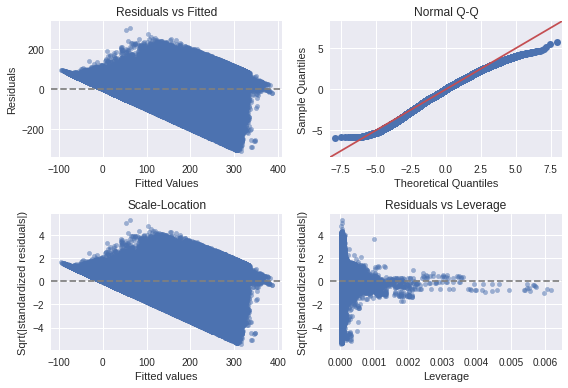

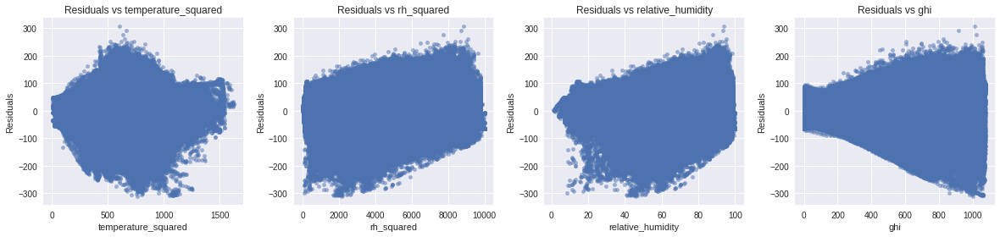

RMSE 57.74035810354474
AIC 9103377.811901439


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature_squared * rh_squared * relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P12'] = linear_model
eval_lm_model(models['LM_P12'], data_solar_analytics_combine[['energy_generated','temperature_squared','rh_squared','relative_humidity','ghi']])

##### Model Formula: energy_generated ~ temperature_cube * temperature_squared * temperature * rh_squared * relative_humidity * ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.578
Model:                            OLS   Adj. R-squared:                  0.578
Method:                 Least Squares   F-statistic:                 3.072e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:23:31   Log-Likelihood:            -4.7257e+06
No. Observations:              831369   AIC:                         9.451e+06
Df Residuals:                  831331   BIC:                         9.452e+06
Df Model:                          37                                         
Covariance Type:            nonrobust                                         
                                                                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------

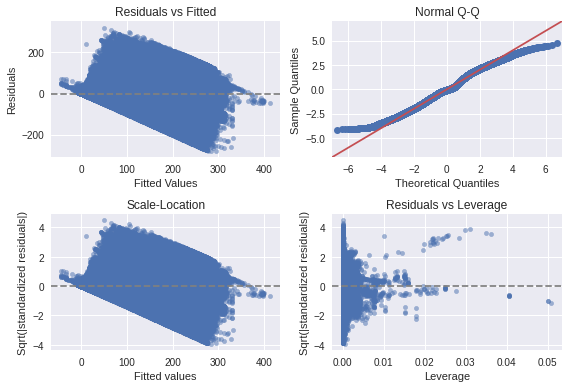

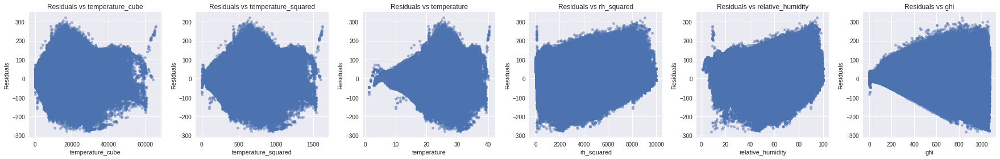

RMSE 71.18414355439175
AIC 9451425.678940903


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature_cube * temperature_squared * temperature * rh_squared * relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P13'] = linear_model
eval_lm_model(models['LM_P13'], data_solar_analytics_combine[['energy_generated','temperature_cube','temperature_squared','temperature','rh_squared','relative_humidity','ghi']])

##### Model Formula: energy_generated ~ temperature_cube * rh_squared * relative_humidity * ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.722
Model:                            OLS   Adj. R-squared:                  0.722
Method:                 Least Squares   F-statistic:                 7.444e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:24:11   Log-Likelihood:            -4.5518e+06
No. Observations:              831369   AIC:                         9.104e+06
Df Residuals:                  831339   BIC:                         9.104e+06
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                                        coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------

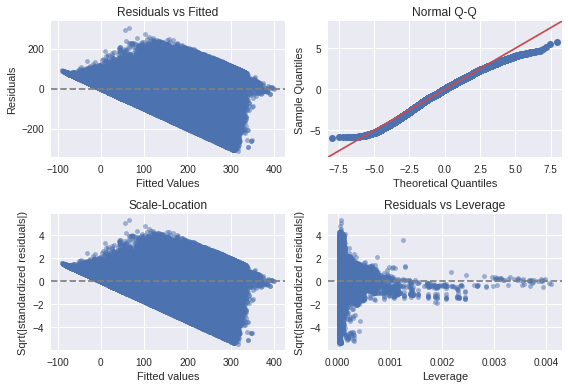

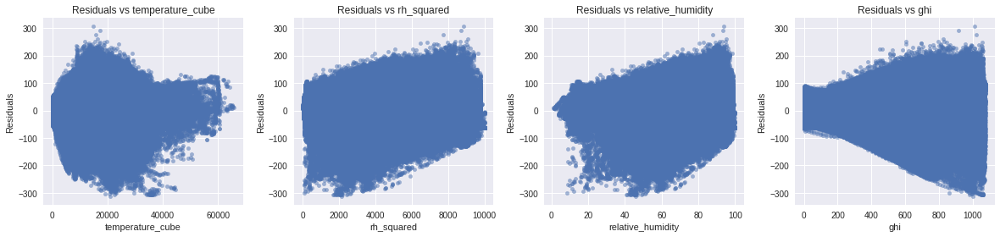

RMSE 57.747452680633444
AIC 9103580.100524697


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature_cube * rh_squared * relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P14'] = linear_model
eval_lm_model(models['LM_P14'], data_solar_analytics_combine[['energy_generated','temperature_cube','rh_squared','relative_humidity','ghi']])

##### Model Formula: energy_generated ~ temperature * rh_cube * rh_squared * relative_humidity * ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.575
Model:                            OLS   Adj. R-squared:                  0.575
Method:                 Least Squares   F-statistic:                 5.625e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:24:54   Log-Likelihood:            -4.7281e+06
No. Observations:              831369   AIC:                         9.456e+06
Df Residuals:                  831348   BIC:                         9.457e+06
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                           coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------

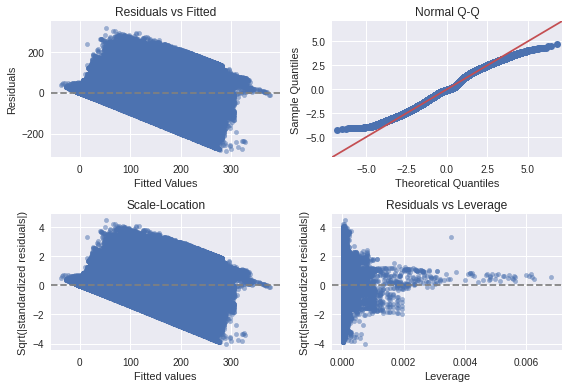

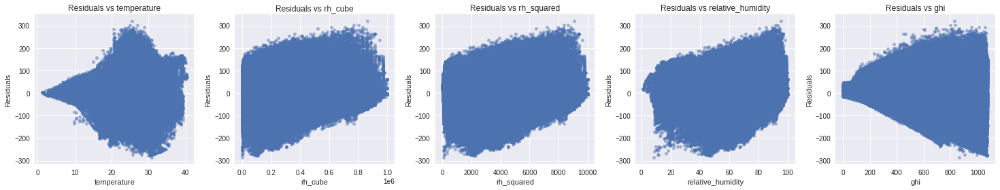

RMSE 71.39384105751172
AIC 9456282.648038257


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature * rh_cube * rh_squared * relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P15'] = linear_model
eval_lm_model(models['LM_P15'], data_solar_analytics_combine[['energy_generated','temperature','rh_cube','rh_squared','relative_humidity','ghi']])

##### Model Formula: energy_generated ~ temperature * relative_humidity * ghi_cube * ghi_squared * ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.567
Model:                            OLS   Adj. R-squared:                  0.567
Method:                 Least Squares   F-statistic:                 7.786e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:25:39   Log-Likelihood:            -4.7356e+06
No. Observations:              831369   AIC:                         9.471e+06
Df Residuals:                  831354   BIC:                         9.471e+06
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                             coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------

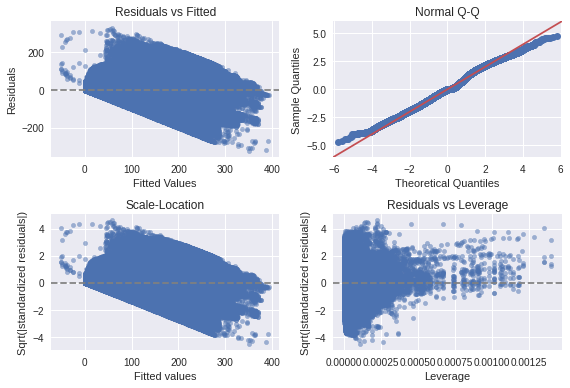

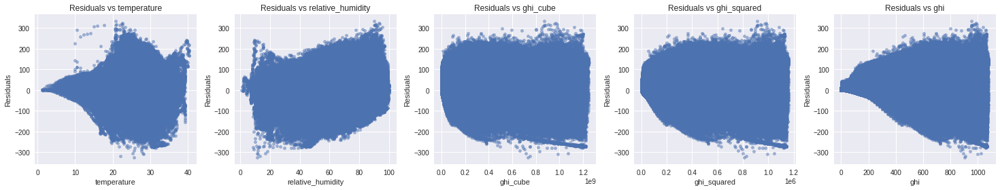

RMSE 72.04070320696584
AIC 9471268.005529625


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature * relative_humidity * ghi_cube * ghi_squared * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P16'] = linear_model
eval_lm_model(models['LM_P16'], data_solar_analytics_combine[['energy_generated','temperature','relative_humidity','ghi_cube','ghi_squared','ghi']])

##### Model Formula: energy_generated ~ temperature_cube * temperature_squared * temperature * relative_humidity * ghi + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.718
Model:                            OLS   Adj. R-squared:                  0.718
Method:                 Least Squares   F-statistic:                 5.578e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:26:23   Log-Likelihood:            -4.5572e+06
No. Observations:              831369   AIC:                         9.115e+06
Df Residuals:                  831330   BIC:                         9.115e+06
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
                                                                             coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

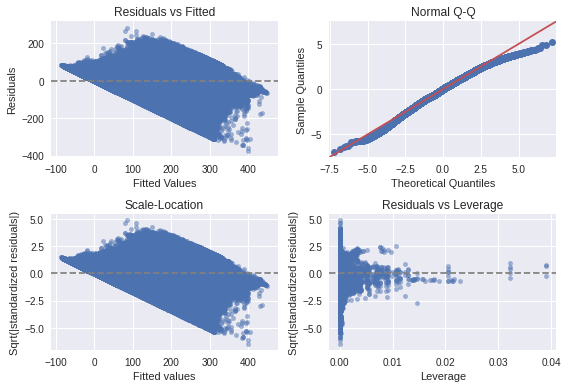

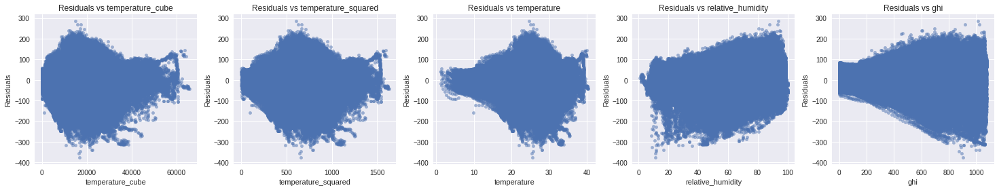

RMSE 58.127549772016664
AIC 9114506.478189176


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature_cube * temperature_squared * temperature * relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P17'] = linear_model
eval_lm_model(models['LM_P17'], data_solar_analytics_combine[['energy_generated','temperature_cube','temperature_squared','temperature','relative_humidity','ghi']])

##### Model Formula: energy_generated ~ temperature_squared + rh_squared + ghi_squared + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.673
Model:                            OLS   Adj. R-squared:                  0.673
Method:                 Least Squares   F-statistic:                 9.492e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:26:58   Log-Likelihood:            -4.6196e+06
No. Observations:              831369   AIC:                         9.239e+06
Df Residuals:                  831350   BIC:                         9.239e+06
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
C(site_id)[46273932]     171

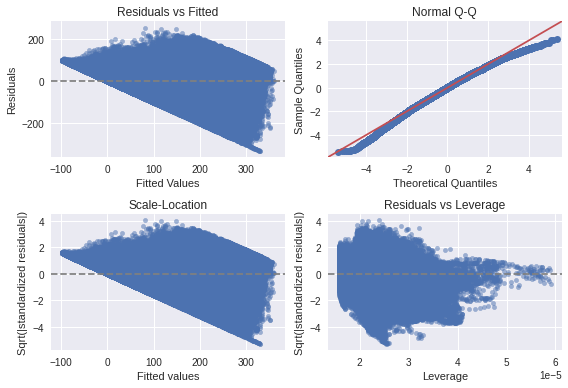

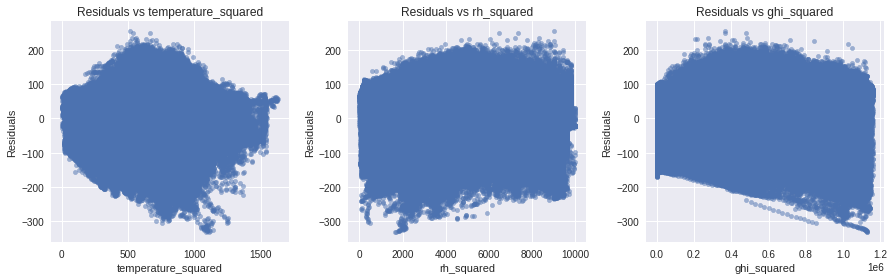

RMSE 62.65797625644448
AIC 9239257.05647376


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature_squared + rh_squared + ghi_squared + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P18'] = linear_model
eval_lm_model(models['LM_P18'], data_solar_analytics_combine[['energy_generated','temperature_squared','rh_squared','ghi_squared']])

##### Model Formula: energy_generated ~ temperature_cube + rh_squared + ghi_squared + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.673
Model:                            OLS   Adj. R-squared:                  0.673
Method:                 Least Squares   F-statistic:                 9.492e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:27:28   Log-Likelihood:            -4.6196e+06
No. Observations:              831369   AIC:                         9.239e+06
Df Residuals:                  831350   BIC:                         9.239e+06
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
C(site_id)[46273932]     168

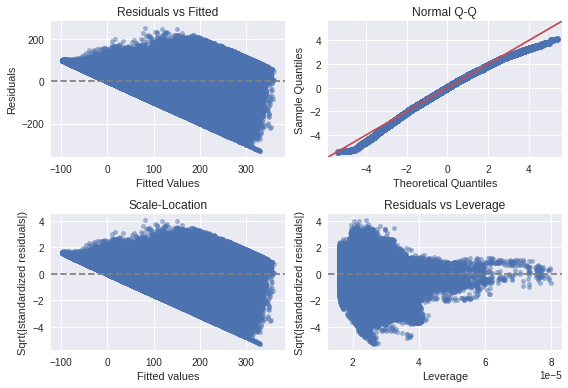

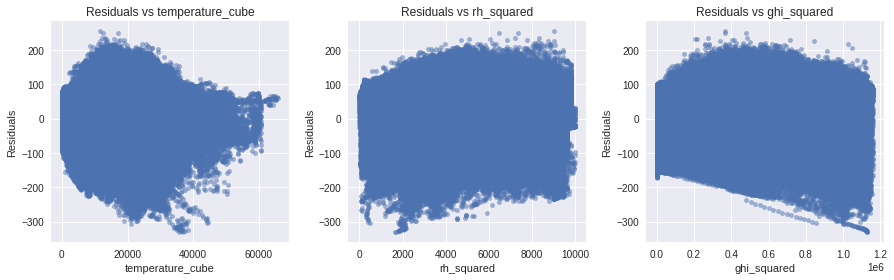

RMSE 62.65820861841104
AIC 9239263.222589845


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature_cube + rh_squared + ghi_squared + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P19'] = linear_model
eval_lm_model(models['LM_P19'], data_solar_analytics_combine[['energy_generated','temperature_cube','rh_squared','ghi_squared']])

##### Model Formula: energy_generated ~ temperature_squared + rh_cube + ghi_squared + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.671
Model:                            OLS   Adj. R-squared:                  0.671
Method:                 Least Squares   F-statistic:                 9.414e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:27:57   Log-Likelihood:            -4.6219e+06
No. Observations:              831369   AIC:                         9.244e+06
Df Residuals:                  831350   BIC:                         9.244e+06
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
C(site_id)[46273932]     150

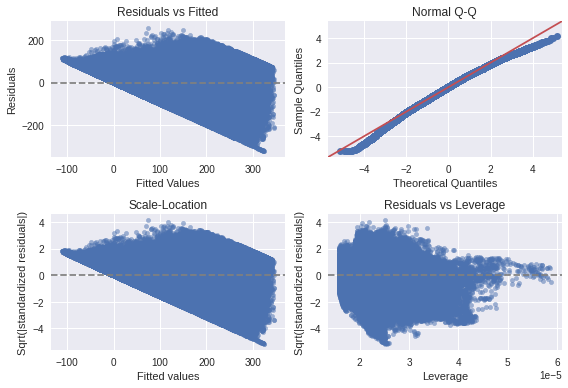

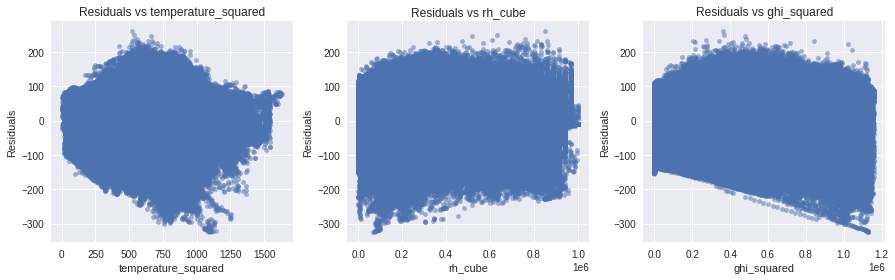

RMSE 62.83061595895319
AIC 9243832.050418653


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature_squared + rh_cube + ghi_squared + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P20'] = linear_model
eval_lm_model(models['LM_P20'], data_solar_analytics_combine[['energy_generated','temperature_squared','rh_cube','ghi_squared']])

##### Model Formula: energy_generated ~ temperature_squared + rh_squared + ghi_cube + C(site_id)-1

                                 OLS Regression Results                                
Dep. Variable:       energy_generated   R-squared (uncentered):                   0.846
Model:                            OLS   Adj. R-squared (uncentered):              0.846
Method:                 Least Squares   F-statistic:                          2.413e+05
Date:                Sat, 24 Oct 2020   Prob (F-statistic):                        0.00
Time:                        06:28:27   Log-Likelihood:                     -4.6596e+06
No. Observations:              831369   AIC:                                  9.319e+06
Df Residuals:                  831350   BIC:                                  9.319e+06
Df Model:                          19                                                  
Covariance Type:            nonrobust                                                  
                             coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------

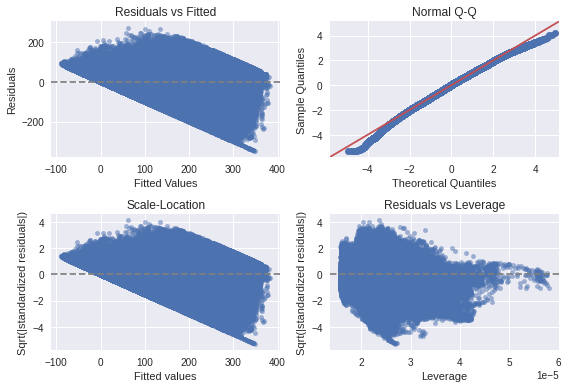

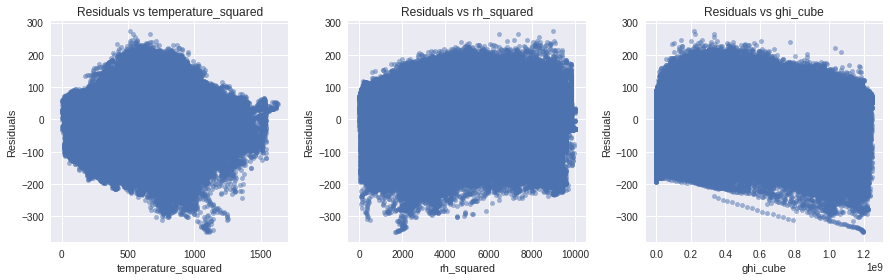

RMSE 65.74309750562009
AIC 9319174.39165906


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature_squared + rh_squared + ghi_cube + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_P21'] = linear_model
eval_lm_model(models['LM_P21'], data_solar_analytics_combine[['energy_generated','temperature_squared','rh_squared','ghi_cube']])

##### Model Evaluations

In [ ]:
for model in models:
    print("R-Squared", model, ":", models[model].rsquared)

for model in models:
    print("RMSE", model, ":", get_rmse(models[model], data_solar_analytics_combine[['energy_generated']]))

for model in models:
    print("AIC", model, ":", get_aic(models[model]))    

R-Squared LM_P1 : 0.6888864423448121
R-Squared LM_P2 : 0.68942212651905
R-Squared LM_P3 : 0.6882417357426731
R-Squared LM_P4 : 0.68789113717991
R-Squared LM_P5 : 0.7171258272177091
R-Squared LM_P6 : 0.7220218339562883
R-Squared LM_P7 : 0.7176335147490918
R-Squared LM_P8 : 0.7137136128678548
R-Squared LM_P9 : 0.880322524745235
R-Squared LM_P10 : 0.6882648579625472
R-Squared LM_P11 : 0.7241006818329515
R-Squared LM_P12 : 0.7220441333939962
R-Squared LM_P13 : 0.5775421084350806
R-Squared LM_P14 : 0.7219758241372985
R-Squared LM_P15 : 0.5750494508169198
R-Squared LM_P16 : 0.5673140575849147
R-Squared LM_P17 : 0.7183038365762658
R-Squared LM_P18 : 0.6726821978310119
R-Squared LM_P19 : 0.6726797701640563
R-Squared LM_P20 : 0.6708760145207646
R-Squared LM_P21 : 0.8464884376575902
RMSE LM_P1 : 61.087312524474164
RMSE LM_P2 : 61.03469893055217
RMSE LM_P3 : 61.15057401007627
RMSE LM_P4 : 61.18494884729203
RMSE LM_P5 : 58.24896313873966
RMSE LM_P6 : 57.7426742116936
RMSE LM_P7 : 58.19666859269378

#### Transformations

In [ ]:
# Try different transformations
# Log
data_solar_analytics_combine['energy_generated_log'] = np.log(1+data_solar_analytics_combine['energy_generated'])
data_solar_analytics_combine['temp_log'] = np.log(1+data_solar_analytics_combine['temperature'])
data_solar_analytics_combine['rh_log'] = np.log(1+data_solar_analytics_combine['relative_humidity'])
data_solar_analytics_combine['ghi_log'] = np.log(1+data_solar_analytics_combine['ghi'])

# Exponential
data_solar_analytics_combine['temp_exp'] = np.exp(1+data_solar_analytics_combine['temperature'])

# Square Root
data_solar_analytics_combine['energy_generated_sqrt'] = data_solar_analytics_combine['energy_generated']**(1/2)
data_solar_analytics_combine['temp_sqrt'] = data_solar_analytics_combine['temperature']**(1/2)
data_solar_analytics_combine['rh_sqrt'] = data_solar_analytics_combine['relative_humidity']**(1/2)
data_solar_analytics_combine['ghi_sqrt'] = data_solar_analytics_combine['ghi']**(1/2)

# Squared 
data_solar_analytics_combine['energy_generated_squared'] = data_solar_analytics_combine['energy_generated']**(2)

##### Model Formula: energy_generated_log ~ temperature * relative_humidity * ghi + C(site_id)-1

                             OLS Regression Results                             
Dep. Variable:     energy_generated_log   R-squared:                       0.727
Model:                              OLS   Adj. R-squared:                  0.727
Method:                   Least Squares   F-statistic:                 1.007e+05
Date:                  Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                          06:29:41   Log-Likelihood:            -9.5741e+05
No. Observations:                831369   AIC:                         1.915e+06
Df Residuals:                    831346   BIC:                         1.915e+06
Df Model:                            22                                         
Covariance Type:              nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------

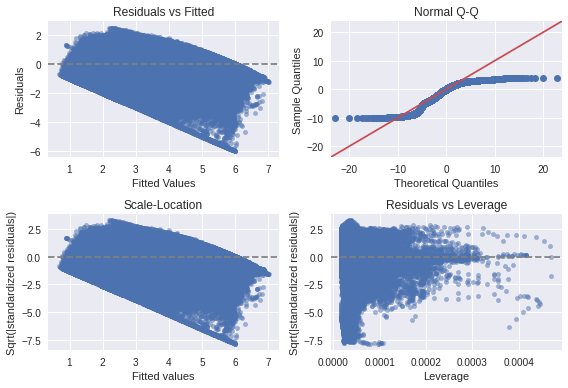

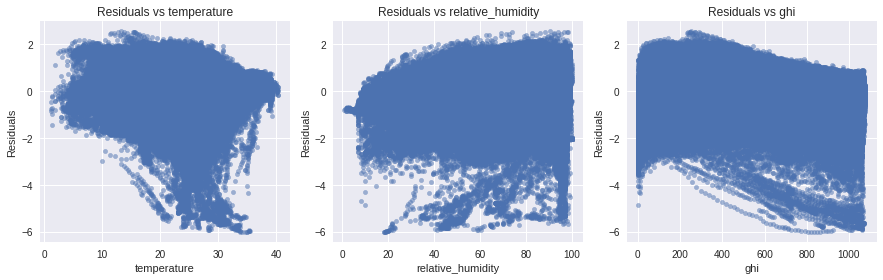

RMSE 0.7654187545252048
AIC 1914865.6056342265


In [ ]:
linear_model = smf.ols('energy_generated_log ~ temperature * relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_T1'] = linear_model
eval_lm_model(models['LM_T1'], data_solar_analytics_combine[['energy_generated_log','temperature','relative_humidity','ghi']])

##### Model Formula: energy_generated_sqrt ~ temperature * relative_humidity * ghi + C(site_id)-1

                              OLS Regression Results                             
Dep. Variable:     energy_generated_sqrt   R-squared:                       0.762
Model:                               OLS   Adj. R-squared:                  0.762
Method:                    Least Squares   F-statistic:                 1.207e+05
Date:                   Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                           06:30:08   Log-Likelihood:            -1.9790e+06
No. Observations:                 831369   AIC:                         3.958e+06
Df Residuals:                     831346   BIC:                         3.958e+06
Df Model:                             22                                         
Covariance Type:               nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

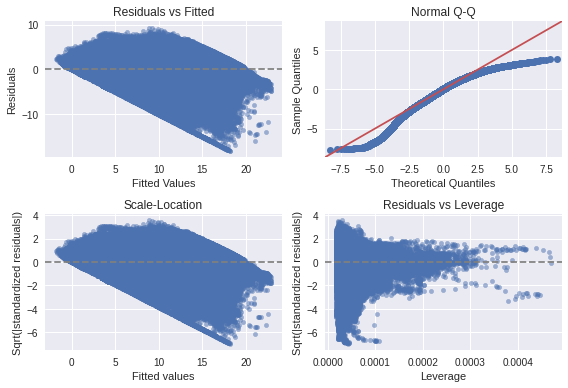

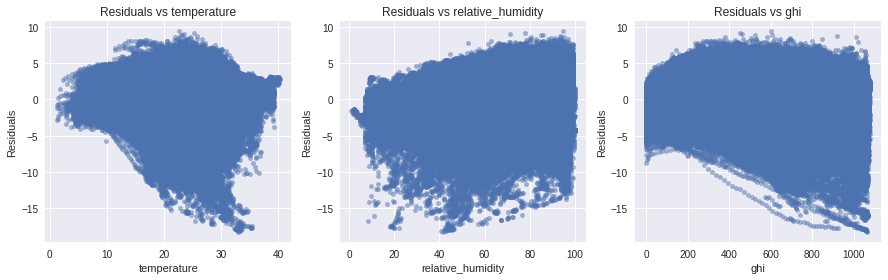

RMSE 2.6154693180926065
AIC 3957997.749184818


In [ ]:
linear_model = smf.ols('energy_generated_sqrt ~ temperature * relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_T2'] = linear_model
eval_lm_model(models['LM_T2'], data_solar_analytics_combine[['energy_generated_sqrt','temperature','relative_humidity','ghi']])

##### Model Formula: energy_generated_squared ~ temperature * relative_humidity * ghi + C(site_id)-1

                               OLS Regression Results                               
Dep. Variable:     energy_generated_squared   R-squared:                       0.596
Model:                                  OLS   Adj. R-squared:                  0.596
Method:                       Least Squares   F-statistic:                 5.575e+04
Date:                      Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                              06:30:37   Log-Likelihood:            -9.5714e+06
No. Observations:                    831369   AIC:                         1.914e+07
Df Residuals:                        831346   BIC:                         1.914e+07
Df Model:                                22                                         
Covariance Type:                  nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------

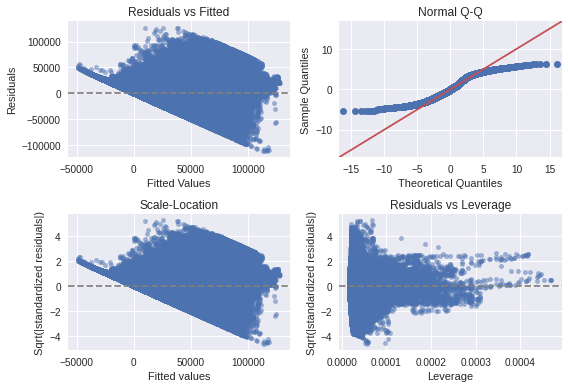

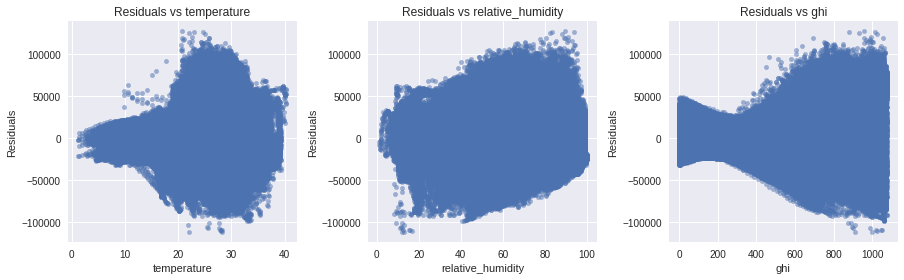

RMSE 24195.44170227304
AIC 19142912.598598383


In [ ]:
linear_model = smf.ols('energy_generated_squared ~ temperature * relative_humidity * ghi + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_T3'] = linear_model
eval_lm_model(models['LM_T3'], data_solar_analytics_combine[['energy_generated_squared','temperature','relative_humidity','ghi']])

#### Scaling all indepedent variables

In [ ]:
data_solar_analytics_combine['temp_scaled'] = preprocessing.scale(data_solar_analytics_combine['temperature'])
data_solar_analytics_combine['rh_scaled'] = preprocessing.scale(data_solar_analytics_combine['relative_humidity'])
data_solar_analytics_combine['ghi_scaled'] = preprocessing.scale(data_solar_analytics_combine['ghi'])
data_solar_analytics_combine['temp_log'] = np.log(1+data_solar_analytics_combine['temperature'])
data_solar_analytics_combine['rh_log'] = np.log(1+data_solar_analytics_combine['relative_humidity'])
data_solar_analytics_combine['ghi_log'] = np.log(1+data_solar_analytics_combine['ghi'])
data_solar_analytics_combine['temp_scaled_log'] = np.log(1+data_solar_analytics_combine['temp_scaled'])
data_solar_analytics_combine['rh_scaled_log'] = np.log(1+data_solar_analytics_combine['rh_scaled'])
data_solar_analytics_combine['ghi_scaled_log'] = np.log(1+data_solar_analytics_combine['ghi_scaled'])

##### Model Formula: energy_generated ~ temp_scaled * rh_scaled * ghi_scaled + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.713
Model:                            OLS   Adj. R-squared:                  0.713
Method:                 Least Squares   F-statistic:                 9.393e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:31:21   Log-Likelihood:            -4.5648e+06
No. Observations:              831369   AIC:                         9.130e+06
Df Residuals:                  831346   BIC:                         9.130e+06
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
C(site_i

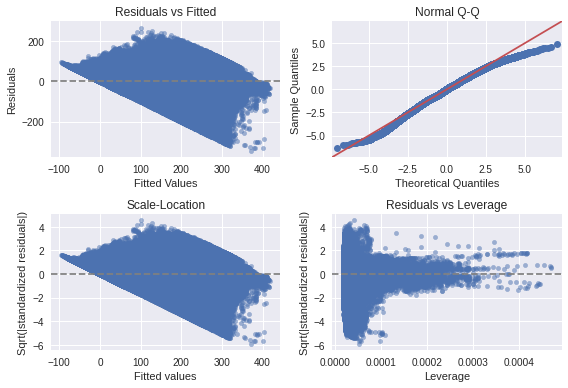

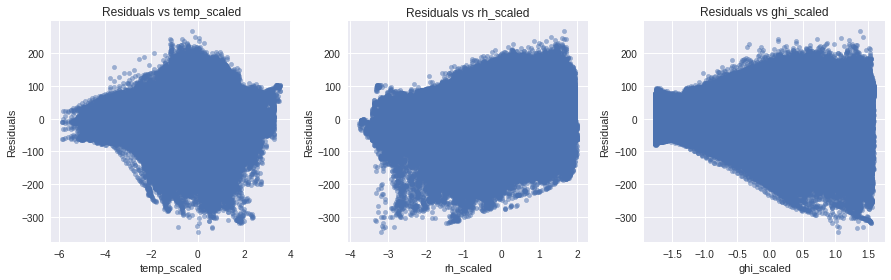

RMSE 58.66030354146843
AIC 9129644.481859222


In [ ]:
linear_model = smf.ols('energy_generated ~ temp_scaled * rh_scaled * ghi_scaled + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_S1'] = linear_model
eval_lm_model(models['LM_S1'], data_solar_analytics_combine[['energy_generated','temp_scaled','rh_scaled','ghi_scaled']])

In [ ]:
data_solar_analytics_combine['temp_scaled_squared'] = data_solar_analytics_combine['temp_scaled']**2
data_solar_analytics_combine['rh_scaled_squared'] = data_solar_analytics_combine['rh_scaled']**2
data_solar_analytics_combine['ghi_scaled_squared'] = data_solar_analytics_combine['ghi_scaled']**2
data_solar_analytics_combine['ghi_scaled_cube'] = data_solar_analytics_combine['ghi_scaled']**3

##### Model Formula: energy_generated ~ temperature_scaled_squared + rh_scaled_squared + ghi_scaled_cube + C(site_id)-1

                            OLS Regression Results                            
Dep. Variable:       energy_generated   R-squared:                       0.539
Model:                            OLS   Adj. R-squared:                  0.539
Method:                 Least Squares   F-statistic:                 5.400e+04
Date:                Sat, 24 Oct 2020   Prob (F-statistic):               0.00
Time:                        06:31:54   Log-Likelihood:            -4.7620e+06
No. Observations:              831369   AIC:                         9.524e+06
Df Residuals:                  831350   BIC:                         9.524e+06
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
C(site_id)[46273932]     165

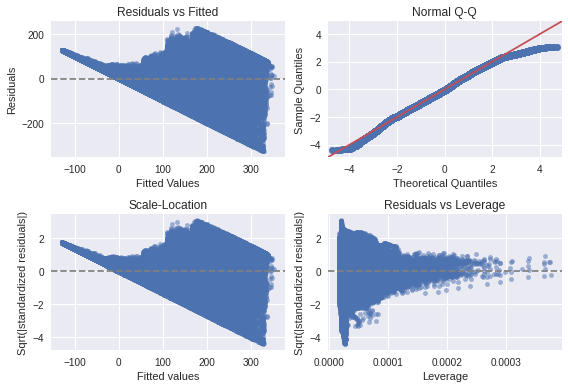

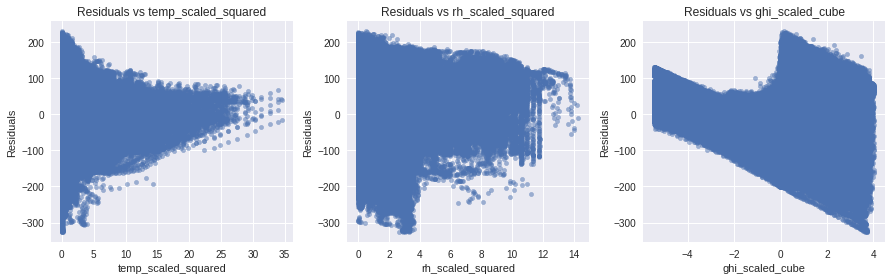

RMSE 74.3612689892097
AIC 9523991.362272527


In [ ]:
linear_model = smf.ols('energy_generated ~ temp_scaled_squared + rh_scaled_squared + ghi_scaled_cube + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_S2'] = linear_model
eval_lm_model(models['LM_S2'], data_solar_analytics_combine[['energy_generated','temp_scaled_squared','rh_scaled_squared','ghi_scaled_cube']])

##### Model Summary

In [ ]:
for model in models:
    print("R-Squared", model, ":", models[model].rsquared)

for model in models:
    print("RMSE", model, ":", get_rmse(models[model], data_solar_analytics_combine[['energy_generated']]))

for model in models:
    print("AIC", model, ":", get_aic(models[model]))    

R-Squared LM_P1 : 0.6888864423448121
R-Squared LM_P2 : 0.68942212651905
R-Squared LM_P3 : 0.6882417357426731
R-Squared LM_P4 : 0.68789113717991
R-Squared LM_P5 : 0.7171258272177091
R-Squared LM_P6 : 0.7220218339562883
R-Squared LM_P7 : 0.7176335147490918
R-Squared LM_P8 : 0.7137136128678548
R-Squared LM_P9 : 0.880322524745235
R-Squared LM_P10 : 0.6882648579625472
R-Squared LM_P11 : 0.7241006818329515
R-Squared LM_P12 : 0.7220441333939962
R-Squared LM_P13 : 0.5775421084350806
R-Squared LM_P14 : 0.7219758241372985
R-Squared LM_P15 : 0.5750494508169198
R-Squared LM_P16 : 0.5673140575849147
R-Squared LM_P17 : 0.7183038365762658
R-Squared LM_P18 : 0.6726821978310119
R-Squared LM_P19 : 0.6726797701640563
R-Squared LM_P20 : 0.6708760145207646
R-Squared LM_P21 : 0.8464884376575902
R-Squared LM_T1 : 0.7271322569326606
R-Squared LM_T2 : 0.7615798505706746
R-Squared LM_T3 : 0.5960043373754531
R-Squared LM_S1 : 0.7131165396800494
R-Squared LM_S2 : 0.5389898538220526
RMSE LM_P1 : 61.087312524474164

#### Best Model

                                 OLS Regression Results                                
Dep. Variable:       energy_generated   R-squared (uncentered):                   0.846
Model:                            OLS   Adj. R-squared (uncentered):              0.846
Method:                 Least Squares   F-statistic:                          2.413e+05
Date:                Sun, 25 Oct 2020   Prob (F-statistic):                        0.00
Time:                        06:57:18   Log-Likelihood:                     -4.6596e+06
No. Observations:              831369   AIC:                                  9.319e+06
Df Residuals:                  831350   BIC:                                  9.319e+06
Df Model:                          19                                                  
Covariance Type:            nonrobust                                                  
                             coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------

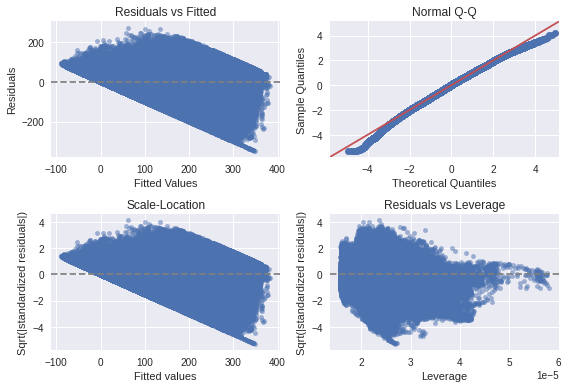

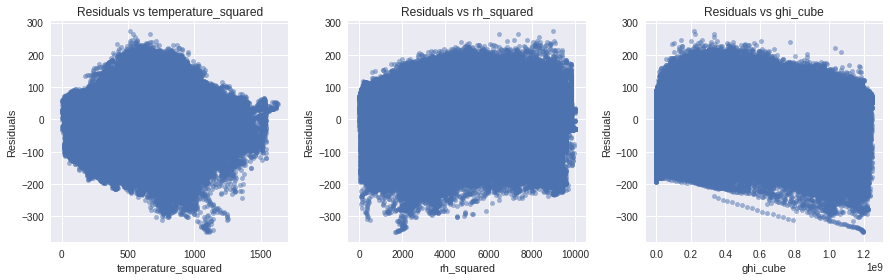

RMSE 65.74309750562009
AIC 9319174.39165906


In [ ]:
linear_model = smf.ols('energy_generated ~ temperature_squared + rh_squared + ghi_cube + C(site_id)-1', data = data_solar_analytics_combine).fit()
models['LM_BEST'] = linear_model
eval_lm_model(models['LM_BEST'], data_solar_analytics_combine[['energy_generated','temperature_squared','rh_squared','ghi_cube']])